<img src="header-all.jpg"/>

# Imports

In [1]:
# Import des librairies
import time
import itertools
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import cycler
import seaborn as sns
import datetime

import math
import os
from os import listdir
from os.path import isfile, join
import shutil
import pickle

c:\users\public\wpython\v_3.7.6\soft\python-3.7.6.amd64\lib\site-packages\statsmodels\tools\_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [2]:
from PIL import Image

In [3]:
# Tokenizer
import nltk
from nltk.tokenize import sent_tokenize, word_tokenize

In [4]:
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer, PorterStemmer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

In [5]:
from wordcloud import WordCloud

In [6]:
from gensim.scripts.glove2word2vec import glove2word2vec
from gensim.models.fasttext import FastText

In [7]:
from sklearn import cluster, metrics
from sklearn import manifold, decomposition
from sklearn.preprocessing import StandardScaler, MinMaxScaler

In [8]:
import tensorflow as tf
import tensorflow_hub as hub
import tensorflow.keras
from tensorflow.keras import backend as K
import tensorflow_text

from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras import metrics as kmetrics
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model
import gensim

import transformers
# from transformers import * # Moche

os.environ["TF_KERAS"]='1'

In [9]:
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.model_selection import GridSearchCV, KFold

In [10]:
# Modules perso
%load_ext autoreload
# %reload_ext autoreload
%autoreload 2

In [11]:
import DisplotData
import DisplotML
from DisplotData import bcolors
from DisplotData import print_debug

In [12]:
LAUNCH_DOE = False

# Chargement des données

In [13]:
path = './Dataset+projet+pretraitement+textes+images/Flipkart/' # à adapter = répertoire de stockage du dataset
data_00 = pd.read_csv(path + 'flipkart_com-ecommerce_sample_1050.csv')

In [14]:
data_00.head()

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa..."
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",..."
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52 +0000,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJT9UQWHDUBH4,2699.0,1299.0,d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...,No rating available,No rating available,SANTOSH ROYAL FASHION,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
4,6325b6870c54cd47be6ebfbffa620ec7,2016-06-20 08:49:52 +0000,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJTHNGWVGWWQU,2599.0,698.0,6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...,No rating available,No rating available,Jaipur Print,"{""product_specification""=>[{""key""=>""Machine Wa..."


In [15]:
data_00.shape

(1050, 15)

In [16]:
data_00.columns

Index(['uniq_id', 'crawl_timestamp', 'product_url', 'product_name',
       'product_category_tree', 'pid', 'retail_price', 'discounted_price',
       'image', 'is_FK_Advantage_product', 'description', 'product_rating',
       'overall_rating', 'brand', 'product_specifications'],
      dtype='object')

# Exploration des données

## Rôle des colonnes

In [17]:
data_00.columns

Index(['uniq_id', 'crawl_timestamp', 'product_url', 'product_name',
       'product_category_tree', 'pid', 'retail_price', 'discounted_price',
       'image', 'is_FK_Advantage_product', 'description', 'product_rating',
       'overall_rating', 'brand', 'product_specifications'],
      dtype='object')

### `uniq_id`

La colonne `uniq_id` joue le rôle de clé du produit.

### `crawl_timestamp`

### `product_url`

### `product_name`

In [18]:
data_00['product_name'].values

array(['Elegance Polyester Multicolor Abstract Eyelet Door Curtain',
       'Sathiyas Cotton Bath Towel',
       'Eurospa Cotton Terry Face Towel Set', ...,
       'Uberlyfe Extra Large Pigmented Polyvinyl Films (Imported) Sticker',
       'Wallmantra Medium Vinyl Sticker Sticker',
       'Uberlyfe Large Vinyl Sticker'], dtype=object)

Cette colonne est vachement cool pour pré-décrire le produit !

### `product_category_tree`

On va ne pas tricher.

In [19]:
data_00['product_category_tree'].values[12]

'["Watches >> Wrist Watches >> Lois Caron Wrist Watches"]'

In [20]:
data_00['product_category_tree'].values[125]

'["Beauty and Personal Care >> Body and Skin Care >> Hand Care >> Manicure and Kits >> Sally Hansen Manicure and Kits"]'

Enoncé : pas de classification supervisée ! Mais comment calculer un score ARI ?!
--> Yann : exploiter quand même les catégories, pour évaluer la qualité des approches. Donc apprendre les "labels". 

Comptons le nombre de catégories "feuilles" du dataset :

In [21]:
categs_final = data_00['product_category_tree']
categs_final.value_counts().shape

(642,)

Ca fait beaucoup. Et beaucoup de produits seront seuls dans leur catégorie :

In [22]:
categs_final.value_counts()

["Home Furnishing >> Bed Linen >> Blankets, Quilts & Dohars"]                         56
["Kitchen & Dining >> Coffee Mugs >> Prithish Coffee Mugs"]                           26
["Watches >> Wrist Watches >> Maxima Wrist Watches"]                                  23
["Kitchen & Dining >> Coffee Mugs >> Rockmantra Coffee Mugs"]                         22
["Home Furnishing >> Bath Linen >> Towels"]                                           19
                                                                                      ..
["Home Decor & Festive Needs >> Showpieces >> Ethnic >> Infinity India Ethnic"]        1
["Home Decor & Festive Needs >> Showpieces >> Ethnic >> Ravishing Variety Ethnic"]     1
["Home Decor & Festive Needs >> Showpieces >> Ethnic >> Pg handicrafts Ethnic"]        1
["Home Decor & Festive Needs >> Showpieces >> Ethnic >> Homedesires Ethnic"]           1
["Watches >> Wrist Watches >> Petrol Wrist Watches"]                                   1
Name: product_categor

In [23]:
categs_1st = [str(c).split(" >> ")[0].replace('["','') for c in categs_final.values]
print(list(np.unique(categs_1st)))
print(len(np.unique(categs_1st)))

['Baby Care', 'Beauty and Personal Care', 'Computers', 'Home Decor & Festive Needs', 'Home Furnishing', 'Kitchen & Dining', 'Watches']
7


In [24]:
categs_1st

['Home Furnishing',
 'Baby Care',
 'Baby Care',
 'Home Furnishing',
 'Home Furnishing',
 'Watches',
 'Watches',
 'Watches',
 'Watches',
 'Watches',
 'Watches',
 'Watches',
 'Watches',
 'Watches',
 'Watches',
 'Watches',
 'Watches',
 'Watches',
 'Watches',
 'Watches',
 'Watches',
 'Watches',
 'Watches',
 'Watches',
 'Watches',
 'Watches',
 'Watches',
 'Watches',
 'Watches',
 'Watches',
 'Watches',
 'Watches',
 'Watches',
 'Home Furnishing',
 'Home Furnishing',
 'Home Furnishing',
 'Home Decor & Festive Needs',
 'Kitchen & Dining',
 'Kitchen & Dining',
 'Home Furnishing',
 'Baby Care',
 'Home Furnishing',
 'Baby Care',
 'Beauty and Personal Care',
 'Kitchen & Dining',
 'Kitchen & Dining',
 'Kitchen & Dining',
 'Computers',
 'Kitchen & Dining',
 'Beauty and Personal Care',
 'Kitchen & Dining',
 'Computers',
 'Kitchen & Dining',
 'Computers',
 'Computers',
 'Computers',
 'Beauty and Personal Care',
 'Beauty and Personal Care',
 'Beauty and Personal Care',
 'Beauty and Personal Care',
 'Bea

In [25]:
data_00['categs_1st'] = categs_1st
data_00['categs_1st']

0       Home Furnishing
1             Baby Care
2             Baby Care
3       Home Furnishing
4       Home Furnishing
             ...       
1045          Baby Care
1046          Baby Care
1047          Baby Care
1048          Baby Care
1049          Baby Care
Name: categs_1st, Length: 1050, dtype: object

In [26]:
data_00['categs_1st'].value_counts()

Home Furnishing               150
Baby Care                     150
Watches                       150
Home Decor & Festive Needs    150
Kitchen & Dining              150
Beauty and Personal Care      150
Computers                     150
Name: categs_1st, dtype: int64

On obtient 7 catégories parfaitement équilibrées, cela paraît suffisant pour couvrir le dataset. 

In [27]:
data_00['categs_1st'].unique()

array(['Home Furnishing', 'Baby Care', 'Watches',
       'Home Decor & Festive Needs', 'Kitchen & Dining',
       'Beauty and Personal Care', 'Computers'], dtype=object)

Si on pousse au deuxième rang :

In [28]:
categs_2nd = [str(c).split(" >> ")[0:2] for c in categs_final.values]

categs_2nd = [" >> ".join(c) for c in categs_2nd]
categs_2nd = [c.replace('["','') for c in categs_2nd]
categs_2nd = [c.replace('"]','') for c in categs_2nd]
categs_2nd

['Home Furnishing >> Curtains & Accessories',
 'Baby Care >> Baby Bath & Skin',
 'Baby Care >> Baby Bath & Skin',
 'Home Furnishing >> Bed Linen',
 'Home Furnishing >> Bed Linen',
 'Watches >> Wrist Watches',
 'Watches >> Wrist Watches',
 'Watches >> Wrist Watches',
 'Watches >> Wrist Watches',
 'Watches >> Wrist Watches',
 'Watches >> Wrist Watches',
 'Watches >> Wrist Watches',
 'Watches >> Wrist Watches',
 'Watches >> Wrist Watches',
 'Watches >> Wrist Watches',
 'Watches >> Wrist Watches',
 'Watches >> Wrist Watches',
 'Watches >> Wrist Watches',
 'Watches >> Wrist Watches',
 'Watches >> Wrist Watches',
 'Watches >> Wrist Watches',
 'Watches >> Wrist Watches',
 'Watches >> Wrist Watches',
 'Watches >> Wrist Watches',
 'Watches >> Wrist Watches',
 'Watches >> Wrist Watches',
 'Watches >> Wrist Watches',
 'Watches >> Wrist Watches',
 'Watches >> Wrist Watches',
 'Watches >> Wrist Watches',
 'Watches >> Wrist Watches',
 'Watches >> Wrist Watches',
 'Watches >> Wrist Watches',
 'Home F

In [29]:
print(len(np.unique(categs_2nd)))

62


In [30]:
for c in list(np.unique(categs_2nd)):
    print(c)

Baby Care >> Baby & Kids Gifts
Baby Care >> Baby Bath & Skin
Baby Care >> Baby Bedding
Baby Care >> Baby Grooming
Baby Care >> Diapering & Potty Training
Baby Care >> Feeding & Nursing
Baby Care >> Furniture & Furnishings
Baby Care >> Infant Wear
Baby Care >> Strollers & Activity Gear
Beauty and Personal Care >> Bath and Spa
Beauty and Personal Care >> Beauty Accessories
Beauty and Personal Care >> Body and Skin Care
Beauty and Personal Care >> Combos and Kits
Beauty and Personal Care >> Eye Care
Beauty and Personal Care >> Fragrances
Beauty and Personal Care >> Hair Care
Beauty and Personal Care >> Health Care
Beauty and Personal Care >> Makeup
Beauty and Personal Care >> Men's Grooming
Beauty and Personal Care >> Women's Hygiene
Computers >> Computer Components
Computers >> Computer Peripherals
Computers >> Laptop Accessories
Computers >> Laptops
Computers >> Network Components
Computers >> Software
Computers >> Storage
Computers >> Tablet Accessories
Home Decor & Festive Needs >> Ca

63 catégories, ça fait à nouveau beaucoup, mais on verra plus tard ce que la classif non supervisée nous apporte et si certaintes catégories de rang 2 sont identifiées.

In [31]:
data_00['categs_2nd'] = categs_2nd

### `pid`

### `retail_price`

### `discounted_price`

### `image`

In [32]:
data_00['image'].values

array(['55b85ea15a1536d46b7190ad6fff8ce7.jpg',
       '7b72c92c2f6c40268628ec5f14c6d590.jpg',
       '64d5d4a258243731dc7bbb1eef49ad74.jpg', ...,
       '5912e037d12774bb73a2048f35a00009.jpg',
       'c3edc504d1b4f0ba6224fa53a43a7ad6.jpg',
       'f2f027ad6a6df617c9f125173da71e44.jpg'], dtype=object)

Cette colonne nous permettra d'associer l'image dans le répertoire d'images :

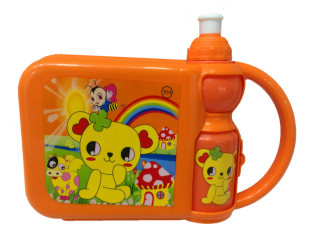

In [33]:
id = data_00.loc[69, 'image']
id

DisplotData.display_external_images([path+f"Images/{id}"])

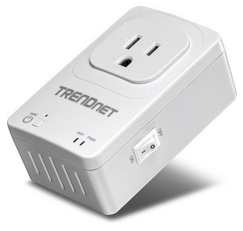

In [34]:
id = data_00.loc[345, 'image']
id

DisplotData.display_external_images([path+f"Images/{id}"])

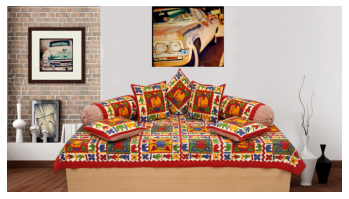

In [35]:
id = data_00.loc[78, 'image']
id

DisplotData.display_external_images([path+f"Images/{id}"])

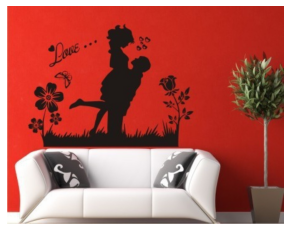

In [36]:
id = data_00.loc[85, 'image']
id

DisplotData.display_external_images([path+f"Images/{id}"])

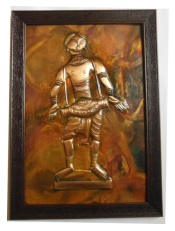

In [37]:
id = data_00.loc[94, 'image']
id

DisplotData.display_external_images([path+f"Images/{id}"])

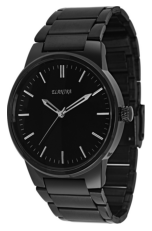

In [38]:
id = data_00.loc[29, 'image']
id

DisplotData.display_external_images([path+f"Images/{id}"])

In [39]:
data_00.loc[29, 'description']

'Elantra S 10 Analog Watch  - For Boys, Men - Buy Elantra S 10 Analog Watch  - For Boys, Men  S 10 Online at Rs.950 in India Only at Flipkart.com. - Great Discounts, Only Genuine Products, 30 Day Replacement Guarantee, Free Shipping. Cash On Delivery!'

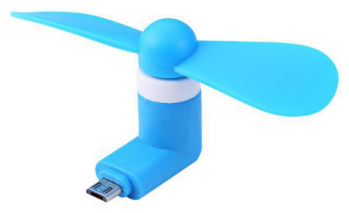

In [40]:
id = data_00.loc[53, 'image']
id

DisplotData.display_external_images([path+f"Images/{id}"])

In [41]:
data_00.loc[53, 'description']

'Key Features of JRB 1038 Smallest Mobile Powered By OTG Enabled Android Smart Phone Portable 1038 USB Fan System Requirements: OTG Enabled Android Smart Phone Material: Plastic,Specifications of JRB 1038 Smallest Mobile Powered By OTG Enabled Android Smart Phone Portable 1038 USB Fan (Multicolor) General Brand JRB Type USB Fan Model Name 1038 Smallest Mobile Powered By OTG Enabled Android Smart Phone Material Plastic System Requirements OTG Enabled Android Smart Phone Model ID Portable 1038 Color Multicolor In the Box Sales Package 1 MICRO USB FAN'

In [42]:
data_00.loc[53, 'product_name']

'JRB 1038 Smallest Mobile Powered By OTG Enabled Android Smart Phone Portable 1038 USB Fan'

### `is_FK_Advantage_product`

### `description`

In [43]:
data_00['description'].values

array(['Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room so t

Baby Care :
---------


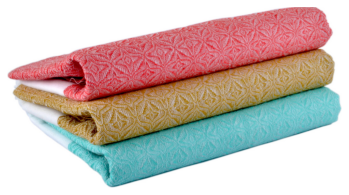

[Baby Care] Product name : Sathiyas Cotton Bath Towel
[Baby Care] Description  : Specifications of Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Yellow, Blue) Bath Towel Features Machine Washable Yes Material Cotton Design Self Design General Brand Sathiyas Type Bath Towel GSM 500 Model Name Sathiyas cotton bath towel Ideal For Men, Women, Boys, Girls Model ID asvtwl322 Color Red, Yellow, Blue Size Mediam Dimensions Length 30 inch Width 60 inch In the Box Number of Contents in Sales Package 3 Sales Package 3 Bath Towel


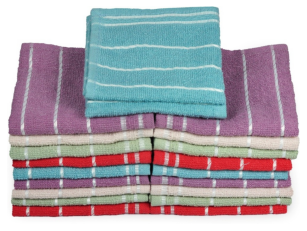

[Baby Care] Product name : Eurospa Cotton Terry Face Towel Set
[Baby Care] Description  : Key Features of Eurospa Cotton Terry Face Towel Set Size: small Height: 9 inch GSM: 360,Eurospa Cotton Terry Face Towel Set (20 PIECE FACE TOWEL SET, Assorted) Price: Rs. 299 Eurospa brings to you an exclusively designed, 100% soft cotton towels of export quality. All our products have soft texture that takes care of your skin and gives you that enriched feeling you deserve. Eurospa has been exporting its bath towels to lot of renowned brands for last 10 years and is famous for its fine prints, absorbency, softness and durability. NOTE: Our product is 100% cotton, so it is susceptible to shrinkage. Product color may vary from the picture. Size may vary by ±3% WASH CARE: Wash in cold Water, Do not Iron, Do not Bleach, Flat dry, Wash before first use. SIZE- FACE TOWEL - 23 cms X 23 cms.,Specifications of Eurospa Cotton Terry Face Towel Set (20 PIECE FACE TOWEL SET, Assorted) Bath Towel Features Mate

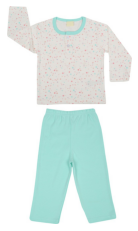

[Baby Care] Product name : Mom and Kid Baby Girl's Printed Green Top & Pyjama Set
[Baby Care] Description  : Key Features of Mom and Kid Baby Girl's Printed Green Top & Pyjama Set Fabric: Cotton Brand Color: Green,Mom and Kid Baby Girl's Printed Green Top & Pyjama Set Price: Rs. 309 Girls Pyjama set,Specifications of Mom and Kid Baby Girl's Printed Green Top & Pyjama Set General Details Pattern Printed Ideal For Baby Girl's Night Suit Details Fabric Cotton Type Top & Pyjama Set Neck Round Neck In the Box 1 Top & Pyjama Set


Beauty and Personal Care :
------------------------


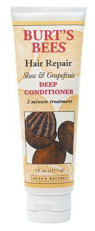

[Beauty and Personal Care] Product name : Burt s Bees Hair Repair Shea And Grapefruit Deep Conditioner
[Beauty and Personal Care] Description  : Key Features of Burt s Bees Hair Repair Shea And Grapefruit Deep Conditioner Ideal For: Boys, Girls Applied For: Deep Conditioning Hair Condition: Damaged Hair Hair Type: Dry Hair,Specifications of Burt s Bees Hair Repair Shea And Grapefruit Deep Conditioner (147.5 ml) Conditioner Traits Hair Condition Damaged Hair Hair Type Dry Hair Applied For Deep Conditioning Ideal For Boys, Girls General Traits Brand Burt s Bees Quantity 147.5 ml Model Name Hair Repair Shea And Grapefruit Deep Conditioner In the Box 1 Conditioner


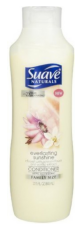

[Beauty and Personal Care] Product name : Suave Naturals Everlasting Sunshine Conditioner
[Beauty and Personal Care] Description  : Key Features of Suave Naturals Everlasting Sunshine Conditioner Ideal For: Boys, Girls Applied For: Conditioning Hair Condition: Damaged Hair Hair Type: Dry Hair,Specifications of Suave Naturals Everlasting Sunshine Conditioner (665 ml) Conditioner Traits Hair Condition Damaged Hair Hair Type Dry Hair Applied For Conditioning Ideal For Boys, Girls General Traits Brand Suave Quantity 665 ml Model Name Naturals Everlasting Sunshine Conditioner In the Box 1 Conditioner


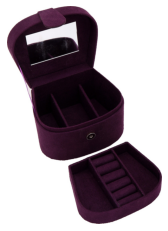

[Beauty and Personal Care] Product name : Borse N16 Make Up And Jewellery Vanity Case
[Beauty and Personal Care] Description  : Buy Borse N16 Make Up And Jewellery Vanity Case for Rs.680 online. Borse N16 Make Up And Jewellery Vanity Case at best prices with FREE shipping & cash on delivery. Only Genuine Products. 30 Day Replacement Guarantee.


Computers :
---------


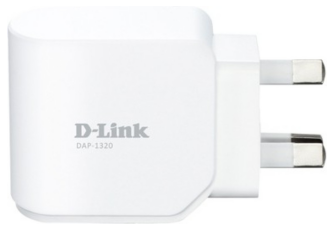

[Computers] Product name : D-Link DAP1320
[Computers] Description  : Key Features of D-Link DAP1320 QRS app(iOS,Android),Specifications of D-Link DAP1320 (White) Speed Wireless Speed 300 Mbps DSL Modem Speed 300 Mbps General Brand D-Link In The Box Extender Plug Model DAP1320 Type Range Extenders/Repeaters Color White Warranty Covered in Warranty No damage Warranty Summary 3years Service Type No damage Not Covered in Warranty damaged will not repair Dimensions Weight 69 g Connectivity Number of Antennae 2 Number of USB Ports 0 Antennae Internal Supported Protocols Standard IEEE IEEE 802.11n/g/b Operating Conditions Operating Humidity Operating: 10% to 90% non-condensing // Storage: 5% to 95% non-condensing Temperature Operating: 0 to 40 °C (32 to 104 °F)//Storage: -20 to 65 °C (-4 to 149 °F) degree C Additional Features Certification FCC, IC, CE


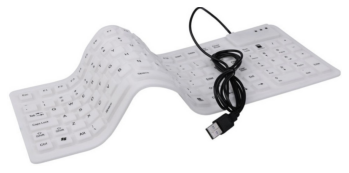

[Computers] Product name : RoQ Slim Multimedia 105key Flexible Wired USB Flexible Keyboard
[Computers] Description  : Key Features of RoQ Slim Multimedia 105key Flexible Wired USB Flexible Keyboard Size: Handheld,RoQ Slim Multimedia 105key Flexible Wired USB Flexible Keyboard (White) Price: Rs. 399 Working Environment. It Fits Easily In Your Briefcase Or Backpack. The Keyboard Can Be Cleaned With Water, Alcohol Or Disinfectant To Help Prevent The Spread Of The Disease And Germs. It Is Suitable For Public Place Use Such As School, Restaurant, Or Hospital Where Clean Keyboard Is A Requirement. This Sealed Keyboard Can Be Easily Cleaned, Also Good For Use In Dusty Area Such As Factory, Or Outdoor. Quiet Keystroke Is A Good Match For Library Use. If You Are Not Used To This Keyboard, You May Push These Keys A Tiny Bit Harder To Get Output. Dustproof Washable Usb Plug Weight: 0.45lbs (200g) Operation Temperature Is -20c- +60c. Storage Temperature Is -30c - +70c,Specifications of RoQ Slim Mu

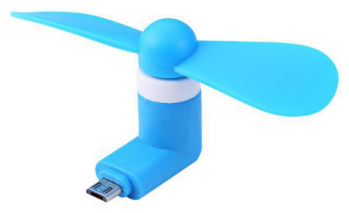

[Computers] Product name : JRB 1038 Smallest Mobile Powered By OTG Enabled Android Smart Phone Portable 1038 USB Fan
[Computers] Description  : Key Features of JRB 1038 Smallest Mobile Powered By OTG Enabled Android Smart Phone Portable 1038 USB Fan System Requirements: OTG Enabled Android Smart Phone Material: Plastic,Specifications of JRB 1038 Smallest Mobile Powered By OTG Enabled Android Smart Phone Portable 1038 USB Fan (Multicolor) General Brand JRB Type USB Fan Model Name 1038 Smallest Mobile Powered By OTG Enabled Android Smart Phone Material Plastic System Requirements OTG Enabled Android Smart Phone Model ID Portable 1038 Color Multicolor In the Box Sales Package 1 MICRO USB FAN


Home Decor & Festive Needs :
--------------------------


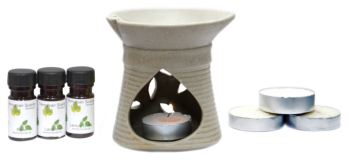

[Home Decor & Festive Needs] Product name : Myesquire Ceramic Burner Pot Lemongrass Liquid Air Freshener
[Home Decor & Festive Needs] Description  : Myesquire Ceramic Burner Pot Lemongrass Liquid Air Freshener (30 ml)
                         Price: Rs. 245
				
			Illuminate Every Corner Of Your Living Room In Style With This Home Fragrance Electric Burner Combo With Fragrance That Is Brought To You By Myesquire. This Is A Very Unique, Useful And Value for Money Product For Home Decoration And Fragrance. This Unique Combo Contains Aroma Burner With All Accessories and is ready to use . Put A Small Amount 1-2 Tea Spoon Of Aroma Oil On The Bowl Surface And Light The Tea Light and After Few Minutes As The Oil Heats Up, The Fragrance Will Spread In The Room. And You Will Be All Set To Enjoy The Captivating Aroma. Keep It Away From Children As Surface Becomes Hot.
Illuminate Every Corner Of Your Living Room In Style With This Home Fragrance Electric Burner Combo With Fragrance That Is Brou

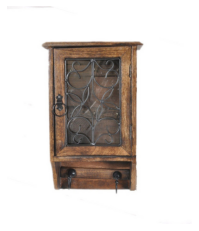

[Home Decor & Festive Needs] Product name : VarEesha Wooden Key Holder
[Home Decor & Festive Needs] Description  : Key Features of VarEesha Wooden Key Holder Hand made using wrought iron and mango wood Color - Brown Material - Sheesham wood Care instructions : Clean with a wet cloth and wipe gently.,VarEesha Wooden Key Holder (8 Hooks, Multicolor) Price: Rs. 1,199 Traditional design combined with utility, this wood and iron designed keybox is a convenient place to store all your keys. The iron design has a glass back to protect from dust and makes this box very manageable. Has 6 hooks inside for your keys which are less frequently used and 2 bigger hooks outside for car keys and other bigger keys which are used daily.,Specifications of VarEesha Wooden Key Holder (8 Hooks, Multicolor) General Brand VarEesha Model Number VSSWH001 Material Wooden Number of Hooks 8 Color Multicolor In the box Sales Package 1 KeyHanger Pack of 1 Dimensions Weight 900 g Other Dimensions L*B*H-20x10x35 cms


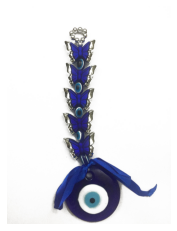

[Home Decor & Festive Needs] Product name : Treasure Showpiece  -  23 cm
[Home Decor & Festive Needs] Description  : Key Features of Treasure Showpiece  -  23 cm Polyresin Height - 23 cm Width - 1 cm,Specifications of Treasure Showpiece  -  23 cm (Polyresin, Blue) General Brand Treasure Model Number TE6 Type Fengshui Material Polyresin Color Blue Dimensions Height 23 cm Width 1 cm Depth 1 cm In the Box Sales Package 1 show piece


Home Furnishing :
---------------


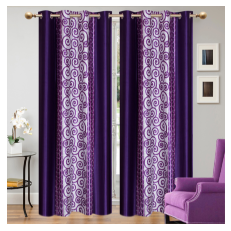

[Home Furnishing] Product name : Elegance Polyester Multicolor Abstract Eyelet Door Curtain
[Home Furnishing] Description  : Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of j

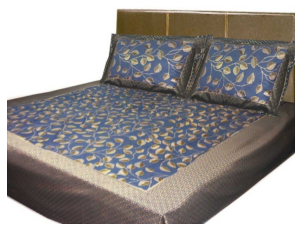

[Home Furnishing] Product name : SANTOSH ROYAL FASHION Cotton Printed King sized Double Bedsheet
[Home Furnishing] Description  : Key Features of SANTOSH ROYAL FASHION Cotton Printed King sized Double Bedsheet Royal Bedsheet Perfact for Wedding & Gifting,Specifications of SANTOSH ROYAL FASHION Cotton Printed King sized Double Bedsheet (1 Bedsheet,2 Pillow Cover, Multicolor) General Brand SANTOSH ROYAL FASHION Machine Washable Yes Type Flat Material Cotton Model Name Gold Design Royal Cotton Printed Wedding & Gifted Double Bedsheet With 2 Pillow cover Model ID goldbedi-38 Color Multicolor Size King Fabric Care Machine Wash, Do Not Bleach Dimensions Flat Sheet Width 90 inch / 230 cm Fitted Sheet Width 228 cm Pillow Cover Width 16 inch / 43 cm Pillow Cover Length 28 inch / 72 cm Fitted Sheet Depth 280 cm Fitted Sheet Length 278 cm Flat Sheet Depth 282 cm Flat Sheet Length 110 inch / 280 cm In the Box Number of Contents in Sales Package 1 Sales Package 1 Bedsheet,2 Pillow Cover


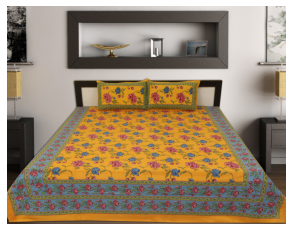

[Home Furnishing] Product name : Jaipur Print Cotton Floral King sized Double Bedsheet
[Home Furnishing] Description  : Key Features of Jaipur Print Cotton Floral King sized Double Bedsheet 100% cotton,Jaipur Print Cotton Floral King sized Double Bedsheet (1 bed sheet 2 pillow cover, White) Price: Rs. 998 This nice bed sheet made up of 100% cotton to give you comfort. This bed sheet is hand printed. This bedsheet gives nice look to your room And its fast colour and good quality gives this bedsheet long life.,Specifications of Jaipur Print Cotton Floral King sized Double Bedsheet (1 bed sheet 2 pillow cover, White) General Machine Washable Yes Brand Jaipur Print Type Flat Model Name jaipur117 Material Cotton Thread Count 140 Model ID jaipur117 Fabric Care machinewash, do not bleach Size King Color White Warranty waranty of the product only for manufacturing defect only and product will exchange onle when it is not used and returne its origional packing Dimensions Flat Sheet Width 86 inc

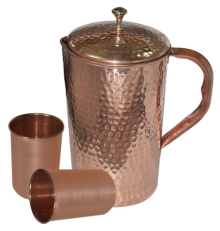

[Kitchen & Dining] Product name : Dungri India Craft Ducjug010-ducgl012-2 Jug Glass Set
[Kitchen & Dining] Description  : Key Features of Dungri India Craft Ducjug010-ducgl012-2 Jug Glass Set Jug: Height- 8 inches, Dia - 4.2 inches, Depth 7.5 inches, Width 7 inches,capacity 1744 ml, Weight - 430 Grams,Dungri India Craft Ducjug010-ducgl012-2 Jug Glass Set (Copper) Price: Rs. 1,399 Copper Utensils And Serving Copper Ware Helped To Prevent The Spread Of Diseases. In Many Tests It Showed That 99.9% Of The Bacteria On Copper Alloy Surfaces (With 65% Or Greater Copper Content) Were Eliminated Within 2 Hours Of Exposure. According To Research At Southampton University In The U.K., Mrsa Microbes Remain Alive On Stainless Steel Surfaces For Up To Three Days, Whereas The Same Microbes On A Copper Surface Are Eliminated Within 90 Minutes. These Copper Serving Ware Are Preferred Because It Is Durable And It Has Excellent Characteristics. The Ageless Use Of Copper Bears Testimony To Its Myriad Virt

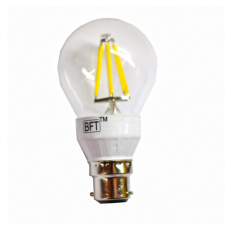

[Kitchen & Dining] Product name : BFT 6 W LED Bulb
[Kitchen & Dining] Description  : Key Features of BFT 6 W LED Bulb Pack of 1 Bulb,BFT 6 W LED Bulb (White) Price: Rs. 350 Introducing new technology in led lighting LED filament. Best suited for chandeliers table lamps and light fixtures in general as it spreads light 360-degrees,Specifications of BFT 6 W LED Bulb (White) General Brand BFT Model Number BFTCW6 Body and Design Features Material Glass Bulb Base B22 Lighting Features Light Color White Bulb Type LED Lumen 700 Power Features Power Consumption 6 W In the Box Sales Package 1 Bulb Pack of 1


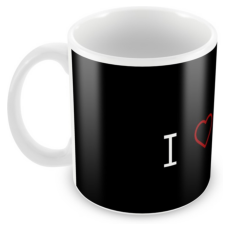

[Kitchen & Dining] Product name : AKUP i-loves-music Ceramic Mug
[Kitchen & Dining] Description  : Key Features of AKUP i-loves-music Ceramic Mug Pack of 1 Mug,AKUP i-loves-music Ceramic Mug (300 ml) Price: Rs. 259 AKUP Ceramic coffee mugs gives you the best quality printed mugs which you can gift to your loved ones. We provide good quality of products with packing. Coffee mugs made of ceramic clay with the volume capacity of 300ml each. You can buy it for yourself to make your moment unforgettable forever. Specifications Product Dimensions: Mugs - Height: 9.5 cms, Diameter: 8 cms. Item Type: Coffee Mug Color: Multi-Color Material: Clay Finish: Glossy Specialty: Lovely Style Wash care: Remove dirt by using a soft fabric to clean and then wipe with a moist cloth. Disclaimer: The fine design, pattern and color tone of the product may vary slightly from that shown in the image. However, there would not be any compromise in quality. Brand: AKUP designs & co,Specifications of AKUP i-loves-m

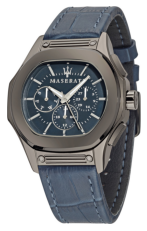

[Watches] Product name : Maserati Time R8851116001 Analog Watch  - For Boys
[Watches] Description  : Maserati Time R8851116001 Analog Watch  - For Boys - Buy Maserati Time R8851116001 Analog Watch  - For Boys  R8851116001 Online at Rs.24400 in India Only at Flipkart.com. - Great Discounts, Only Genuine Products, 30 Day Replacement Guarantee, Free Shipping. Cash On Delivery!


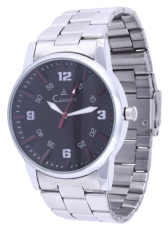

[Watches] Product name : Camerii WM64 Elegance Analog Watch  - For Men, Boys
[Watches] Description  : Camerii WM64 Elegance Analog Watch  - For Men, Boys - Buy Camerii WM64 Elegance Analog Watch  - For Men, Boys  WM64 Online at Rs.449 in India Only at Flipkart.com. - Great Discounts, Only Genuine Products, 30 Day Replacement Guarantee, Free Shipping. Cash On Delivery!


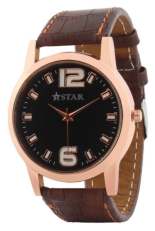

[Watches] Product name : T STAR UFT-TSW-005-BK-BR Analog Watch  - For Boys
[Watches] Description  : T STAR UFT-TSW-005-BK-BR Analog Watch  - For Boys
                         Price: Rs. 399
				
			Whether you are on your way to work or travelling abroad with family, lifestyle accessories like watches, wallets and belts help to add a touch of sophistication and class to your otherwise mundane and regular daily wear. When it all comes down to it, suave leather belts and intricately designed and finished timepieces are what separate you from the rest.
Whether you are on your way to work or travelling abroad with family, lifestyle accessories like watches, wallets and belts help to add a touch of sophistication and class to your otherwise mundane and regular daily wear. When it all comes down to it, suave leather belts and intricately designed and finished timepieces are what separate you from the rest.




In [44]:
N = 3
for categ in list(np.unique(categs_1st)):
    print(bcolors.BOLD+bcolors.HEADER+categ+' :'+'\n'+'-'*len(categ)+bcolors.ENDC)
    df_name = data_00.loc[data_00['categs_1st']==categ, 'product_name']
    df_desc = data_00.loc[data_00['categs_1st']==categ, 'description']
    df_imag = data_00.loc[data_00['categs_1st']==categ, 'image']
    for ind in range(N):
        id = df_imag.iloc[ind]
        DisplotData.display_external_images([path+f"Images/{id}"])
        print(bcolors.BOLD+f"[{categ}] Product name : "+bcolors.ENDC+f"{df_name.iloc[ind]}")
        print(bcolors.BOLD+f"[{categ}] Description  : "+bcolors.ENDC+f"{df_desc.iloc[ind]}")
    print('\n')

**Commentaires :**
 - Pas mal de descriptions sont **doublées**, mais avec des altérations, donc pas facilement détectable
 - Pas mal de descriptions sont avec des majuscules à chaque première lettre, mais pas toutes
 - Pas mal de descriptions reprennent le nom de produit, mais pas toutes (ex : `AKUP i-loves-music Ceramic Mug`)
 - Des caractères spéciaux (`±3%`)
 - Des stopwords (`Key Features`) inutiles
 - Il y a bien du "Bengaglish" dans les noms et descriptions : `"dohar"` (dessus de lit). Or l'embedding EN `word2vec` ne connaît probablement pas ce(s) mots. En dehors de l'ajout ad-hoc de ce type de vocabulaire dans le dictionnaire d'entraînement de `word2vec`, il n'y a qu'un apprentissage supervisé pour apprendre la catégorie.

In [45]:
nb_unrepeated_tokens = 0
nb_total_name_tokens = 0
nb_prods_w_unreap_tk = 0
names = data_00['product_name'].values
descs = data_00['description'].values
nm_old = None
for nm, ds in zip(names, descs):
    tokens = nm.split(' ')
    nb_total_name_tokens += len(tokens)
    for tk in tokens:
        if not tk in ds:
            nb_unrepeated_tokens += 1
            if not nm==nm_old:
                nb_prods_w_unreap_tk += 1
                nm_old = nm

print(f"Nombre total de tokens dans les noms de produits non repris dans la description : {nb_unrepeated_tokens}")
print(f"Nombre total de tokens dans les noms de produits : {nb_total_name_tokens}")
print(f"Nombre de produits avec des pertes de tokens {nb_prods_w_unreap_tk}")

Nombre total de tokens dans les noms de produits non repris dans la description : 1
Nombre total de tokens dans les noms de produits : 7998
Nombre de produits avec des pertes de tokens 1


Donc les descriptions reprennent quasiment 100% des termes présents dans les noms de produits.

### `product_rating`

### `overall_rating`

### `brand`

### `product_specifications`

La colonne `product_specifications` semble contenir des informations supplémentaires :

In [46]:
data_00.product_specifications.values

array(['{"product_specification"=>[{"key"=>"Brand", "value"=>"Elegance"}, {"key"=>"Designed For", "value"=>"Door"}, {"key"=>"Type", "value"=>"Eyelet"}, {"key"=>"Model Name", "value"=>"Abstract Polyester Door Curtain Set Of 2"}, {"key"=>"Model ID", "value"=>"Duster25"}, {"key"=>"Color", "value"=>"Multicolor"}, {"key"=>"Length", "value"=>"213 cm"}, {"key"=>"Number of Contents in Sales Package", "value"=>"Pack of 2"}, {"key"=>"Sales Package", "value"=>"2 Curtains"}, {"key"=>"Material", "value"=>"Polyester"}]}',
       '{"product_specification"=>[{"key"=>"Machine Washable", "value"=>"Yes"}, {"key"=>"Material", "value"=>"Cotton"}, {"key"=>"Design", "value"=>"Self Design"}, {"key"=>"Brand", "value"=>"Sathiyas"}, {"key"=>"Type", "value"=>"Bath Towel"}, {"key"=>"GSM", "value"=>"500"}, {"key"=>"Model Name", "value"=>"Sathiyas cotton bath towel"}, {"key"=>"Ideal For", "value"=>"Men, Women, Boys, Girls"}, {"key"=>"Model ID", "value"=>"asvtwl322"}, {"key"=>"Color", "value"=>"Red, Yellow, Blue"}, {

Ces informations peuvent aider à la catégorisation (ex : _"Leaves no sticky residue on walls. Can be applied on any smooth, clean and dry surface like wall, glass, mirror, tile, furniture, automotive surfaces etc"_, mais on ne sait pas si elles peuvent être exploitées dans le projet.

## Explorations

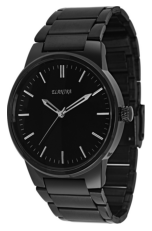

In [47]:
id = data_00.loc[29, 'image']
DisplotData.display_external_images([path+f"Images/{id}"])

In [48]:
data_00.loc[29, 'description']

'Elantra S 10 Analog Watch  - For Boys, Men - Buy Elantra S 10 Analog Watch  - For Boys, Men  S 10 Online at Rs.950 in India Only at Flipkart.com. - Great Discounts, Only Genuine Products, 30 Day Replacement Guarantee, Free Shipping. Cash On Delivery!'

Le texte est très peu informatif : seul le mot `watch` (et éventuellement `boys`, `men` si on catégorise sur le sexe) n'apporte de l'onfo sur la cétgorie du produit.

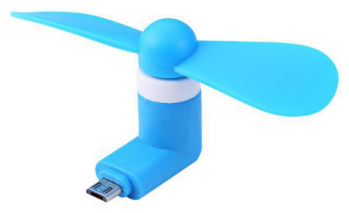

In [49]:
id = data_00.loc[53, 'image']
DisplotData.display_external_images([path+f"Images/{id}"])

In [50]:
data_00.loc[53, 'description']

'Key Features of JRB 1038 Smallest Mobile Powered By OTG Enabled Android Smart Phone Portable 1038 USB Fan System Requirements: OTG Enabled Android Smart Phone Material: Plastic,Specifications of JRB 1038 Smallest Mobile Powered By OTG Enabled Android Smart Phone Portable 1038 USB Fan (Multicolor) General Brand JRB Type USB Fan Model Name 1038 Smallest Mobile Powered By OTG Enabled Android Smart Phone Material Plastic System Requirements OTG Enabled Android Smart Phone Model ID Portable 1038 Color Multicolor In the Box Sales Package 1 MICRO USB FAN'

In [51]:
data_00.loc[53, 'product_name']

'JRB 1038 Smallest Mobile Powered By OTG Enabled Android Smart Phone Portable 1038 USB Fan'

Là ce sont les mots `fan` et `USB` pour l'objet, et `Mobile`ainsi que le bigramme `Smart Phone` pour la catégorie.

## Colonnes retenues 

In [52]:
data_00.columns

Index(['uniq_id', 'crawl_timestamp', 'product_url', 'product_name',
       'product_category_tree', 'pid', 'retail_price', 'discounted_price',
       'image', 'is_FK_Advantage_product', 'description', 'product_rating',
       'overall_rating', 'brand', 'product_specifications', 'categs_1st',
       'categs_2nd'],
      dtype='object')

In [53]:
# data_01 = data_00[['product_name', 'description', 'image']]

In [54]:
data_01 = data_00.copy()

In [55]:
data_01['name_AND_description'] = data_00['product_name'] + ' ' + data_00['description']

In [56]:
data_01 = data_01[['categs_1st', 'categs_2nd', 'product_name', 'name_AND_description', 'image']]

In [57]:
data_01

,categs_1st,categs_2nd,product_name,name_AND_description,image
0,Home Furnishing,Home Furnishing >> Curtains & Accessories,Elegance Polyester Multicolor Abstract Eyelet ...,Elegance Polyester Multicolor Abstract Eyelet ...,55b85ea15a1536d46b7190ad6fff8ce7.jpg
1,Baby Care,Baby Care >> Baby Bath & Skin,Sathiyas Cotton Bath Towel,Sathiyas Cotton Bath Towel Specifications of S...,7b72c92c2f6c40268628ec5f14c6d590.jpg
2,Baby Care,Baby Care >> Baby Bath & Skin,Eurospa Cotton Terry Face Towel Set,Eurospa Cotton Terry Face Towel Set Key Featur...,64d5d4a258243731dc7bbb1eef49ad74.jpg
3,Home Furnishing,Home Furnishing >> Bed Linen,SANTOSH ROYAL FASHION Cotton Printed King size...,SANTOSH ROYAL FASHION Cotton Printed King size...,d4684dcdc759dd9cdf41504698d737d8.jpg
4,Home Furnishing,Home Furnishing >> Bed Linen,Jaipur Print Cotton Floral King sized Double B...,Jaipur Print Cotton Floral King sized Double B...,6325b6870c54cd47be6ebfbffa620ec7.jpg
...,...,...,...,...,...
1045,Baby Care,Baby Care >> Baby & Kids Gifts,Oren Empower Extra Large Self Adhesive Sticker,Oren Empower Extra Large Self Adhesive Sticker...,958f54f4c46b53c8a0a9b8167d9140bc.jpg
1046,Baby Care,Baby Care >> Baby & Kids Gifts,Wallmantra Large Vinyl Sticker Sticker,Wallmantra Large Vinyl Sticker Sticker Wallman...,fd6cbcc22efb6b761bd564c28928483c.jpg
1047,Baby Care,Baby Care >> Baby & Kids Gifts,Uberlyfe Extra Large Pigmented Polyvinyl Films...,Uberlyfe Extra Large Pigmented Polyvinyl Films...,5912e037d12774bb73a2048f35a00009.jpg
1048,Baby Care,Baby Care >> Baby & Kids Gifts,Wallmantra Medium Vinyl Sticker Sticker,Wallmantra Medium Vinyl Sticker Sticker Buy Wa...,c3edc504d1b4f0ba6224fa53a43a7ad6.jpg


## Doublons

In [58]:
data_00.loc[data_00['description'].duplicated(keep='last'),:]

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,categs_1st,categs_2nd


In [59]:
data_00.loc[data_00['product_name'].duplicated(keep='last'),:]

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,categs_1st,categs_2nd


Pas de doublon sur le texte de description.

In [60]:
data_00.loc[data_00['image'].duplicated(keep='last'),:]

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,categs_1st,categs_2nd


Ni sur l'image (ça aurait pu).

## Valeurs manquantes

In [61]:
nan_rate = data_01.isna().sum(axis=0).sort_values()/data_00.shape[0]*100.

In [62]:
nan_rate

categs_1st              0.0
categs_2nd              0.0
product_name            0.0
name_AND_description    0.0
image                   0.0
dtype: float64

In [63]:
nan_rate_00 = data_00.isna().mean()*100.
nan_rate_01 = data_01.isna().mean()*100.

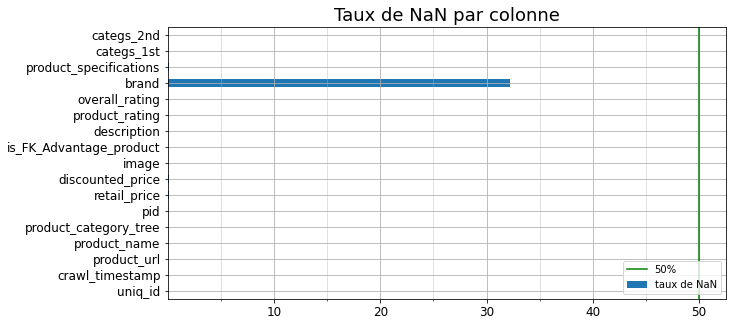

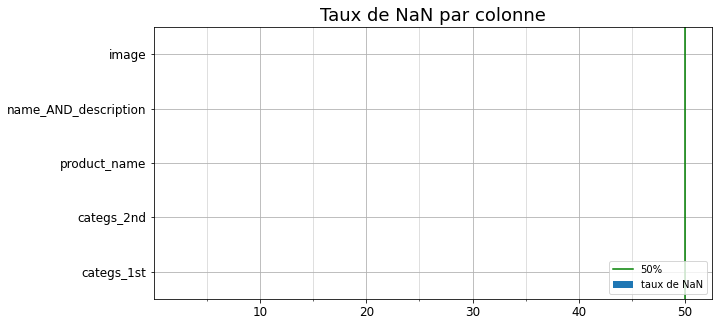

In [64]:
plt.rcParams['figure.figsize'] = [10, 5]
plt.rcParams['axes.titlesize'] = 18
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
DisplotData.print_nan_rates(nan_rate_00,50.,seuil=None)
DisplotData.print_nan_rates(nan_rate_01,50.,seuil=None)

Très peu de valeurs manquantes, et pour des colonnes qui ne joueront pas de rôle (`brand`, `retail_price`,  `discounted_price`, et `product_specifications` si on l'écarte.

<img src="BandeauDonneesTextuelles.png" />

# Textes - Pré-traitements

## Fonctions communes

In [65]:
# Stop words
STOP_WORDS = list(set(stopwords.words('english'))) + ['[', ']', ',', '.', ':', ';', '?', '!', '(', ')']
EXCLUDED_WORDS = [
    'products',
    'product',
    'free',
    'rs',
    'r',
    'buy',
    'delivery',
    'deliveri',
    'deliver',
    'cash',
    'shipping',
    'shipment',
    'ship',
    'prices',
    'price',
    'gifts',
    'gift',
    'giftings',
    'gifting',
    'gifted',
    'giving',
    'gived',
    'give',
    'gave',
    'best',
    'genuine',
    'day',
    'online',
    'india',
    'number',
    'key',
    'feature',
    'replacement',
    'guarantee',
    'discount',
    'sale',
    'specification',    
    ]

In [66]:
MIN_WORD_LEN = 1 # "HD" est informatif

In [67]:
def tokenizer_fct(sentence):
    # print(sentence)
    sentence_clean = sentence.replace('-', ' ').replace('+', ' ').replace('/', ' ').replace('#', ' ')
    word_tokens = word_tokenize(sentence_clean)
    return word_tokens

def lower_fct(list_words):
    lower_words = [w.lower() for w in list_words]
    return lower_words

def stop_word_filter_fct(list_words):
    filtered_w1 = excluded_words_filter(list_words)
    filtered_w2 = [w for w in filtered_w1 if not w in STOP_WORDS]
    filtered_w3 = [w for w in filtered_w2 if len(w) > MIN_WORD_LEN]
    return filtered_w3

def excluded_words_filter(list_words):
    filtered_w = [w for w in list_words if not w in EXCLUDED_WORDS]
    return filtered_w

# Bon début
def start_fct(list_words):
    lw = [w for w in list_words if (not w.startswith("@")) 
    #                                   and (not w.startswith("#"))
                                       and (not w.startswith("http"))]
    return lw

# Alphanumérique
def alpha_fct(list_words):
    alpha_tokens = [w for w in list_words if w.isalpha()]
    return alpha_tokens

# Lemmatizer (base d'un mot)
def lemma_fct(list_words):
    lemmatizer = WordNetLemmatizer()
    lem_w = [lemmatizer.lemmatize(w) for w in list_words]
    return lem_w

# Stemmatizer (autre base d'un mot)
def stem_fct(list_words):
    stemmatizer = PorterStemmer()
    stem_w = [stemmatizer.stem(w) for w in list_words]
    return stem_w

# Fonction de préparation du texte pour le bag of words (Countvectorizer et Tf_idf, Word2Vec)
def transform_bow_fct(desc_text):
    word_tokens = tokenizer_fct(desc_text)
    word_tokens = alpha_fct(word_tokens)
    lw = lower_fct(word_tokens)
#     sw = stop_word_filter_fct(lw)
    st = start_fct(lw)
    transf_desc_text = ' '.join(st)
    return transf_desc_text

# Fonction de préparation du texte pour le bag of words avec lemmatisation
def transform_bow_lem_fct(desc_text):
    word_tokens = tokenizer_fct(desc_text)
    word_tokens = alpha_fct(word_tokens)
    lw = lower_fct(word_tokens)
    sw = stop_word_filter_fct(lw)
    st = start_fct(sw)
#     if 'gift' in st:
#         print('PUTAIN DE SA MERE !!!')
#         print([w for w in st if 'gift' in w])
    lem_w = lemma_fct(st)
    lem_w = excluded_words_filter(lem_w)
    if 'gift' in lem_w:
        print('PUTAIN DE SA RACE !!!')
        print(desc_text)
    transf_desc_text = ' '.join(lem_w)
    return transf_desc_text

# Fonction de préparation du texte pour le bag of words avec stemmatisation
def transform_bow_stem_fct(desc_text):
    word_tokens = tokenizer_fct(desc_text)
    word_tokens = alpha_fct(word_tokens)
    lw = lower_fct(word_tokens)
    sw = stop_word_filter_fct(lw)
    st = start_fct(sw)
#     if 'gift' in st:
#         print('PUTAIN DE SA RACE !!!')
#         print([w for w in st if 'gift' in w])
    stem_w = stem_fct(st)
    stem_w = excluded_words_filter(stem_w)
    if 'gift' in stem_w:
        print('PUTAIN DE SA RACE !!!')
        print(desc_text)
    transf_desc_text = ' '.join(stem_w)
    return transf_desc_text

# Fonction de préparation du texte pour le Deep learning (USE et BERT)
def transform_dl_fct(desc_text) :
    word_tokens = tokenizer_fct(desc_text)
    word_tokens = alpha_fct(word_tokens)
#    sw = stop_word_filter_fct(word_tokens)
    lw = lower_fct(word_tokens)
    st = start_fct(lw)
    # lem_w = lemma_fct(st)    
    transf_desc_text = ' '.join(st)
    return transf_desc_text

'gift' est bien filtré, mais pas 'gifts', dont le lemme ou stem **redonne** 'gift'

In [68]:
def token_is_in_cluster_number(df, token, n_clust, text_col='name_AND_description', clust_col='label'):
    nb_sample_yes = df.loc[ (df[clust_col]==n_clust) &  (df[text_col].str.contains(token))].shape[0]
    nb_sample_clust = df.loc[ (df[clust_col]==n_clust) ].shape[0]
    nb_sample_tot = df.shape[0]
    
    print(f"Le token "+bcolors.BOLD+f"{token}"+bcolors.ENDC+f" est présent dans {nb_sample_yes} samples sur {nb_sample_clust} dans le cluster {n_clust} et sur {nb_sample_tot} samples au total")
    

## Nettoyage et préparation du texte

In [69]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\a072108\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [70]:
transf_cols = {'sentence_bow': transform_bow_fct,
               'sentence_bow_lem': transform_bow_lem_fct,
               'sentence_bow_stem': transform_bow_stem_fct,
               'sentence_dl': transform_dl_fct}

In [71]:
def create_transformed_columns(df0, transf_cols, text_col):
    df = df0.copy()
    for col in transf_cols:
        fct = transf_cols[col]
        df[col] = df[text_col].apply(fct)
    return df

In [72]:
data_02 = create_transformed_columns(data_01, transf_cols, 'name_AND_description')
data_02

,categs_1st,categs_2nd,product_name,name_AND_description,image,sentence_bow,sentence_bow_lem,sentence_bow_stem,sentence_dl
0,Home Furnishing,Home Furnishing >> Curtains & Accessories,Elegance Polyester Multicolor Abstract Eyelet ...,Elegance Polyester Multicolor Abstract Eyelet ...,55b85ea15a1536d46b7190ad6fff8ce7.jpg,elegance polyester multicolor abstract eyelet ...,elegance polyester multicolor abstract eyelet ...,eleg polyest multicolor abstract eyelet door c...,elegance polyester multicolor abstract eyelet ...
1,Baby Care,Baby Care >> Baby Bath & Skin,Sathiyas Cotton Bath Towel,Sathiyas Cotton Bath Towel Specifications of S...,7b72c92c2f6c40268628ec5f14c6d590.jpg,sathiyas cotton bath towel specifications of s...,sathiyas cotton bath towel sathiyas cotton bat...,sathiya cotton bath towel specif sathiya cotto...,sathiyas cotton bath towel specifications of s...
2,Baby Care,Baby Care >> Baby Bath & Skin,Eurospa Cotton Terry Face Towel Set,Eurospa Cotton Terry Face Towel Set Key Featur...,64d5d4a258243731dc7bbb1eef49ad74.jpg,eurospa cotton terry face towel set key featur...,eurospa cotton terry face towel set eurospa co...,eurospa cotton terri face towel set featur eur...,eurospa cotton terry face towel set key featur...
3,Home Furnishing,Home Furnishing >> Bed Linen,SANTOSH ROYAL FASHION Cotton Printed King size...,SANTOSH ROYAL FASHION Cotton Printed King size...,d4684dcdc759dd9cdf41504698d737d8.jpg,santosh royal fashion cotton printed king size...,santosh royal fashion cotton printed king size...,santosh royal fashion cotton print king size d...,santosh royal fashion cotton printed king size...
4,Home Furnishing,Home Furnishing >> Bed Linen,Jaipur Print Cotton Floral King sized Double B...,Jaipur Print Cotton Floral King sized Double B...,6325b6870c54cd47be6ebfbffa620ec7.jpg,jaipur print cotton floral king sized double b...,jaipur print cotton floral king sized double b...,jaipur print cotton floral king size doubl bed...,jaipur print cotton floral king sized double b...
...,...,...,...,...,...,...,...,...,...
1045,Baby Care,Baby Care >> Baby & Kids Gifts,Oren Empower Extra Large Self Adhesive Sticker,Oren Empower Extra Large Self Adhesive Sticker...,958f54f4c46b53c8a0a9b8167d9140bc.jpg,oren empower extra large self adhesive sticker...,oren empower extra large self adhesive sticker...,oren empow extra larg self adhes sticker oren ...,oren empower extra large self adhesive sticker...
1046,Baby Care,Baby Care >> Baby & Kids Gifts,Wallmantra Large Vinyl Sticker Sticker,Wallmantra Large Vinyl Sticker Sticker Wallman...,fd6cbcc22efb6b761bd564c28928483c.jpg,wallmantra large vinyl sticker sticker wallman...,wallmantra large vinyl sticker sticker wallman...,wallmantra larg vinyl sticker sticker wallmant...,wallmantra large vinyl sticker sticker wallman...
1047,Baby Care,Baby Care >> Baby & Kids Gifts,Uberlyfe Extra Large Pigmented Polyvinyl Films...,Uberlyfe Extra Large Pigmented Polyvinyl Films...,5912e037d12774bb73a2048f35a00009.jpg,uberlyfe extra large pigmented polyvinyl films...,uberlyfe extra large pigmented polyvinyl film ...,uberlyf extra larg pigment polyvinyl film impo...,uberlyfe extra large pigmented polyvinyl films...
1048,Baby Care,Baby Care >> Baby & Kids Gifts,Wallmantra Medium Vinyl Sticker Sticker,Wallmantra Medium Vinyl Sticker Sticker Buy Wa...,c3edc504d1b4f0ba6224fa53a43a7ad6.jpg,wallmantra medium vinyl sticker sticker buy wa...,wallmantra medium vinyl sticker sticker wallma...,wallmantra medium vinyl sticker sticker wallma...,wallmantra medium vinyl sticker sticker buy wa...


`'os'` se fait lemmatiser en `'o'` !

### Tokens rares

Les tokens rares sont fonction de la colonne transformée.

In [73]:
def list_lt_or_gt_n_words(df, n, col, op='lt'):
    corpus = ' '.join(list(df[col].values))
    all_words = corpus.split(' ')
    if 'for' in all_words:
        print('PUREE DE MERDE')
    tmp = pd.Series(all_words).value_counts()
    if op == 'lt':
        list_m = tmp[tmp<=n]
    else:
        list_m = tmp[tmp>=n]
        
    print(list_m)
    return list_m

In [74]:
n = 5
lt_n_words = {}
all_lt_n_words = pd.DataFrame()
print(f"Taille de la liste des mots rares (<={n}): ")
for col in transf_cols:
    lt_n_words[col] = list_lt_or_gt_n_words(data_02, n, col, op='lt')
    lt_n_words[col].to_csv(f"tokens_lt_{n}_{col}.csv", sep=';')
    print(f"{col}: {lt_n_words[col].shape[0]}")
    df = pd.DataFrame(lt_n_words[col])
    df['col'] = col
    all_lt_n_words = pd.concat([all_lt_n_words, df])
    print(all_lt_n_words)
all_lt_n_words.to_csv(f"tokens_lt_{n}_ALL.csv", sep=';')


Taille de la liste des mots rares (<=5): 
PUREE DE MERDE
ordinary    5
straps      5
wealth      5
plates      5
kadai       5
           ..
nvidia      1
geforce     1
machines    1
several     1
zoom        1
Length: 3360, dtype: int64
sentence_bow: 3360
          0           col
ordinary  5  sentence_bow
straps    5  sentence_bow
wealth    5  sentence_bow
plates    5  sentence_bow
kadai     5  sentence_bow
...      ..           ...
nvidia    1  sentence_bow
geforce   1  sentence_bow
machines  1  sentence_bow
several   1  sentence_bow
zoom      1  sentence_bow

[3360 rows x 2 columns]
watche       5
envy         5
drawing      5
movie        5
cast         5
            ..
navy         1
held         1
looper       1
alcohol      1
macintosh    1
Length: 2997, dtype: int64
sentence_bow_lem: 2997
           0               col
ordinary   5      sentence_bow
straps     5      sentence_bow
wealth     5      sentence_bow
plates     5      sentence_bow
kadai      5      sentence_bow
...  

In [75]:
'o' in STOP_WORDS

True

In [76]:
'for' in STOP_WORDS

True

### Tokens les plus fréquents

Ils peuvent être également source de bruit alors qu'ils ne portent pas d'information. Voyons si les stop words les ont captés.

In [77]:
n = 500
gt_n_words = {}
all_gt_n_words = pd.DataFrame()
print(f"Taille de la liste des mots fréquents (>={n}): ")
for col in transf_cols:
    gt_n_words[col] = list_lt_or_gt_n_words(data_02, n, col, op='gt')
    gt_n_words[col].to_csv(f"tokens_gt_{n}_{col}.csv", sep=';')
    print(f"{col}: {gt_n_words[col].shape[0]}")
    df = pd.DataFrame(gt_n_words[col])
    df['col'] = col
    all_gt_n_words = pd.concat([all_gt_n_words, df])
    print(all_gt_n_words)
all_gt_n_words.to_csv(f"tokens_gt_{n}_ALL.csv", sep=';')
    

Taille de la liste des mots fréquents (>=500): 
PUREE DE MERDE
of             1788
for            1605
and            1374
the            1371
to             1058
in             1049
with            889
only            889
on              840
at              714
a               689
your            658
cm              643
is              640
products        633
free            621
rs              592
buy             582
replacement     568
delivery        567
genuine         564
shipping        564
cash            564
day             543
dtype: int64
sentence_bow: 24
                0           col
of           1788  sentence_bow
for          1605  sentence_bow
and          1374  sentence_bow
the          1371  sentence_bow
to           1058  sentence_bow
in           1049  sentence_bow
with          889  sentence_bow
only          889  sentence_bow
on            840  sentence_bow
at            714  sentence_bow
a             689  sentence_bow
your          658  sentence_bow
cm         

Ces tokens fréquents permettent d'éliminer les suivants : 

In [78]:
NEW_EXCLUDED_WORDS = [
    'products',
    'product',
    'free',
    'rs',
    'r',
    'buy',
    'delivery',
    'deliveri',
    'deliver',
    'cash',
    'shipping',
    'shipment',
    'ship',
    'prices',
    'price',
    'gifts',
    'gift',
    'giftings',
    'gifting',
    'gifted',
    'giving',
    'gived',
    'give',
    'gave',
    ]

In [79]:
stem_fct(['gifting'])

['gift']

In [80]:
lemma_fct(['gifting'])

['gifting']

On repasse les fonctions, maintenant que la liste des mots à exclure est plus riche :

In [81]:
data_03 = create_transformed_columns(data_01, transf_cols, 'name_AND_description')

In [82]:
data_03.to_csv("data_03.csv", sep=';')

In [83]:
df_tk = data_03.copy()

## Catégories de produits

On va fixer les labels selon les premiers résultats de word2vec, pour faciliter les visualisations par couleur :

In [84]:
print(df_tk['categs_1st'].unique())

['Home Furnishing' 'Baby Care' 'Watches' 'Home Decor & Festive Needs'
 'Kitchen & Dining' 'Beauty and Personal Care' 'Computers']


In [85]:
categ_map = {
    'Watches': 0,
    'Computers': 1,
    'Baby Care': 2,
    'Home Furnishing': 3,
    'Home Decor & Festive Needs': 4,
    'Kitchen & Dining': 5,
    'Beauty and Personal Care': 6
}

In [86]:
def renum_label(row):
    return categ_map[row]

def relabel_categs(df0):
    df = df0.copy()
    df['categs_1st_num'] = df['categs_1st'].apply(renum_label)
    return df

In [87]:
df_tk = relabel_categs(df_tk)

In [88]:
df_tk['categs_1st_num']

0       3
1       2
2       2
3       3
4       3
       ..
1045    2
1046    2
1047    2
1048    2
1049    2
Name: categs_1st_num, Length: 1050, dtype: int64

In [89]:
%store df_tk

Stored 'df_tk' (DataFrame)


## Wordcloud

In [90]:
all_sentences = ' '.join(df_tk['sentence_bow'].values)

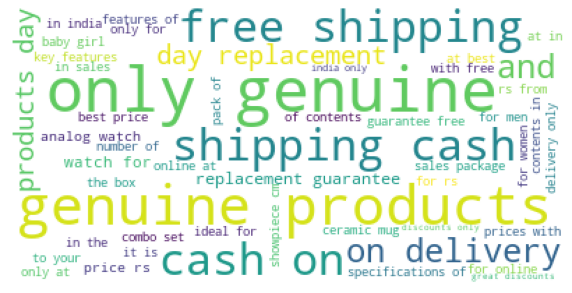

In [91]:
plt.rcParams['figure.figsize'] = [10, 8]
plt.rcParams['axes.titlesize'] = 15
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
wordcloud = WordCloud(
    background_color='white',
    stopwords=[], # inutile après notre travail
    max_words=50,
#     collocation_threshold=1,
# ).generate(all_sentences)
).generate_from_text(all_sentences)

plt.imshow(wordcloud)
plt.axis('off')
plt.xlabel('Avant ajout de stopwords')
plt.show();

A de rares exceptions près, `key` vient avec `feature`, et vice versa. Détecter les bigrammes et éliminer ceux qui n'apportent rien est donc une bonne idée.

In [92]:
all_sentences = ' '.join(df_tk['sentence_bow_lem'].values)

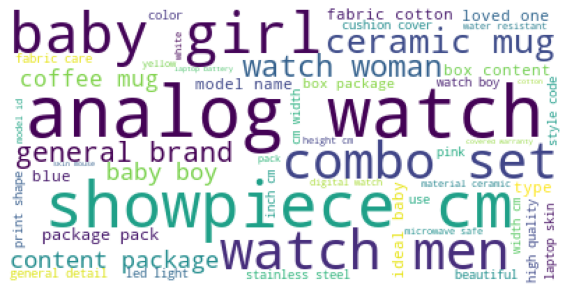

In [93]:
wordcloud = WordCloud(
    background_color='white',
    stopwords=EXCLUDED_WORDS,
    max_words=50,
#     collocation_threshold=1,
# ).generate(all_sentences)
).generate_from_text(all_sentences)

plt.imshow(wordcloud)
plt.axis('off')
plt.show();

# Textes - Clustering

On suppose ne pas connaître les catégories à séparer. On va vérifier la pertinence de l'extraction des features en **segmentant** les descriptions.

## Fonctions communes

In [94]:
# Calcul Tsne, détermination des clusters et calcul ARI entre vrais catégorie et n° de clusters
def ARI_fct(features, y_cat_num, n_cat, perplexity=30, n_iter=3000):
    time1 = time.time()
    tsne = manifold.TSNE(n_components=2, perplexity=perplexity, n_iter=n_iter, 
                                 init='random', learning_rate=100, random_state=18011975)
    X_tsne = tsne.fit_transform(features)
    
    # Détermination des clusters à partir des données après Tsne 
    cls = cluster.KMeans(n_clusters=n_cat, n_init=100, random_state=18011975)
    cls.fit(X_tsne)
    ARI = np.round(metrics.adjusted_rand_score(y_cat_num, cls.labels_),4)
    time2 = np.round(time.time() - time1,0)
    print("ARI : ", ARI, "time : ", time2)
    return ARI, X_tsne, cls.labels_


def ARI_fct2(features, true_labels=None, num_labels=20) :
    time1 = time.time()
    if true_labels:
        num_labels = len(true_labels)
    tsne = manifold.TSNE(n_components=2, perplexity=30, n_iter=3000, 
                                 init='random', learning_rate=100, random_state=18011975)
    X_tsne = tsne.fit_transform(features)
    
    # Détermination des clusters à partir des données après Tsne 
    cls = cluster.KMeans(n_clusters=num_labels, n_init=100, random_state=42)
    cls.fit(X_tsne)
#     ARI = np.round(metrics.adjusted_rand_score(y_cat_num, cls.labels_),4)
    ARI = 0.
    
    time2 = np.round(time.time() - time1,0)
    print("ARI : ", ARI, "time : ", time2)
    
    return ARI, X_tsne, cls.labels_

# Calcul Tsne
def TSNE_calc_unsupervised(features, perplexity=30, n_iter=3000):
    time1 = time.time()
    tsne = manifold.TSNE(n_components=2, perplexity=perplexity, n_iter=n_iter, 
                         init='random', learning_rate=100, random_state=18011975)
    X_tsne = tsne.fit_transform(features)
    time2 = np.round(time.time() - time1,0)
    print(f"Time : {time2}")
    return X_tsne

def compute_clusters(X, n_clusters):
    # Détermination des clusters à partir des données après Tsne
    cls = cluster.KMeans(n_clusters=n_clusters, n_init=100, random_state=18011975)
    cls.fit(X)
    labels = cls.labels_
    inertia = cls.inertia_
    return labels, inertia


# visualisation du Tsne selon les vraies catégories et selon les clusters
def TSNE_visu_fct(X_tsne, l_cat, y_cat_num, labels, ARI, marker_size=8, title_prefix=''):
    if title_prefix: title_prefix += ' - '
    fig = plt.figure()
    
    ax = fig.add_subplot(121)
    scatter = ax.scatter(X_tsne[:,0], X_tsne[:,1], s=marker_size, c=y_cat_num, cmap='Set1')
    ax.legend(handles=scatter.legend_elements()[0], labels=l_cat, loc="best", title="Catégorie")
    plt.title(title_prefix+'Catég. réelles')
    plt.xlabel('T1')
    plt.ylabel('T2')
    
    ax = fig.add_subplot(122)
    scatter = ax.scatter(X_tsne[:,0],X_tsne[:,1], s=marker_size, c=labels, cmap='Set1')
    ax.legend(handles=scatter.legend_elements()[0], labels=set(labels), loc="best", title="Cluster")
    plt.title(title_prefix+'Catég. identifées'+f' - ARI: {ARI:.3f}')
    plt.xlabel('T1')
    plt.ylabel('T2')
    plt.show()
    print(f"ARI : {ARI:.4f}")

    
def TSNE_visu_unsupervised(X_tsne, labels, title, cmaps=None, marker_size=8):
    label_list = np.unique(labels)
    N = len(label_list)
    if not cmaps:
        cmaps = [plt.cm.tab20c, plt.cm.jet]
        
    # Pour chaque corlormap
    for cm in cmaps:
        fig = plt.figure()
        plt.rcParams['axes.prop_cycle'] = cycler(color=cm(np.linspace(0, 1, N)))
        for label in np.unique(labels):
            selected = np.where(labels == label)
            plt.scatter(X_tsne[selected, 0], X_tsne[selected, 1], s=marker_size, label=f"Cluster {label}")
        # plt.legend(markerscale=8,prop={'size': 15})
        if len(cmaps)>1: 
            title2 = title+' ('+str(cm.name)+')'
        else:
            title2 = title
        plt.title(title2)
        plt.legend()
        plt.show(block=False)
        
        
def visu_elbow(X_tsne, n_min, n_max):
    inertia = []
    n_range = range(n_min, n_max+1, 1)
    for n_clusters in n_range:
        print(f"n_clusters = {n_clusters}... ", end='')
        lbls, inrt = compute_clusters(X_tsne, n_clusters)
        # Inertie
        inertia.append(inrt)
        print(f"inertia = {inrt:.2f}")
    
    # Plot
    fig = plt.figure()
    plt.plot(n_range, inertia)
    plt.xlabel('Nombre de clusters')
    plt.xticks(n_range)
    plt.ylabel('Inertia');
    plt.title('Coût du modèle (Inertia)')
    plt.grid('on')
    plt.show()

In [95]:
def make_image_board(files, s=3000, filename='image_board.png'):
    n_images = len(files)
    
    # On commence avec une planche carrée
    new_im = Image.new('RGB', (s, s))
    w = s
    h = s
    dw = int(w/(int(math.sqrt(n_images))+1))+1
    dh = int(h/(int(math.sqrt(n_images))+1))+1

    index = 0
    for i in range(0, w, dw):
        for j in range(0, h, dh):
            im = Image.open(files[index])
            im.thumbnail((dw, dh))
            new_im.paste(im, (j, i))
            index += 1
            if index == n_images:
                break
        if index == n_images:
            break
    # Sauvegarde
    new_im.save(filename)

In [96]:
def launch_text_clustering(feat_extractor, x_sentences, n_clusters, 
                           df_tk, X, label_col, image_col='image', verbose=0, create_images=False):
    """ """
    
    if verbose>0:
        print('Détermination des clusters...')
    labels, inertia = compute_clusters(X, n_clusters)
    lc = label_col+'_'+feat_extractor
    df_tk[lc] = labels

    if verbose>0:
        print('Visalisation des clusters...')
    title = feat_extractor+' - Catégories identifées'
    TSNE_visu_unsupervised(X, labels, title)
    if create_images:
        create_output_images(df_tk, lc, image_col, feat_extractor, verbose=1)
        
    return labels

In [97]:
def create_output_images(df_tk, label_col, image_col, feat_extractor, verbose=0):
    if verbose>0:
        print('Création des images correspondant aux clusters...')
#     images_merdouilles = {}
    labels = df_tk[label_col].values
    for n in np.unique(labels):
        images_merdouilles = df_tk.loc[df_tk[label_col]==n, image_col].values
        print(f"Cluster {n} : {len(images_merdouilles)} produits")
        im_merdouilles = [path+f"Images/{im}" for im in images_merdouilles]
        directory = os.path.join("output", feat_extractor)
        if not os.path.exists(directory): os.makedirs(directory)
        filename = os.path.join(directory,f"merdouilles_{n}.png")
        make_image_board(im_merdouilles, filename=filename)
        
        
def create_output_dir_images(df_tk, label_col, image_col, feat_extractor, verbose=0):
    if verbose>0:
        print("Création des répertoires d'images correspondant aux clusters...")
    labels = df_tk[label_col].values
    for n in np.unique(labels):
        images_merdouilles = df_tk.loc[df_tk[label_col]==n, image_col].values
        print(f"Cluster {n} : {len(images_merdouilles)} produits")
        im_merdouilles = [path+f"Images/{im}" for im in images_merdouilles]
        # Création du répertoire s'il n'existe pas déjà
        dir_n = f"output/{feat_extractor}/{n}"
        if not os.path.exists(dir_n): os.makedirs(dir_n)
        # Copie du fichier dans le répertoire
        for im in im_merdouilles:
            shutil.copy2(im, dir_n)
    

## Baseline

On émule un classifieur naïf, comme base de comparaison pour les scores de similitude à venir (ARI). 

In [98]:
import random

In [99]:
y_cat_num = df_tk['categs_1st_num'].values
l_cat = list(set(df_tk['categs_1st']))
n_cat = len(np.unique(y_cat_num))
n_samples = df_tk.shape[0]

On génère 10 tirages aléatoires pour avoir une moyenne plus stable du score de baseline :

In [101]:
ARIs = []
for ind in range(10):
    naive_labels = [ random.randint(0, n_cat-1) for _ in range(n_samples) ]
    ARI = metrics.adjusted_rand_score(y_cat_num, naive_labels)
    ARIs.append(ARI)
ARI_naive = np.array(ARIs).mean()

In [102]:
ARI_naive

-0.00034700416230079275

On a vérifié que le score ARI d'un classifieur naïf aléatoire par rapport à une répartition données est 0.

## CountVectorizer

https://www.kaggle.com/code/longtng/nlp-preprocessing-feature-extraction-methods-a-z/notebook#Text-Features-Extraction:

In [103]:
def main_count_vect(data, ngram = 1, MAX_NB_WORDS = 75000, verbose=0):
    count_vectorizer = CountVectorizer(ngram_range = (ngram, ngram), max_features = MAX_NB_WORDS)
    emb = count_vectorizer.fit_transform(data).toarray()
    if verbose>0: print("count vectorize with", str(np.array(emb).shape[1]), "features")
    return emb, count_vectorizer

In [104]:
def print_out(emb, feat, ngram, compared_sentence=0):
    print(ngram,"bag-of-words: ")
    print(feat.get_feature_names_out(), "\n")
    print(ngram,"bag-of-feature: ")
    print(test_cv_1gram.vocabulary_, "\n")
    print("BoW matrix:")
    print(pd.DataFrame(emb.transpose(), index = feat.get_feature_names_out()).head(), "\n")
    print(ngram,"vector example:")
    print(df_tk[corpus_col][compared_sentence])
    print(emb[compared_sentence], "\n")

In [105]:
corpus_col = 'sentence_bow_stem' # 'sentence_bow_lem'

In [106]:
test_corpus = df_tk[corpus_col][:5].tolist()
print("The test corpus: ", test_corpus, "\n")

test_cv_em_1gram, test_cv_1gram = main_count_vect(test_corpus, ngram=1)
print_out(test_cv_em_1gram, test_cv_1gram, ngram="Uni-gram")

The test corpus:  ['eleg polyest multicolor abstract eyelet door curtain featur eleg polyest multicolor abstract eyelet door curtain floral curtain eleg polyest multicolor abstract eyelet door curtain cm height pack curtain enhanc look curtain made high qualiti polyest featur eyelet style stitch metal make room environ romant curtain ant wrinkl anti shrinkag eleg home bright modernist appeal design surreal attent sure steal heart contemporari eyelet valanc curtain slide smoothli draw apart first thing morn welcom bright sun ray want wish good morn whole world draw close even creat special moment joyou beauti given sooth print bring home eleg curtain softli filter light room get right amount specif eleg polyest multicolor abstract eyelet door curtain cm height pack gener brand eleg design door type eyelet model name abstract polyest door curtain set model id color multicolor dimens length cm box content packag pack packag curtain bodi design materi polyest', 'sathiya cotton bath towel s

In [107]:
test_cv_em_2gram, test_cv_2gram = main_count_vect(test_corpus, ngram=2)
print_out(test_cv_em_2gram, test_cv_2gram, ngram="Bi-gram")

Bi-gram bag-of-words: 
['absorb soft' 'abstract eyelet' 'abstract polyest' 'amount specif'
 'ant wrinkl' 'anti shrinkag' 'apart first' 'appeal design' 'assort bath'
 'assort dimens' 'assort eurospa' 'attent sure' 'bath towel'
 'beauti given' 'bed sheet' 'bedsheet bed' 'bedsheet cotton'
 'bedsheet featur' 'bedsheet long' 'bedsheet nice' 'bedsheet perfact'
 'bedsheet pillow' 'bedsheet royal' 'bleach dimens' 'bleach flat'
 'bleach size' 'blue bath' 'blue size' 'bodi design' 'box content'
 'boy girl' 'brand eleg' 'brand eurospa' 'brand jaipur' 'brand last'
 'brand santosh' 'brand sathiya' 'bright modernist' 'bright sun'
 'bring exclus' 'bring home' 'care machin' 'care machinewash' 'care skin'
 'care wash' 'close even' 'cm box' 'cm fit' 'cm flat' 'cm height'
 'cm pillow' 'cm specif' 'cm weight' 'cold water' 'color assort'
 'color may' 'color multicolor' 'color red' 'color white' 'colour good'
 'comfort bed' 'contemporari eyelet' 'content packag' 'cotton bath'
 'cotton comfort' 'cotton desig

In [108]:
test_cv_em_3gram, test_cv_3gram = main_count_vect(test_corpus, ngram=3)
print_out(test_cv_em_3gram, test_cv_3gram, ngram="Tri-gram")

Tri-gram bag-of-words: 
['absorb soft durabl' 'abstract eyelet door' 'abstract polyest door'
 'amount specif eleg' 'ant wrinkl anti' 'anti shrinkag eleg'
 'apart first thing' 'appeal design surreal' 'assort bath towel'
 'assort dimens weight' 'assort eurospa bring' 'attent sure steal'
 'bath towel bath' 'bath towel featur' 'bath towel gsm' 'bath towel ideal'
 'bath towel lot' 'bath towel red' 'bath towel specif'
 'beauti given sooth' 'bed sheet hand' 'bed sheet made' 'bed sheet pillow'
 'bedsheet bed sheet' 'bedsheet cotton jaipur' 'bedsheet featur jaipur'
 'bedsheet featur santosh' 'bedsheet long specif' 'bedsheet nice look'
 'bedsheet perfact wed' 'bedsheet pillow cover' 'bedsheet royal bedsheet'
 'bleach dimens flat' 'bleach flat dri' 'bleach size king'
 'blue bath towel' 'blue size mediam' 'bodi design materi'
 'box content packag' 'boy girl men' 'boy girl model' 'brand eleg design'
 'brand eurospa gsm' 'brand jaipur print' 'brand last year'
 'brand santosh royal' 'brand sathiya ty

In [109]:
# implement into the whole dataset
df_corpus = df_tk[corpus_col].tolist()
df_em_1gram, vc_1gram = main_count_vect(df_corpus, 1)
df_em_2gram, vc_2gram = main_count_vect(df_corpus, 2)
df_em_3gram, vc_3gram = main_count_vect(df_corpus, 3)

print(len(df_corpus))
print(df_em_1gram.shape)
print(df_em_2gram.shape)
print(df_em_3gram.shape)

1050
(1050, 3851)
(1050, 16951)
(1050, 22056)


In [110]:
%matplotlib inline
plt.rcParams['figure.figsize'] = [10, 10]
plt.rcParams['axes.titlesize'] = 15
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12

In [111]:
embeddings = df_em_1gram

In [112]:
n_clusters = 7

In [113]:
feat_extractor = 'CountVect 1-gram'

ARI :  0.4222 time :  29.0


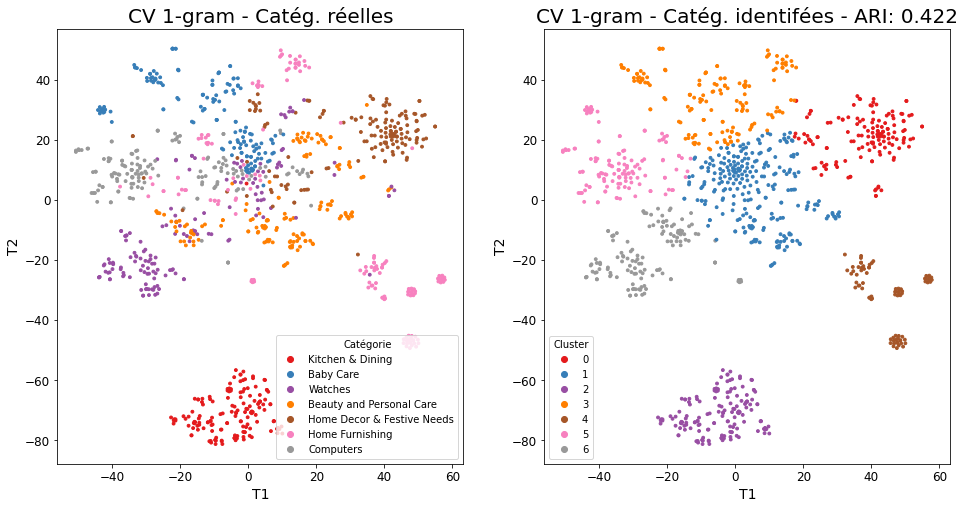

ARI : 0.4222
ARI :  0.191 time :  41.0


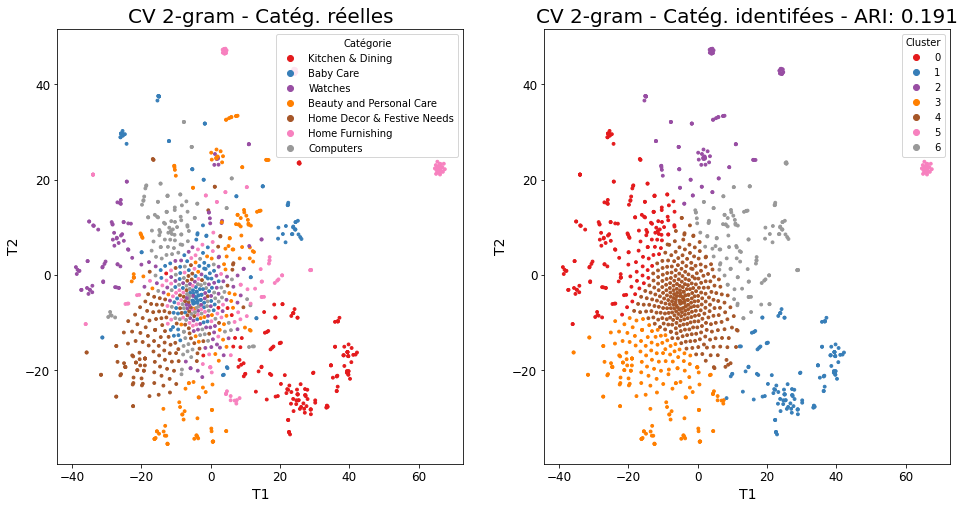

ARI : 0.1910
ARI :  0.0426 time :  42.0


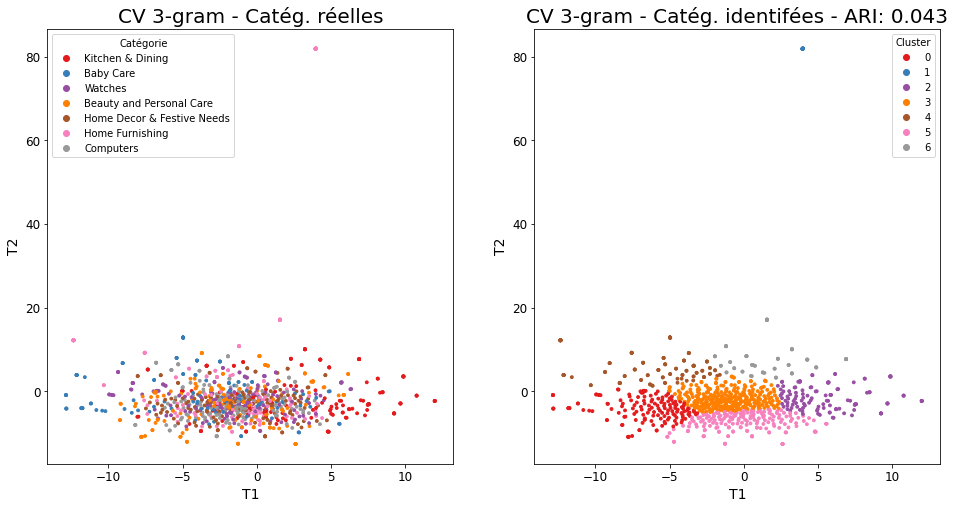

ARI : 0.0426


In [114]:
plt.rcParams['figure.figsize'] = [16, 8]
plt.rcParams['axes.titlesize'] = 20
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12

ind = 0
for embeddings in [df_em_1gram, df_em_2gram, df_em_3gram]:
    ARI, X_tsne, labels = ARI_fct(embeddings, y_cat_num, n_cat, perplexity=20, n_iter=3000) # déterminés au DOE ci-dessous

    ind += 1
    feat_extractor = f'CV {ind}-gram'
    TSNE_visu_fct(X_tsne, l_cat, y_cat_num, labels, ARI, title_prefix=feat_extractor)

## TF-IDF

In [115]:
def main_tf_idf(data, ngram = 1, MAX_NB_WORDS = 75000, verbose=0):
    tfidf_x = TfidfVectorizer(ngram_range = (ngram, ngram), max_features = MAX_NB_WORDS)
    emb = tfidf_x.fit_transform(data).toarray()
    if verbose>0: print("tf-idf with", str(np.array(emb).shape[1]), "features")
    return emb, tfidf_x

In [116]:
corpus_col = 'sentence_bow_stem' # 'sentence_bow_lem'

In [117]:
test_corpus = df_tk[corpus_col][:5].tolist()
print("The test corpus: ", test_corpus, "\n")

The test corpus:  ['eleg polyest multicolor abstract eyelet door curtain featur eleg polyest multicolor abstract eyelet door curtain floral curtain eleg polyest multicolor abstract eyelet door curtain cm height pack curtain enhanc look curtain made high qualiti polyest featur eyelet style stitch metal make room environ romant curtain ant wrinkl anti shrinkag eleg home bright modernist appeal design surreal attent sure steal heart contemporari eyelet valanc curtain slide smoothli draw apart first thing morn welcom bright sun ray want wish good morn whole world draw close even creat special moment joyou beauti given sooth print bring home eleg curtain softli filter light room get right amount specif eleg polyest multicolor abstract eyelet door curtain cm height pack gener brand eleg design door type eyelet model name abstract polyest door curtain set model id color multicolor dimens length cm box content packag pack packag curtain bodi design materi polyest', 'sathiya cotton bath towel s

In [118]:
test_tfidf_em_1gram, test_tfidf_1gram = main_tf_idf(test_corpus, ngram=1, verbose=1)
print_out(test_tfidf_em_1gram, test_tfidf_1gram, ngram="Uni-gram")

tf-idf with 184 features
Uni-gram bag-of-words: 
['absorb' 'abstract' 'amount' 'ant' 'anti' 'apart' 'appeal' 'assort'
 'attent' 'bath' 'beauti' 'bed' 'bedsheet' 'bleach' 'blue' 'bodi' 'box'
 'boy' 'brand' 'bright' 'bring' 'care' 'close' 'cm' 'cold' 'color'
 'colour' 'comfort' 'contemporari' 'content' 'cotton' 'count' 'cover'
 'creat' 'curtain' 'defect' 'depth' 'deserv' 'design' 'dimens' 'door'
 'doubl' 'draw' 'dri' 'durabl' 'eleg' 'enhanc' 'enrich' 'environ'
 'eurospa' 'even' 'exchang' 'exclus' 'export' 'eyelet' 'fabric' 'face'
 'famou' 'fashion' 'fast' 'featur' 'feel' 'filter' 'fine' 'first' 'fit'
 'flat' 'floral' 'gener' 'get' 'girl' 'given' 'gold' 'goldbedi' 'good'
 'gsm' 'hand' 'heart' 'height' 'high' 'home' 'id' 'ideal' 'inch' 'iron'
 'jaipur' 'joyou' 'king' 'last' 'length' 'light' 'long' 'look' 'lot'
 'machin' 'machinewash' 'made' 'make' 'manufactur' 'materi' 'may' 'mediam'
 'men' 'metal' 'model' 'modernist' 'moment' 'morn' 'multicolor' 'name'
 'nice' 'note' 'onl' 'origion' 'pack

In [119]:
test_tfidf_em_2gram, test_tfidf_2gram = main_tf_idf(test_corpus, ngram=2, verbose=1)
print_out(test_tfidf_em_2gram, test_tfidf_2gram, ngram="Bi-gram")

tf-idf with 377 features
Bi-gram bag-of-words: 
['absorb soft' 'abstract eyelet' 'abstract polyest' 'amount specif'
 'ant wrinkl' 'anti shrinkag' 'apart first' 'appeal design' 'assort bath'
 'assort dimens' 'assort eurospa' 'attent sure' 'bath towel'
 'beauti given' 'bed sheet' 'bedsheet bed' 'bedsheet cotton'
 'bedsheet featur' 'bedsheet long' 'bedsheet nice' 'bedsheet perfact'
 'bedsheet pillow' 'bedsheet royal' 'bleach dimens' 'bleach flat'
 'bleach size' 'blue bath' 'blue size' 'bodi design' 'box content'
 'boy girl' 'brand eleg' 'brand eurospa' 'brand jaipur' 'brand last'
 'brand santosh' 'brand sathiya' 'bright modernist' 'bright sun'
 'bring exclus' 'bring home' 'care machin' 'care machinewash' 'care skin'
 'care wash' 'close even' 'cm box' 'cm fit' 'cm flat' 'cm height'
 'cm pillow' 'cm specif' 'cm weight' 'cold water' 'color assort'
 'color may' 'color multicolor' 'color red' 'color white' 'colour good'
 'comfort bed' 'contemporari eyelet' 'content packag' 'cotton bath'
 'cott

In [120]:
test_tfidf_em_3gram, test_tfidf_3gram = main_tf_idf(test_corpus, ngram=3, verbose=1)
print_out(test_tfidf_em_3gram, test_tfidf_3gram, ngram="Tri-gram")

tf-idf with 453 features
Tri-gram bag-of-words: 
['absorb soft durabl' 'abstract eyelet door' 'abstract polyest door'
 'amount specif eleg' 'ant wrinkl anti' 'anti shrinkag eleg'
 'apart first thing' 'appeal design surreal' 'assort bath towel'
 'assort dimens weight' 'assort eurospa bring' 'attent sure steal'
 'bath towel bath' 'bath towel featur' 'bath towel gsm' 'bath towel ideal'
 'bath towel lot' 'bath towel red' 'bath towel specif'
 'beauti given sooth' 'bed sheet hand' 'bed sheet made' 'bed sheet pillow'
 'bedsheet bed sheet' 'bedsheet cotton jaipur' 'bedsheet featur jaipur'
 'bedsheet featur santosh' 'bedsheet long specif' 'bedsheet nice look'
 'bedsheet perfact wed' 'bedsheet pillow cover' 'bedsheet royal bedsheet'
 'bleach dimens flat' 'bleach flat dri' 'bleach size king'
 'blue bath towel' 'blue size mediam' 'bodi design materi'
 'box content packag' 'boy girl men' 'boy girl model' 'brand eleg design'
 'brand eurospa gsm' 'brand jaipur print' 'brand last year'
 'brand santosh

In [121]:
# implement into the whole dataset
df_corpus = df_tk[corpus_col].tolist()
df_corpus = df_tk[corpus_col].tolist()
df_tfidf_1gram, tfidf_1gram = main_tf_idf(df_corpus, 1)
df_tfidf_2gram, tfidf_2gram = main_tf_idf(df_corpus, 2)
df_tfidf_3gram, tfidf_3gram = main_tf_idf(df_corpus, 3)

print(len(df_corpus))
print(df_tfidf_1gram.shape)
print(df_tfidf_2gram.shape)
print(df_tfidf_3gram.shape)

1050
(1050, 3851)
(1050, 16951)
(1050, 22056)


In [122]:
%matplotlib inline
plt.rcParams['figure.figsize'] = [10, 10]
plt.rcParams['axes.titlesize'] = 15
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12

In [123]:
embeddings = df_tfidf_1gram
X_tsne = TSNE_calc_unsupervised(embeddings)
X = X_tsne

Time : 27.0


In [124]:
n_clusters = 7

Détermination des clusters...
Visalisation des clusters...


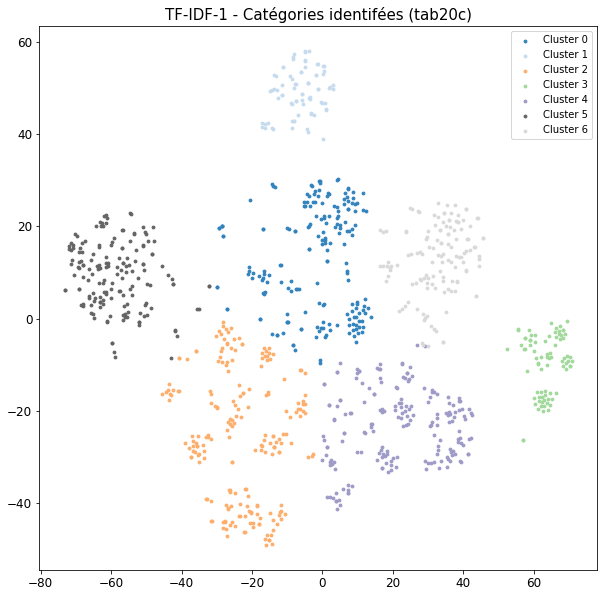

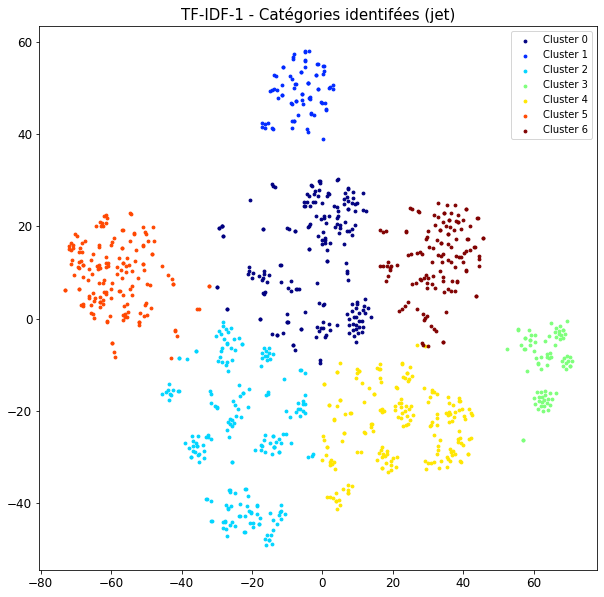

array([4, 0, 0, ..., 4, 4, 4])

In [125]:
feat_extractor = 'TF-IDF-1'
launch_text_clustering(feat_extractor, embeddings, n_clusters, 
                       df_tk, X, 'label', verbose=1)

ARI :  0.66 time :  26.0


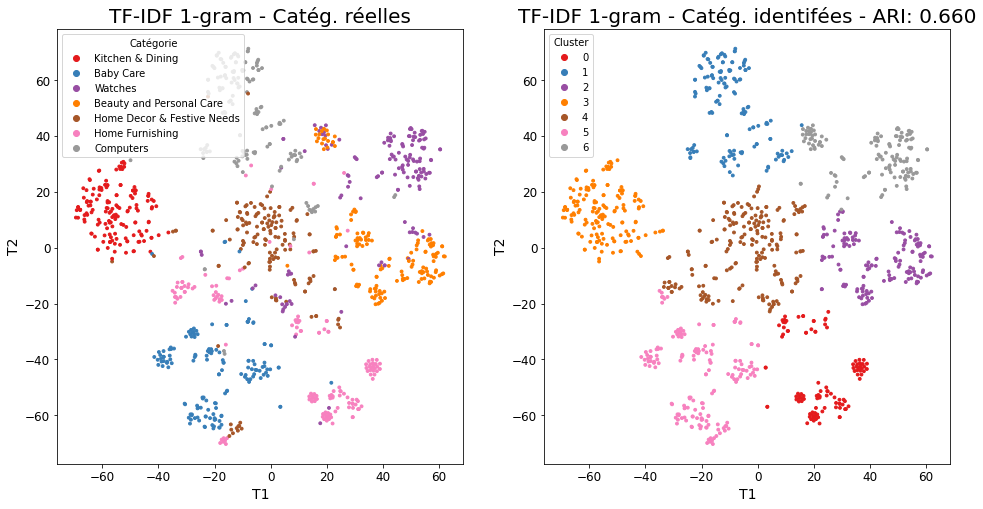

ARI : 0.6600
ARI :  0.3806 time :  23.0


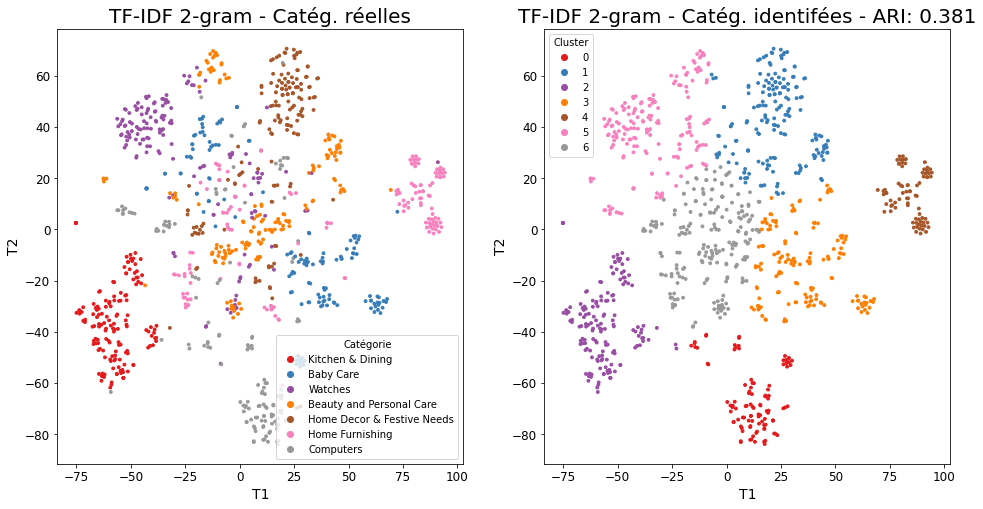

ARI : 0.3806
ARI :  0.1874 time :  33.0


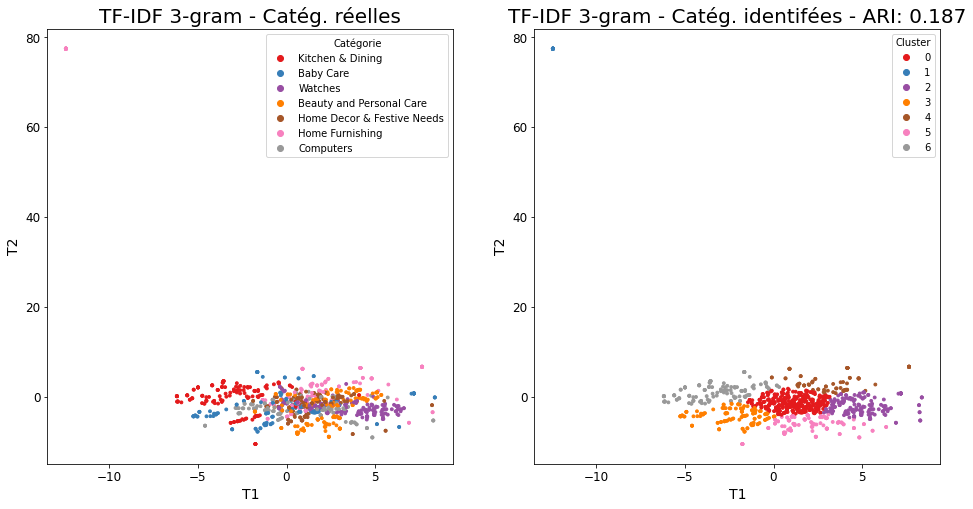

ARI : 0.1874


In [126]:
plt.rcParams['figure.figsize'] = [16, 8]
plt.rcParams['axes.titlesize'] = 20
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12

ind = 0
for embeddings in [df_tfidf_1gram, df_tfidf_2gram, df_tfidf_3gram]:
    n_cat = len(np.unique(y_cat_num))
    ARI, X_tsne, labels = ARI_fct(embeddings, y_cat_num, n_cat, perplexity=20, n_iter=3000)

    ind += 1
    feature_extractor = f'TF-IDF {ind}-gram'
    TSNE_visu_fct(X_tsne, l_cat, y_cat_num, labels, ARI, title_prefix=feature_extractor)

## Word2vec

In [127]:
def make_and_train_word2vec(sentences, w2v_size, w2v_window, w2v_min_count, w2v_epochs, maxlen, verbose=0):
    """Création et entraînement du modèle Word2Vec."""

    print("Build & train Word2Vec model ...")
    w2v_model = gensim.models.Word2Vec(min_count=w2v_min_count, window=w2v_window,
                                       vector_size=w2v_size,
                                       seed=42,
#                                        seed=18011975,
                                       workers=1)
    #                                    workers=multiprocessing.cpu_count())
    w2v_model.build_vocab(sentences)
    w2v_model.train(sentences, total_examples=w2v_model.corpus_count, epochs=w2v_epochs)
    model_vectors = w2v_model.wv
    w2v_words = model_vectors.index_to_key
    if verbose>1: print("Vocabulary size: %i" % len(w2v_words))
    if verbose>1: print("Word2Vec trained")
    return w2v_model, w2v_words, model_vectors

In [128]:
def prepare_sentences(sentences, maxlen, verbose=0):
    """Préparation des sentences (tokenization)."""

    if verbose > 0: print("Fit Tokenizer ...")
    tokenizer = Tokenizer()
    tokenizer.fit_on_texts(sentences)
    x_sentences = pad_sequences(tokenizer.texts_to_sequences(sentences),
                                maxlen=maxlen,
                                padding='post')

    num_words = len(tokenizer.word_index) + 1
    if verbose > 1: print("Number of unique words: %i" % num_words)
    return tokenizer, x_sentences, num_words

In [129]:
def make_embedding_matrix(tokenizer, w2v_size, w2v_words, model_vectors, verbose=0):
    """Création de la matrice d'embedding"""

    if verbose>0: print("Create Embedding matrix ...")
    word_index = tokenizer.word_index
    vocab_size = len(word_index) + 1
    embedding_matrix = np.zeros((vocab_size, w2v_size))
    i=0
    j=0

    for word, idx in word_index.items():
        i +=1
        if word in w2v_words:
            j +=1
            embedding_vector = model_vectors[word]
            if embedding_vector is not None:
                embedding_matrix[idx] = model_vectors[word]

    word_rate = np.round(j/i,4)
    if verbose>1: print("Word embedding rate : ", word_rate)
    if verbose>1: print("Embedding matrix: %s" % str(embedding_matrix.shape))
    return embedding_matrix, vocab_size

In [130]:
def make_model_word2vec(maxlen, vocab_size, w2v_size, x_sentences, embedding_matrix, verbose=0):
    """Création du modèle."""

    if verbose>0: print("Making Embedding model ...")
    input = Input(shape=(len(x_sentences), maxlen), dtype='float64')
    word_input = Input(shape=(maxlen,), dtype='float64')
    word_embedding = Embedding(input_dim=vocab_size,
                               output_dim=w2v_size,
                               weights=[embedding_matrix],
                               input_length=maxlen)(word_input)
    word_vec = GlobalAveragePooling1D()(word_embedding)
    embed_model = Model([word_input], word_vec)

    if verbose>0: embed_model.summary()
    return embed_model

In [131]:
def main_word2vec(sentences, w2v_size, w2v_window, w2v_min_count, w2v_epochs, maxlen, verbose=0):
    w2v_model, w2v_words, model_vectors = make_and_train_word2vec(sentences, w2v_size, w2v_window, w2v_min_count, w2v_epochs, maxlen, verbose)
    tokenizer, x_sentences, num_words = prepare_sentences(sentences, maxlen, verbose)
    embedding_matrix, vocab_size = make_embedding_matrix(tokenizer, w2v_size, w2v_words, model_vectors, verbose)
    embed_model = make_model_word2vec(maxlen, vocab_size, w2v_size, x_sentences, embedding_matrix, verbose)
    if verbose>0: print('Predicting embeddings...')
    embeddings = embed_model.predict(x_sentences)
    if verbose>2: print(embeddings.shape)
    return embeddings

In [132]:
corpus_col = 'sentence_bow_lem'

sentences = df_tk[corpus_col].to_list()
sentences = [gensim.utils.simple_preprocess(text) for text in sentences]

In [133]:
w2v_size = 50 # by DOE #300
w2v_window = 2
w2v_min_count = 2
w2v_epochs = 200 #100
maxlen = 50 #24 # adapt to length of sentences

In [134]:
verbose = 1
embeddings_word2vec = main_word2vec(sentences, w2v_size, w2v_window, w2v_min_count, w2v_epochs, maxlen, verbose=verbose)

Build & train Word2Vec model ...
Fit Tokenizer ...
Create Embedding matrix ...
Making Embedding model ...
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 50)]              0         
                                                                 
 embedding (Embedding)       (None, 50, 50)            220000    
                                                                 
 global_average_pooling1d (G  (None, 50)               0         
 lobalAveragePooling1D)                                          
                                                                 
Total params: 220,000
Trainable params: 220,000
Non-trainable params: 0
_________________________________________________________________
Predicting embeddings...
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBO

In [135]:
feat_extractor = 'word2vec'
embeddings_word2vec.shape

(1050, 50)

In [136]:
embeddings = embeddings_word2vec
X_tsne = TSNE_calc_unsupervised(embeddings)
X = X_tsne
# X = embeddings

Time : 18.0


In [137]:
if 0: 
    plt.rcParams['figure.figsize'] = [10, 6]
    plt.rcParams['axes.titlesize'] = 18
    plt.rcParams['axes.labelsize'] = 15
    plt.rcParams['xtick.labelsize'] = 15
    plt.rcParams['ytick.labelsize'] = 15
    n_min, n_max = 2, 20
    visu_elbow(X, n_min, n_max)

Coude magnifique en 3 mais l'inertie reste élevée. Pour comparer aux catégories de premier range, on travaille avec  n_clusters = 7.

In [138]:
n_clusters = 7

Détermination des clusters...
Visalisation des clusters...


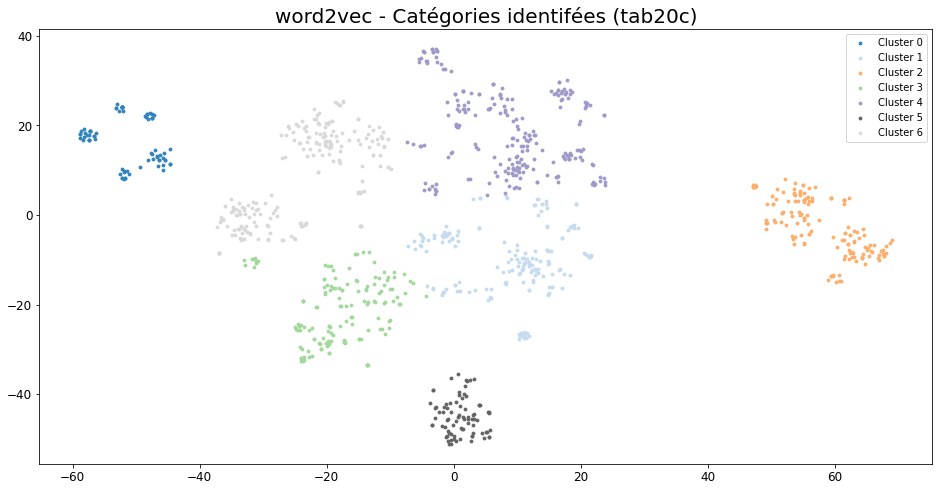

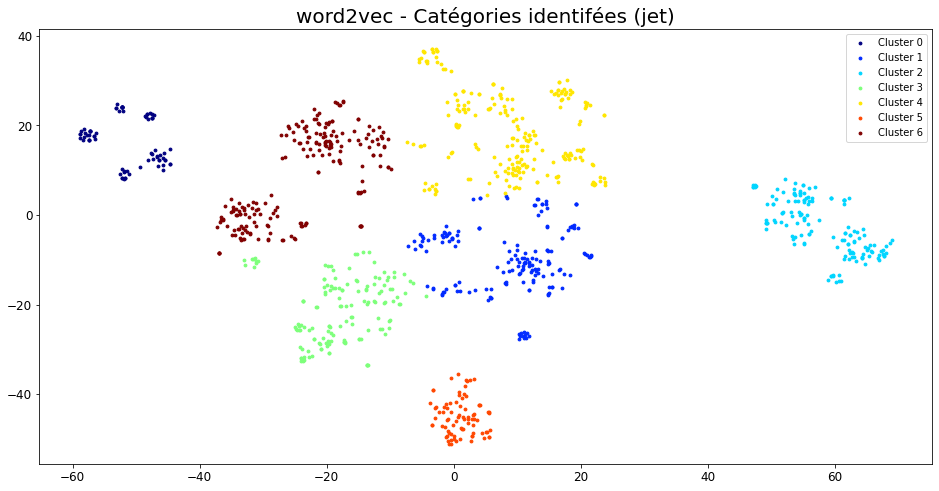

array([3, 3, 3, ..., 4, 4, 4])

In [139]:
%matplotlib inline
plt.rcParams['figure.figsize'] = [16, 8]
plt.rcParams['axes.titlesize'] = 20
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12

launch_text_clustering(feat_extractor, embeddings, n_clusters, 
                       df_tk, X_tsne, 'label', verbose=1)

In [140]:
ARI, X_tsne, labels = ARI_fct(embeddings, y_cat_num, n_cat, perplexity=20, n_iter=3000)

ARI :  0.5836 time :  22.0


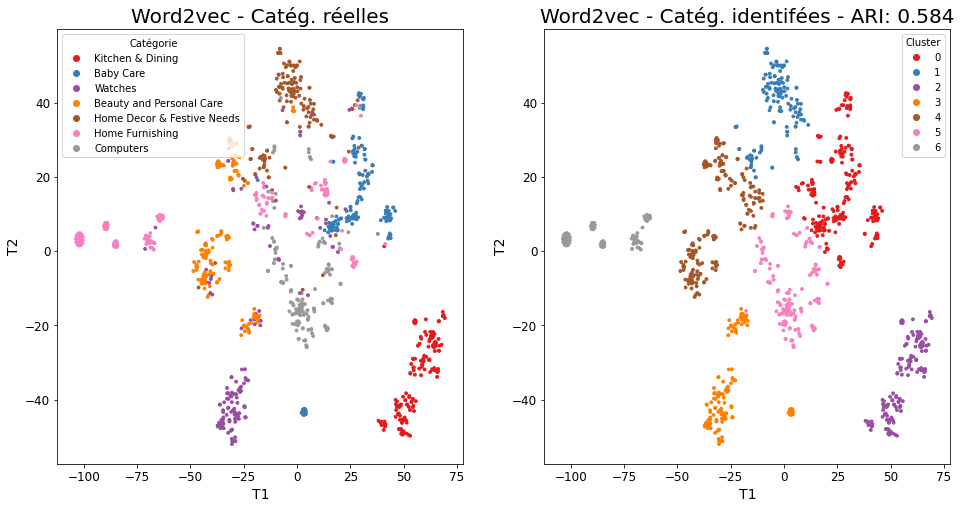

ARI : 0.5836


In [141]:
plt.rcParams['figure.figsize'] = [16, 8]
plt.rcParams['axes.titlesize'] = 20
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12

feature_extractor = 'Word2vec'
TSNE_visu_fct(X_tsne, l_cat, y_cat_num, labels, ARI, title_prefix=feature_extractor)

#### Nom seul avec Word2vec

In [142]:
transf_cols0 = {'name_bow': transform_bow_fct,
                'name_bow_lem': transform_bow_lem_fct,
                'name_bow_stem': transform_bow_stem_fct,
                'name_dl': transform_dl_fct}

In [143]:
df_tk = create_transformed_columns(df_tk, transf_cols0, 'product_name')

In [144]:
sentences = df_tk['product_name'].to_list()
sentences = [gensim.utils.simple_preprocess(text) for text in sentences]

In [145]:
verbose = 1
embeddings_word2vec = main_word2vec(sentences, w2v_size, w2v_window, w2v_min_count, w2v_epochs, maxlen, verbose=verbose)

Build & train Word2Vec model ...
Fit Tokenizer ...
Create Embedding matrix ...
Making Embedding model ...
Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 50)]              0         
                                                                 
 embedding_1 (Embedding)     (None, 50, 50)            101950    
                                                                 
 global_average_pooling1d_1   (None, 50)               0         
 (GlobalAveragePooling1D)                                        
                                                                 
Total params: 101,950
Trainable params: 101,950
Non-trainable params: 0
_________________________________________________________________
Predicting embeddings...
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VER

In [146]:
ARI, X_tsne, labels = ARI_fct(embeddings_word2vec, y_cat_num, n_cat)

ARI :  0.4609 time :  31.0


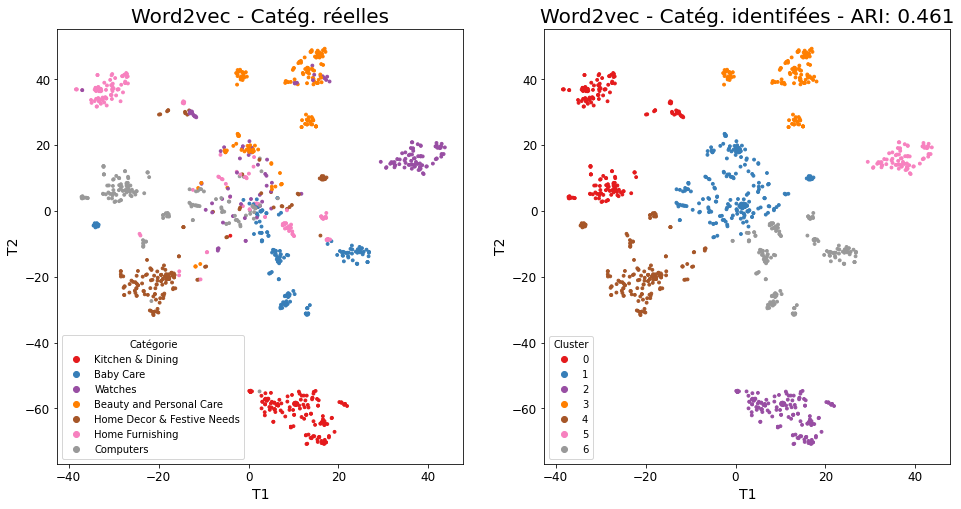

ARI : 0.4609


In [147]:
plt.rcParams['figure.figsize'] = [16, 8]
plt.rcParams['axes.titlesize'] = 20
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
feature_extractor = 'Word2vec'
TSNE_visu_fct(X_tsne, l_cat, y_cat_num, labels, ARI, title_prefix=feature_extractor)

Le nom de produit seul donne des résultats pas inintéressants.

## gloVe

https://www.kaggle.com/code/longtng/nlp-preprocessing-feature-extraction-methods-a-z

In [148]:
glove_input_file = "../../input/glove6b/glove.6B.100d.txt"
word2vec_output_file = "../../input/glove6b/glove.6B.100d.txt.word2vec"

In [149]:
# glove2word2vec(glove_input_file, word2vec_output_file)

glove_model = gensim.models.KeyedVectors.load_word2vec_format(word2vec_output_file, binary=False, limit=200000) 

In [150]:
def get_glove_average_vec(tokens_list, vector, generate_missing=False, k=300):
    """Calculate average embedding value of sentence from each word vector."""
    
    if len(tokens_list)<1:
        return np.zeros(k)
    
    tokens_list = tokens_list.split(' ')
    if generate_missing:
        vectorized = [vector[word] if word in vector else np.random.rand(k) for word in tokens_list]
    else:
        vectorized = [vector[word] if word in vector else np.zeros(k) for word in tokens_list]
    
    length = len(vectorized)
    summed = np.sum(vectorized, axis=0)
    averaged = np.divide(summed, length)
    return averaged

def get_glove_embeddings(vectors, text, generate_missing=False, k=300):
    """create the sentence embedding."""
    embeddings = text.apply(lambda x: get_glove_average_vec(x, vectors, generate_missing=generate_missing, k=k))
    return list(embeddings)

In [151]:
corpus_col = 'sentence_bow_lem'
embeddings_glove = get_glove_embeddings(glove_model, df_tk[corpus_col], k=300)

In [152]:
print("Embedding matrix size", len(embeddings_glove), len(embeddings_glove[0]))
print("The sentence: \"%s\" got embedding values: " % df_tk[corpus_col][0])
print(embeddings_glove[0])

Embedding matrix size 1050 300
The sentence: "elegance polyester multicolor abstract eyelet door curtain elegance polyester multicolor abstract eyelet door curtain floral curtain elegance polyester multicolor abstract eyelet door curtain cm height pack curtain enhances look curtain made high quality polyester eyelet style stitch metal make room environment romantic curtain ant wrinkle anti shrinkage elegant home bright modernistic appeal design surreal attention sure steal heart contemporary eyelet valance curtain slide smoothly draw apart first thing morning welcome bright sun ray want wish good morning whole world draw close evening create special moment joyous beauty given soothing print bring home elegant curtain softly filter light room get right amount elegance polyester multicolor abstract eyelet door curtain cm height pack general brand elegance designed door type eyelet model name abstract polyester door curtain set model id color multicolor dimension length cm box content pac

In [153]:
def main_glove(sentences, k, verbose=verbose):
    # glove_input_file = "../../input/glove6b/glove.6B.100d.txt"
    word2vec_output_file = "../../input/glove6b/glove.6B.100d.txt.word2vec"
    glove_model = gensim.models.KeyedVectors.load_word2vec_format(word2vec_output_file, binary=False, limit=200000)
    
#     tokens = pd.Series(sentences).apply(lambda x: x.split(' '))
    embeddings_glove = get_glove_embeddings(glove_model, sentences, k=k)
    if verbose>1: print("Embedding matrix size", len(embeddings_glove), len(embeddings_glove[0]))
    return embeddings_glove

In [154]:
feat_extractor = 'GloVe'
model = glove_model
print(feat_extractor)
embeddings = embeddings_glove # model.predict(x_sentences)

X_tsne = TSNE_calc_unsupervised(embeddings)

X = X_tsne
# X = embeddings

GloVe
Time : 33.0


In [155]:
if 0:
    plt.rcParams['figure.figsize'] = [10, 6]
    plt.rcParams['axes.titlesize'] = 18
    plt.rcParams['axes.labelsize'] = 15
    plt.rcParams['xtick.labelsize'] = 15
    plt.rcParams['ytick.labelsize'] = 15
    n_min, n_max = 2, 20
    visu_elbow(X, n_min, n_max)

Détermination des clusters...
Visalisation des clusters...


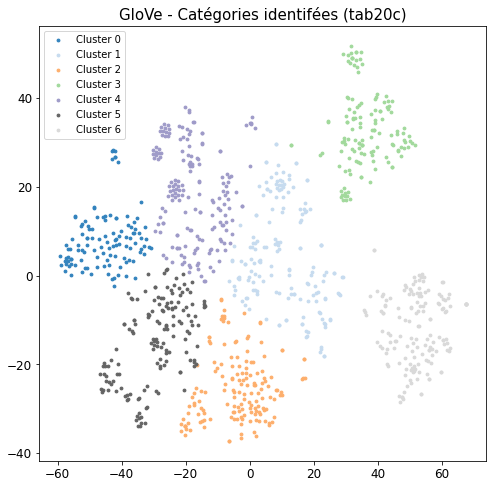

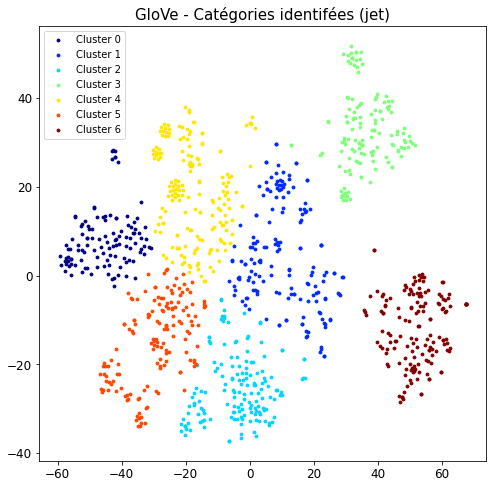

array([5, 2, 2, ..., 4, 0, 0])

In [156]:
%matplotlib inline
plt.rcParams['figure.figsize'] = [8, 8]
plt.rcParams['axes.titlesize'] = 15
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12

launch_text_clustering(feat_extractor, embeddings_glove, n_clusters, 
                       df_tk, X, 'label', verbose=1)

In [157]:
ARI, X_tsne, labels = ARI_fct(embeddings_glove, y_cat_num, n_cat, perplexity=30, n_iter=3000)

ARI :  0.6387 time :  30.0


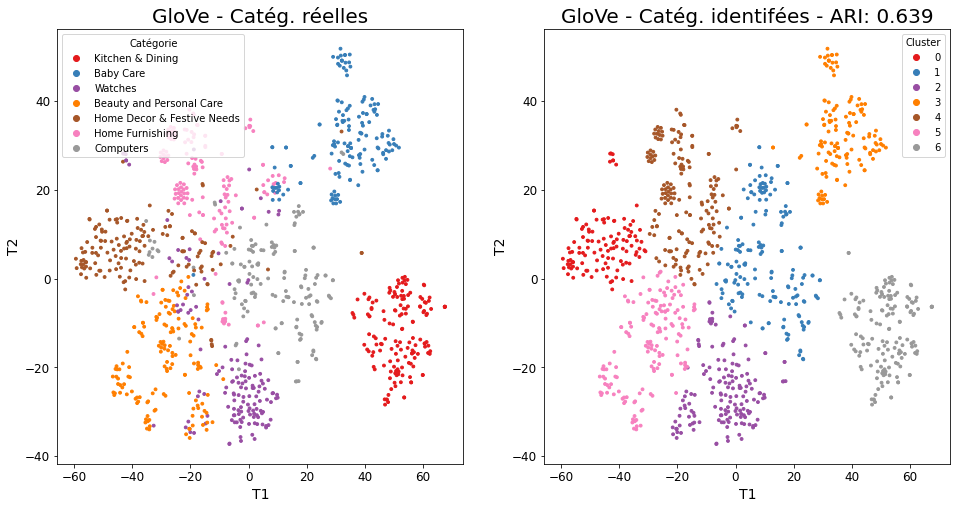

ARI : 0.6387


In [158]:
plt.rcParams['figure.figsize'] = [16, 8]
plt.rcParams['axes.titlesize'] = 20
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12

feature_extractor = 'GloVe'
TSNE_visu_fct(X_tsne, l_cat, y_cat_num, labels, ARI, title_prefix=feature_extractor)

## FastText

https://www.kaggle.com/code/longtng/nlp-preprocessing-feature-extraction-methods-a-z

In [159]:
if 0: # .vec à télécharger et positionner correctement dans le filesystem 
    fasttext_path = "./input/fasttext-wikinews/wiki-news-300d-1M.vec"
    fasttext_model = gensim.models.KeyedVectors.load_word2vec_format(fasttext_path, binary=False, limit=200000)

    print(fasttext_model.similarity('mug', 'cup'))
    print(fasttext_model.similarity('mug', 'glass'))
    print(fasttext_model.similarity('mug', 'goblet'))
    print(fasttext_model.similarity('mug', 'bottle'))

    embeddings_fasttext = get_embeddings(fasttext_model, df_tk[corpus_col], k=300)

    print("Embedding matrix size", len(embeddings_fasttext), len(embeddings_fasttext[0]))
    print("The sentence: \"%s\" got embedding values: " % df_tk[corpus_col][0])
    print(embeddings_fasttext[0])

In [160]:
if 0:
    feat_extractor = 'FastText'
    model = fasttext_model

    embeddings = [] # model.predict(x_sentences)

    X_tsne = TSNE_calc_unsupervised(embeddings)

    X = X_tsne
    # X = embeddings

In [161]:
if 0 :
    plt.rcParams['figure.figsize'] = [10, 6]
    plt.rcParams['axes.titlesize'] = 18
    plt.rcParams['axes.labelsize'] = 15
    plt.rcParams['xtick.labelsize'] = 15
    plt.rcParams['ytick.labelsize'] = 15
    n_min, n_max = 2, 20
    visu_elbow(X, n_min, n_max)

In [162]:
n_clusters = 7 # et ouais

In [163]:
if 0:
    # %matplotlib notebook
    plt.rcParams['figure.figsize'] = [8, 8]
    plt.rcParams['axes.titlesize'] = 15
    plt.rcParams['axes.labelsize'] = 12
    plt.rcParams['xtick.labelsize'] = 12
    plt.rcParams['ytick.labelsize'] = 12

    launch_text_clustering(feat_extractor, model, x_sentences, n_clusters, 
                           df_tk, X, 'label', verbose=1)

In [164]:
corpus_col = 'sentence_bow_stem'

## BERT

Notebook donné dans la mission.

https://www.kaggle.com/code/longtng/nlp-preprocessing-feature-extraction-methods-a-z

In [165]:
from transformers import BertTokenizer

In [166]:
print(f"Tensorflow version: {tensorflow.__version__}")
print(f"Num GPUs Available: {len(tf.config.experimental.list_physical_devices('GPU'))}")
print(f"Built with cuda   : {tf.test.is_built_with_cuda()}")

Tensorflow version: 2.10.0
Num GPUs Available: 0
Built with cuda   : True


### Fonctions communes

In [167]:
# Fonction de préparation des sentences
def bert_inp_fct(sentences, bert_tokenizer, max_length) :
    input_ids=[]
    token_type_ids = []
    attention_mask=[]
    bert_inp_tot = []

    for sent in sentences:
        bert_inp = bert_tokenizer.encode_plus(sent,
                                              add_special_tokens = True,
                                              max_length = max_length,
                                              padding='max_length',
                                              return_attention_mask = True, 
                                              return_token_type_ids=True,
                                              truncation=True,
                                              return_tensors="tf")
    
        input_ids.append(bert_inp['input_ids'][0])
        token_type_ids.append(bert_inp['token_type_ids'][0])
        attention_mask.append(bert_inp['attention_mask'][0])
        bert_inp_tot.append((bert_inp['input_ids'][0], 
                             bert_inp['token_type_ids'][0], 
                             bert_inp['attention_mask'][0]))

    input_ids = np.asarray(input_ids)
    token_type_ids = np.asarray(token_type_ids)
    attention_mask = np.array(attention_mask)
    
    return input_ids, token_type_ids, attention_mask, bert_inp_tot
    

# Fonction de création des features
def feature_BERT_fct(model, model_type, sentences, max_length, b_size, mode='HF', verbose=0) :
    batch_size = b_size
    batch_size_pred = b_size
#     bert_tokenizer = AutoTokenizer.from_pretrained(model_type)
    bert_tokenizer = transformers.AutoTokenizer.from_pretrained(model_type)
    time1 = time.time()

    for step in range(len(sentences)//batch_size) :
        idx = step*batch_size
        input_ids, token_type_ids, attention_mask, bert_inp_tot = bert_inp_fct(sentences[idx:idx+batch_size], 
                                                                      bert_tokenizer, max_length)
        
        if mode=='HF' :    # Bert HuggingFace
            outputs = model.predict([input_ids, attention_mask, token_type_ids], batch_size=batch_size_pred)
            last_hidden_states = outputs.last_hidden_state

        if mode=='TFhub' : # Bert Tensorflow Hub
            text_preprocessed = {"input_word_ids" : input_ids, 
                                 "input_mask" : attention_mask, 
                                 "input_type_ids" : token_type_ids}
            outputs = model(text_preprocessed)
            last_hidden_states = outputs['sequence_output']
             
        if step == 0 :
            last_hidden_states_tot = last_hidden_states
            last_hidden_states_tot_0 = last_hidden_states
        else :
            last_hidden_states_tot = np.concatenate((last_hidden_states_tot,last_hidden_states))
    
    features_bert = np.array(last_hidden_states_tot).mean(axis=1)
    
    time2 = np.round(time.time() - time1,0)
    if verbose>0: print("temps traitement : ", time2)
     
    return features_bert, last_hidden_states_tot

### BERT HuggingFace

#### 'bert-base-uncased'

In [168]:
max_length = 32 # by DOE #64
batch_size = 10
model_type = 'bert-base-uncased'
model = transformers.TFAutoModel.from_pretrained(model_type)
sentences = df_tk['sentence_dl'].to_list()

Some layers from the model checkpoint at bert-base-uncased were not used when initializing TFBertModel: ['mlm___cls', 'nsp___cls']
- This IS expected if you are initializing TFBertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
All the layers of TFBertModel were initialized from the model checkpoint at bert-base-uncased.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFBertModel for predictions without further training.


In [169]:
def main_BERT_HuggingFace(sentences, max_length, batch_size, model_type, verbose=0):
    model = transformers.TFAutoModel.from_pretrained(model_type)
    features_bert, last_hidden_states_tot = feature_BERT_fct(model, model_type, sentences, 
                                                             max_length, batch_size, mode='HF',
                                                             verbose=verbose)
    return features_bert

In [170]:
# Création des features

features_bert, last_hidden_states_tot = feature_BERT_fct(model, model_type, sentences, 
                                                         max_length, batch_size, mode='HF')

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set

In [171]:
features_bert.shape

(1050, 768)

In [172]:
ARI, X_tsne, labels = ARI_fct(features_bert, y_cat_num, n_cat, perplexity=20, n_iter=3000)

ARI :  0.3924 time :  32.0


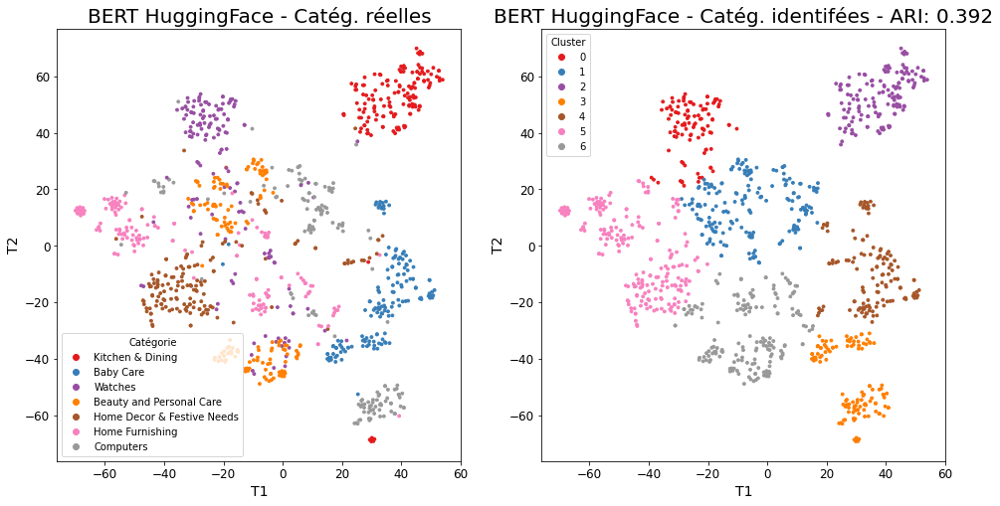

ARI : 0.3924


In [173]:
feature_extractor = 'BERT HuggingFace'
TSNE_visu_fct(X_tsne, l_cat, y_cat_num, labels, ARI, title_prefix=feature_extractor)

### BERT hub Tensorflow

In [174]:
def main_BERT_TFhub(sentences, max_length, batch_size, model_type,
                    t_SNE_perplexity=30, t_SNE_n_iter=3000, verbose=0):
    model_url = 'https://tfhub.dev/tensorflow/bert_en_uncased_L-12_H-768_A-12/4'
    bert_layer = hub.KerasLayer(model_url, trainable=True)
    features_bert, last_hidden_states_tot = feature_BERT_fct(model, model_type, sentences, 
                                                             max_length, batch_size, mode='TFhub',
                                                             verbose=verbose)
    return features_bert

In [175]:
import tensorflow_hub as hub
import tensorflow_text 

In [176]:
# Guide sur le Tensorflow hub : https://www.tensorflow.org/text/tutorials/classify_text_with_bert
model_url = 'https://tfhub.dev/tensorflow/bert_en_uncased_L-12_H-768_A-12/4'
bert_layer = hub.KerasLayer(model_url, trainable=True)

In [177]:
sentences = df_tk['sentence_dl'].to_list()

In [178]:
max_length = 64
batch_size = 10
model_type = 'bert-base-uncased'
model = bert_layer

In [179]:
features_bert_hub = main_BERT_TFhub(sentences, max_length, batch_size, model_type)

In [180]:
ARI, X_tsne, labels = ARI_fct(features_bert_hub, y_cat_num, n_cat, perplexity=30, n_iter=3000)

ARI :  0.3547 time :  26.0


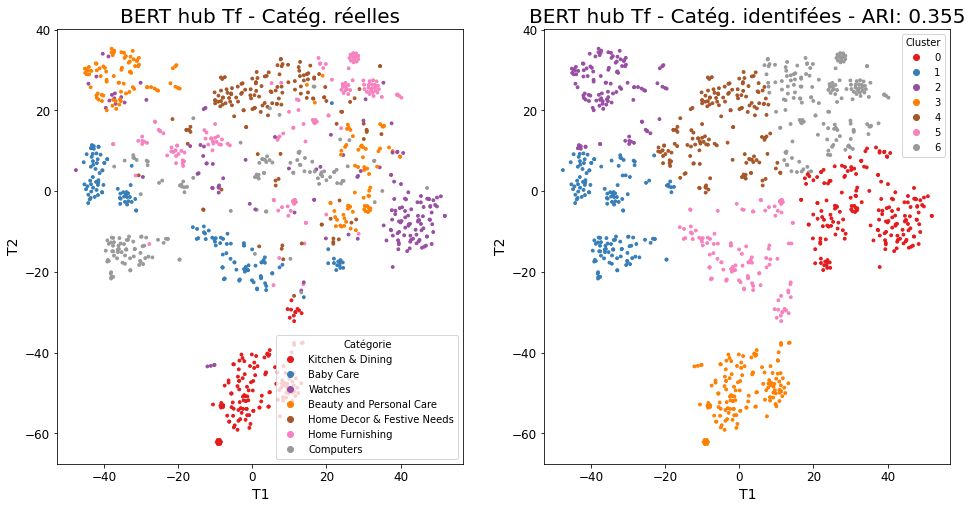

ARI : 0.3547


In [181]:
plt.rcParams['figure.figsize'] = [16, 8]
plt.rcParams['axes.titlesize'] = 20
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12

feature_extractor = 'BERT hub Tf'
TSNE_visu_fct(X_tsne, l_cat, y_cat_num, labels, ARI, title_prefix=feature_extractor)

## USE

In [182]:
print(f"Tensorflow version: {tensorflow.__version__}")
print(f"Num GPUs Available: {len(tf.config.experimental.list_physical_devices('GPU'))}")
print(f"Built with cuda   : {tf.test.is_built_with_cuda()}")

Tensorflow version: 2.10.0
Num GPUs Available: 0
Built with cuda   : True


In [183]:
embed = hub.load("https://tfhub.dev/google/universal-sentence-encoder/4")

In [184]:
def feature_USE_fct(sentences, b_size, verbose=0) :
    batch_size = b_size
    time1 = time.time()

    for step in range(len(sentences)//batch_size) :
        idx = step*batch_size
        feat = embed(sentences[idx:idx+batch_size])

        if step ==0 :
            features = feat
        else :
            features = np.concatenate((features,feat))

    time2 = np.round(time.time() - time1,0)
    return features

In [185]:
def main_USE(sentences, batch_size,
             t_SNE_perplexity=30, t_SNE_n_iter=3000, verbose=0):
    embed = hub.load("https://tfhub.dev/google/universal-sentence-encoder/4")
    features_USE = feature_USE_fct(sentences, batch_size, verbose=verbose)
    return features_USE

In [186]:
batch_size = 75 # by DOE #10
sentences = df_tk['sentence_dl'].to_list()

In [187]:
features_USE = feature_USE_fct(sentences, batch_size)

In [188]:
ARI, X_tsne, labels = ARI_fct(features_USE, y_cat_num, n_cat, perplexity=30, n_iter=3000)

ARI :  0.4746 time :  28.0


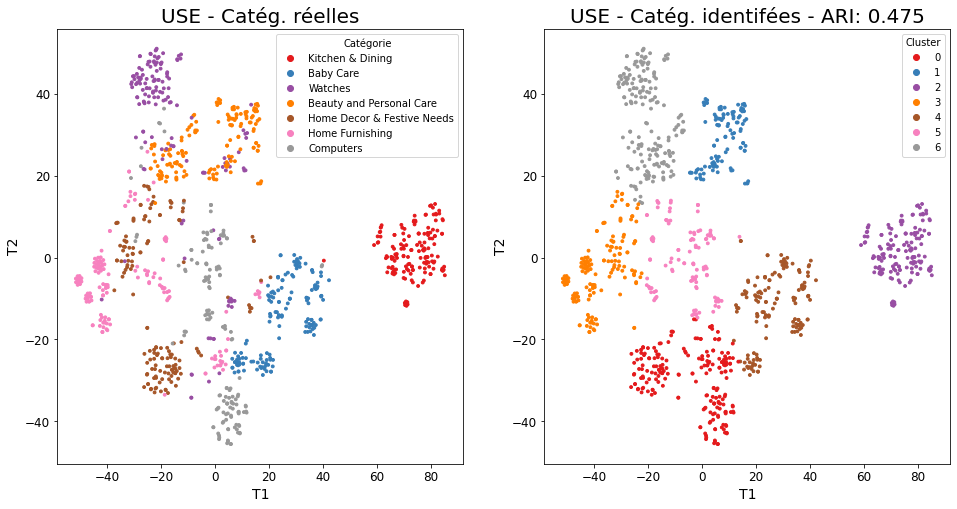

ARI : 0.4746


In [189]:
plt.rcParams['figure.figsize'] = [16, 8]
plt.rcParams['axes.titlesize'] = 20
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12

feature_extractor = 'USE'
TSNE_visu_fct(X_tsne, l_cat, y_cat_num, labels, ARI, title_prefix=feature_extractor)

## DOE

In [191]:
def make_grid_dict(param_grid):
    lists = [param_grid[key] for key in param_grid]
    grid = list(itertools.product(*lists))

    list_param_grid = []
    for lst in grid:
        list_param_grid.append({key:val for key, val in zip(param_grid.keys(), lst)})
        
    return list_param_grid

In [192]:
def make_doe_prepa_text(algos_prepa_text): 
    columns = ['Algorithm', 'Params']
    df_doe = pd.DataFrame(data=[], columns=columns)

    for algo in algos_prepa_text:
        new_doe = pd.DataFrame(data=[], columns=columns)
        new_doe['Params'] = make_grid_dict(algo['param_grid'])
        new_doe['Algorithm'] = algo['surname']
        df_doe = pd.concat([df_doe, new_doe], axis=0, ignore_index=True)
    return df_doe

In [193]:
param_grid_count_vect = {'ngram': [1],
                         'sentences_col': ['sentence_bow_lem', 'sentence_bow_stem'],
                         't-SNE-perplexity': [20, 30, 100],
                         't-SNE-n_iter': [2000, 3000]
                         }

param_grid_tf_idf = {'ngram': [1],
                     'sentences_col': ['sentence_bow_lem', 'sentence_bow_stem'],
                     't-SNE-perplexity': [20, 30, 100],
                     't-SNE-n_iter': [2000, 3000]
                     }
lil_param_grid_tf_idf = {'ngram': [1],
                     'sentences_col': ['sentence_bow_lem', 'sentence_bow_stem'],
                     't-SNE-perplexity': [30],
                     't-SNE-n_iter': [3000]
                     }

param_grid_w2v = {'w2v_size': [50, 100, 300],  # [50, 100, 300]
                  'w2v_window': [2, 5, 10],
                  'w2v_min_count': [1, 2],
                  'w2v_epochs': [100, 200],
                  'maxlen': [24, 50],  # 50, 24 # adapt to length of sentences
                  # , 'sentence_bow_stem'
                  'sentences_col': ['sentence_bow_lem'],
                  't-SNE-perplexity': [20, 30, 100],
                  't-SNE-n_iter': [2000, 3000]
                  }
lil_param_grid_w2v = {'w2v_size': [300],  # [50, 100, 300]
                      'w2v_window': [5],
                      'w2v_min_count': [1],
                      'w2v_epochs': [100],
                      'maxlen': [24, 50],  # 50, 24 # adapt to length of sentences
                      # , 'sentence_bow_stem'
                      'sentences_col': ['sentence_bow_lem'],
                      't-SNE-perplexity': [30],
                      't-SNE-n_iter': [3000]
                      }

param_grid_glove = {'k': [300], # difficile de modifier ce paramètre
                    'sentences_col': ['sentence_bow_lem', 'sentence_bow_stem'],
                    't-SNE-perplexity': [20, 30, 100],
                    't-SNE-n_iter': [3000]
                    }

param_grid_BERT_HF = {'max_length': [32, 64],
                      'batch_size': [10],
                      'model_type': ['bert-base-uncased'],
                      'sentences_col': ['sentence_dl'],
                      't-SNE-perplexity': [20, 30],
                      't-SNE-n_iter': [3000]
                      }
lil_param_grid_BERT_HF = {'max_length': [32],
                      'batch_size': [10],
                      'model_type': ['bert-base-uncased'],
                      'sentences_col': ['sentence_dl'],
                      't-SNE-perplexity': [20, 30],
                      't-SNE-n_iter': [3000]
                      }

param_grid_BERT_TFhub = {'max_length': [64],
                         'batch_size': [10, 30],
                         'model_type': ['bert-base-uncased'],
                         'sentences_col': ['sentence_dl'],
                         't-SNE-perplexity': [30],
                         't-SNE-n_iter': [3000]
                         }
lil_param_grid_BERT_TFhub = {'max_length': [64],
                         'batch_size': [10],
                         'model_type': ['bert-base-uncased'],
                         'sentences_col': ['sentence_dl'],
                         't-SNE-perplexity': [30],
                         't-SNE-n_iter': [2000]
                         }

param_grid_USE = {'batch_size': [10, 75, 150],
                  'sentences_col': ['sentence_dl'],
                  't-SNE-perplexity': [20, 30, 100],
                  't-SNE-n_iter': [3000]
                  }
lil_param_grid_USE = {'batch_size': [150], # IL FAUT QUE CE SOIT UN SOUS-MULTIPLE DE LA TAILLE DES DONNEES !!!
                  'sentences_col': ['sentence_dl'],
                  't-SNE-perplexity': [30],
                  't-SNE-n_iter': [3000]
                  }

In [194]:
algos_prepa_text = [
#                     {'surname': 'CountVectorizer',
#                      'param_grid': param_grid_count_vect,
#                     },
                    {'surname': 'TF-IDF',
                     'param_grid': param_grid_tf_idf,
                    },
#                     {'surname': 'Word2Vec',
#                      'param_grid': param_grid_w2v # lil_param_grid_w2v # param_grid_w2v
#                     },
#                     {'surname': 'GloVe',
#                      'param_grid': param_grid_glove
#                     },
#                     {'surname': 'BERT-HuggingFace',
#                      'param_grid': param_grid_BERT_HF
#                     },
#                     {'surname': 'BERT-TFhub',
#                      'param_grid': param_grid_BERT_TFhub
#                     },
#                     {'surname': 'USE',
#                      'param_grid': param_grid_USE
#                     },
                   ]

In [195]:
df_doe = make_doe_prepa_text(algos_prepa_text)
df_doe_init = df_doe.copy()
df_doe_init

,Algorithm,Params
0,TF-IDF,"{'ngram': 1, 'sentences_col': 'sentence_bow_le..."
1,TF-IDF,"{'ngram': 1, 'sentences_col': 'sentence_bow_le..."
2,TF-IDF,"{'ngram': 1, 'sentences_col': 'sentence_bow_le..."
3,TF-IDF,"{'ngram': 1, 'sentences_col': 'sentence_bow_le..."
4,TF-IDF,"{'ngram': 1, 'sentences_col': 'sentence_bow_le..."
5,TF-IDF,"{'ngram': 1, 'sentences_col': 'sentence_bow_le..."
6,TF-IDF,"{'ngram': 1, 'sentences_col': 'sentence_bow_st..."
7,TF-IDF,"{'ngram': 1, 'sentences_col': 'sentence_bow_st..."
8,TF-IDF,"{'ngram': 1, 'sentences_col': 'sentence_bow_st..."
9,TF-IDF,"{'ngram': 1, 'sentences_col': 'sentence_bow_st..."


In [196]:
def launch_doe_text_clustering(df, df_doe0, verbose=0):
    best_algo, best_X_tsne, best_labels = None, None, None
    
    df_doe = df_doe0.copy()
    
    best_ARI = 0.
    best_algo = None
    best_labels = None
    best_X_tsne = None
    best_params = None
    best_embeddings = None

    algo_name = None
    sentences_col = None
    ngram = None
    w2v_size = None
    w2v_window = None
    w2v_min_count = None
    w2v_epochs = None
    maxlen = None
    max_length = None
    batch_size = None
    model_type = None
    k = None
    # Boucle sur les problèmes à résoudre, càd les lignes de df_doe
    for ind in df_doe.index:

        problem = df_doe.loc[ind]
        algo_name_old = algo_name
        algo_name = problem['Algorithm']
        params = problem['Params']
        sentences_col_old = sentences_col
        sentences_col = params['sentences_col']
        if verbose>0: print('\n'+bcolors.BOLD+bcolors.HEADER+algo_name+'\n'+'-'*len(algo_name)+bcolors.ENDC)
        if verbose>0: print(bcolors.BOLD+f"Paramètres: {params}"+bcolors.ENDC)
        
        # Sentences
        sentences = df[sentences_col].to_list()
        sentences_df = df[sentences_col]
        sentences_p = [gensim.utils.simple_preprocess(text) for text in sentences]
        
        # t-SNE params
        t_SNE_perplexity = params['t-SNE-perplexity']
        t_SNE_n_iter = params['t-SNE-n_iter']
        
        # Word embedding
        if algo_name == 'CountVectorizer':
            ngram_old = ngram
            ngram = params['ngram']
            if (algo_name_old != algo_name) or (ngram_old != ngram) or \
                (sentences_col_old != sentences_col):
                embeddings, _ = main_count_vect(sentences, ngram, verbose=verbose)
        elif algo_name == 'TF-IDF':
            ngram_old = ngram
            ngram = params['ngram']
            if (algo_name_old != algo_name) or (ngram_old != ngram) or \
                (sentences_col_old != sentences_col):
                embeddings, _ = main_tf_idf(sentences, ngram, verbose=verbose)
        elif algo_name == 'Word2Vec':
            w2v_size_old = w2v_size
            w2v_window_old = w2v_window
            w2v_min_count_old = w2v_min_count
            w2v_epochs_old = w2v_epochs
            maxlen_old = maxlen
            w2v_size = params['w2v_size']
            w2v_window = params['w2v_window']
            w2v_min_count = params['w2v_min_count']
            w2v_epochs = params['w2v_epochs']
            maxlen = params['maxlen']
            if (algo_name_old != algo_name) or (w2v_size_old != w2v_size) or (w2v_window_old != w2v_window) \
                or (w2v_min_count_old != w2v_min_count) or (w2v_epochs_old != w2v_epochs) or (maxlen_old != maxlen) or \
                (sentences_col_old != sentences_col):
                embeddings = main_word2vec(sentences_p, w2v_size, w2v_window, w2v_min_count, w2v_epochs, maxlen, verbose=verbose)
        elif algo_name == 'GloVe':
            k_old = k
            k = params['k']
            if (algo_name_old != algo_name) or (k_old != k):
                embeddings = main_glove(sentences_df, k, verbose=verbose)
        elif algo_name == 'BERT-HuggingFace':
            max_length_old = max_length
            batch_size_old = batch_size
            model_type_old = model_type
            max_length = params['max_length']
            batch_size = params['batch_size']
            model_type = params['model_type']
            if (algo_name_old != algo_name) or (max_length_old != max_length) or (batch_size_old != batch_size) \
                or (model_type_old != model_type) or \
                (sentences_col_old != sentences_col):
                embeddings = main_BERT_HuggingFace(sentences, max_length, batch_size, model_type, verbose=verbose)
        elif algo_name == 'BERT-TFhub':
            max_length_old = max_length
            batch_size_old = batch_size
            model_type_old = model_type
            max_length = params['max_length']
            batch_size = params['batch_size']
            model_type = params['model_type']
            if (algo_name_old != algo_name) or (max_length_old != max_length) or (batch_size_old != batch_size) \
                or (model_type_old != model_type) or \
                (sentences_col_old != sentences_col):
                embeddings = main_BERT_TFhub(sentences, max_length, batch_size, model_type, verbose=verbose)            
        elif algo_name == 'USE':
            batch_size_old = batch_size
            batch_size = params['batch_size']
            if (algo_name_old != algo_name) or (batch_size_old != batch_size) or \
                (sentences_col_old != sentences_col):
                embeddings = main_USE(sentences, batch_size, verbose=verbose)
            else:
                print("ON A ZAPPE LE RECACLUL")
        else:
            print(bcolors.WARNING+f"*** Algorithm name unrecognized: {algo_name}***"+bcolors.ENDC)
            continue
            
        # t-SNE
        print(t_SNE_perplexity, t_SNE_n_iter)
        X_tsne = TSNE_calc_unsupervised(embeddings, perplexity=t_SNE_perplexity, n_iter=t_SNE_n_iter)
        X = X_tsne
        # X = embeddings

        # Clustering
        n_clusters = 7
        if verbose>1: print('Détermination des clusters...')
        labels, inertia = compute_clusters(X, n_clusters)
        
        # Score ARI
        y_cat_num = df['categs_1st_num']
#         print(f"embeddings.shape = {embeddings.shape}")
#         print(f"y_cat_num.shape = {y_cat_num.shape}, labels = {labels.shape}")
        ARI = metrics.adjusted_rand_score(y_cat_num, labels)
        if verbose>0: print(f"ARI : {ARI:.4f}")
        df_doe.loc[ind,'ARI score'] = ARI
        
        if ARI >= best_ARI:
            best_ARI = ARI
            best_algo = algo_name
            best_labels = labels
            best_X_tsne = X_tsne
            best_params = params
            best_embeddings = embeddings
            lc = 'label_'+algo_name
            df_tk[lc] = labels

    if verbose>0: 
        print("\n")
        print(bcolors.BOLD+bcolors.OKGREEN+"Best embedder  : "+bcolors.ENDC+bcolors.OKGREEN+f"{best_algo}")
        print(bcolors.BOLD+bcolors.OKGREEN+"Best parameters: "+bcolors.ENDC+bcolors.OKGREEN+f"{best_params}")
        print(bcolors.BOLD+bcolors.OKGREEN+"Best ARI score : "+bcolors.ENDC+bcolors.OKGREEN+f"{best_ARI:.4f}")
        print("\n"+bcolors.ENDC)
    return best_algo, best_params, best_X_tsne, best_labels, best_ARI, best_embeddings, df_tk, df_doe

In [205]:
LAUNCH_DOE = True
APPEND_DOE = False

In [208]:
if APPEND_DOE:
    if 'df_doe_res' in globals() :
        df_doe_res_SAVE = df_doe_res.copy()
else:
    df_doe_res_SAVE = pd.DataFrame()

In [209]:
plt.rcParams['figure.figsize'] = [10, 10]
plt.rcParams['axes.titlesize'] = 15
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12

verbose = 1
if LAUNCH_DOE:
    best_algo, best_params, best_X_tsne, best_labels, best_ARI, best_embeddings, df_tk_res, df_doe_res = launch_doe_text_clustering(df_tk, df_doe_init, verbose=verbose)
    timestamp = datetime.datetime.now().strftime('%Y%m%d_%H%M%S')
    if APPEND_DOE:
        df_doe_res = pd.concat((df_doe_res_SAVE, df_doe_res))
    df_doe_res.to_csv(f"DOE_text_clustering_{timestamp}.csv", sep=';')
    %store best_algo
    %store best_params
    %store best_X_tsne
    %store best_labels
    %store best_ARI
    %store best_embeddings
    %store df_tk_res
    %store df_doe_res
else:
    %store -r best_algo
    %store -r best_params
    %store -r best_X_tsne
    %store -r best_labels
    %store -r best_ARI
    %store -r best_embeddings
    %store -r df_tk_res
    %store -r df_doe_res
    


TF-IDF
------
Paramètres: {'ngram': 1, 'sentences_col': 'sentence_bow_lem', 't-SNE-perplexity': 20, 't-SNE-n_iter': 2000}
tf-idf with 4402 features
20 2000
Time : 16.0
ARI : 0.6281

TF-IDF
------
Paramètres: {'ngram': 1, 'sentences_col': 'sentence_bow_lem', 't-SNE-perplexity': 20, 't-SNE-n_iter': 3000}
20 3000
Time : 20.0
ARI : 0.6266

TF-IDF
------
Paramètres: {'ngram': 1, 'sentences_col': 'sentence_bow_lem', 't-SNE-perplexity': 30, 't-SNE-n_iter': 2000}
30 2000
Time : 17.0
ARI : 0.5367

TF-IDF
------
Paramètres: {'ngram': 1, 'sentences_col': 'sentence_bow_lem', 't-SNE-perplexity': 30, 't-SNE-n_iter': 3000}
30 3000
Time : 29.0
ARI : 0.4876

TF-IDF
------
Paramètres: {'ngram': 1, 'sentences_col': 'sentence_bow_lem', 't-SNE-perplexity': 100, 't-SNE-n_iter': 2000}
100 2000
Time : 36.0
ARI : 0.3692

TF-IDF
------
Paramètres: {'ngram': 1, 'sentences_col': 'sentence_bow_lem', 't-SNE-perplexity': 100, 't-SNE-n_iter': 3000}
100 3000
Time : 48.0
ARI : 0.3533

TF-IDF
------
Paramètres: {'ngram

In [210]:
best_algo, best_params, best_ARI

('TF-IDF',
 {'ngram': 1,
  'sentences_col': 'sentence_bow_stem',
  't-SNE-perplexity': 20,
  't-SNE-n_iter': 3000},
 0.6599551986271953)

In [211]:
df_doe_res

,Algorithm,Params,ARI score
0,TF-IDF,"{'ngram': 1, 'sentences_col': 'sentence_bow_le...",0.628124
1,TF-IDF,"{'ngram': 1, 'sentences_col': 'sentence_bow_le...",0.626638
2,TF-IDF,"{'ngram': 1, 'sentences_col': 'sentence_bow_le...",0.536686
3,TF-IDF,"{'ngram': 1, 'sentences_col': 'sentence_bow_le...",0.487617
4,TF-IDF,"{'ngram': 1, 'sentences_col': 'sentence_bow_le...",0.369163
5,TF-IDF,"{'ngram': 1, 'sentences_col': 'sentence_bow_le...",0.353303
6,TF-IDF,"{'ngram': 1, 'sentences_col': 'sentence_bow_st...",0.653874
7,TF-IDF,"{'ngram': 1, 'sentences_col': 'sentence_bow_st...",0.659955
8,TF-IDF,"{'ngram': 1, 'sentences_col': 'sentence_bow_st...",0.456192
9,TF-IDF,"{'ngram': 1, 'sentences_col': 'sentence_bow_st...",0.510873


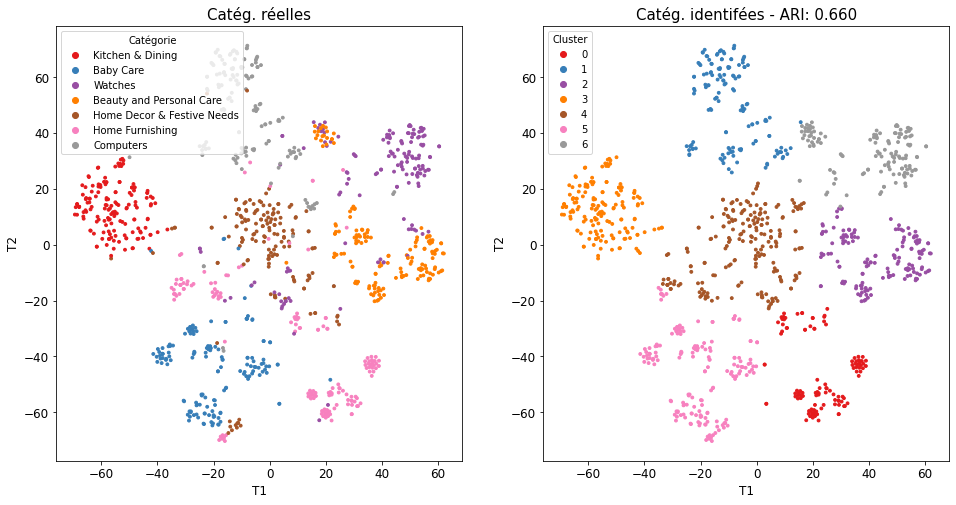

ARI : 0.6600


In [212]:
plt.rcParams['figure.figsize'] = [16, 8]
plt.rcParams['axes.titlesize'] = 15
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12

TSNE_visu_fct(best_X_tsne, l_cat, y_cat_num, best_labels, best_ARI)

Création d'une plance de visualisation pour une validation optique :

In [ ]:
# Création des planches d'images
lc = 'label_'+best_algo
image_col = 'image'
create_output_images(df_tk_res, lc, image_col, best_algo, verbose=1)

Copie des images correspondantes dans des répertoires séparés :

In [ ]:
create_output_dir_images(df_tk_res, lc, image_col, best_algo, verbose=1)

# Textes - Classification

## Word2vec

In [213]:
X_enc = embeddings_word2vec
y_enc = df_tk['categs_1st_num']

In [214]:
# Split train/test
X_train, X_test, y_train, y_test = train_test_split(X_enc, y_enc, test_size=0.2, random_state=18011975)

In [215]:
# gamma = [1., 5., 10.]
# min_child_weight = [5., 7.]
# colsample_bytree = [0.5, 1.]
# max_depth = [1, 3, 6]
# alpha = [1., 100., 200.]
param_grid_xgbc = {'n_estimators': [200], #[20, 50, 100, 200]
                   'learning_rate': [0.1], #[0.01, 0.1, 0.3]
                   'subsample': [0.5], #[0.5, 0.7, 1.]
                  }
param_grid_rfc = {'n_estimators': [200], #[20, 50, 100, 200]
                  'max_depth': [None], #[None, 1, 2, 5],
                  'min_samples_split': [2], #[2, 5, 10], 
                 }

In [216]:
mdl = GridSearchCV(
#                    XGBClassifier(), param_grid_xgbc,
                   RandomForestClassifier(), param_grid_rfc,
                   cv=5,
                   scoring='accuracy'
                   )

In [217]:
mdl.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'max_depth': [None], 'min_samples_split': [2],
                         'n_estimators': [200]},
             scoring='accuracy')

In [218]:
main_score_val = mdl.cv_results_['mean_test_score'].max()

In [219]:
main_score_val

0.8880952380952379

In [220]:
mdl.best_params_

{'max_depth': None, 'min_samples_split': 2, 'n_estimators': 200}

In [221]:
y_pred = mdl.predict(X_test)
s = metrics.accuracy_score(y_test, y_pred)
print(f"Accuracy sur test set = {s:.4f}")

Accuracy sur test set = 0.8952


## Tous les embeddings

In [222]:
y_enc = df_tk['categs_1st_num']
s = 0.
for embeddings, name in [
                         [df_em_1gram, 'df_em_1gram'],
#                          [df_em_2gram, 'df_em_2gram'],
#                          [df_em_3gram, 'df_em_3gram'],
                         [df_tfidf_1gram, 'df_tfidf_1gram'],
#                          [df_tfidf_2gram, 'df_tfidf_2gram'],
#                          [df_tfidf_3gram, 'df_tfidf_3gram'],
                         [embeddings_word2vec, 'embeddings_word2vec'],
                         [embeddings_glove, 'embeddings_glove'],
                         [features_bert, 'features_bert'],
                         [features_bert_hub, 'features_bert_hub'],
                         [features_USE, 'features_USE'],
                         ]:
    print(bcolors.BOLD+name+'\n'+'-'*len(name)+bcolors.ENDC)
    X_enc = embeddings

    # Split train/test
    X_train, X_test, y_train, y_test = train_test_split(X_enc, y_enc, test_size=0.2, random_state=18011975)  # 18011975 , stratify=y_enc


    time1 = time.time()
    mdl = GridSearchCV(
#                        XGBClassifier(), param_grid_xgbc,
                       RandomForestClassifier(), param_grid_rfc,
                       cv=5,
                       scoring='accuracy'
                       )
    mdl.fit(X_train, y_train)
    main_score_val = mdl.cv_results_['mean_test_score'].max()
#     name = varnameis(embeddings)
    print(f"main_score_val = {main_score_val:.4f}")
    print(f"best_params_ = {mdl.best_params_}")
    
#     mdl.best_estimator_.fit(X_test, y_train)
    y_test_pred = mdl.best_estimator_.predict(X_test)
    time2 = time.time() - time1
    s_old = s
    s = metrics.accuracy_score(y_test, y_test_pred)
    
    y_train_pred = mdl.best_estimator_.predict(X_train)
    s1 = metrics.accuracy_score(y_train, y_train_pred)
    print(f"Accuracy sur train set = {s1:.4f}")
    print(f"Accuracy sur test set  = {s:.4f}, elapsed = {time2:.1f}")
    if s > s_old:
        best_model = mdl.best_estimator_
        best_embeddings = embeddings
        best_embeddings_name = name
        best_accuray = s
    print('\n')

df_em_1gram
-----------
main_score_val = 0.9226
best_params_ = {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 200}
Accuracy sur train set = 1.0000
Accuracy sur test set  = 0.9238, elapsed = 13.8


df_tfidf_1gram
--------------
main_score_val = 0.9202
best_params_ = {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 200}
Accuracy sur train set = 1.0000
Accuracy sur test set  = 0.9429, elapsed = 16.3


embeddings_word2vec
-------------------
main_score_val = 0.8881
best_params_ = {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 200}
Accuracy sur train set = 0.9929
Accuracy sur test set  = 0.9000, elapsed = 10.2


embeddings_glove
----------------
main_score_val = 0.8929
best_params_ = {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 200}
Accuracy sur train set = 0.9952
Accuracy sur test set  = 0.9143, elapsed = 23.3


features_bert
-------------
main_score_val = 0.8774
best_params_ = {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 2

In [223]:
best_embeddings_name

'features_USE'

<img src="BandeauDonneesVisuelles.png" />

In [224]:
df_img = df_tk_res.copy()

# Images - Approche SIFT

In [225]:
img_dir = '../data/images/'

In [226]:
import cv2

In [227]:
print(cv2.__version__)

4.6.0


## Tests sur une image

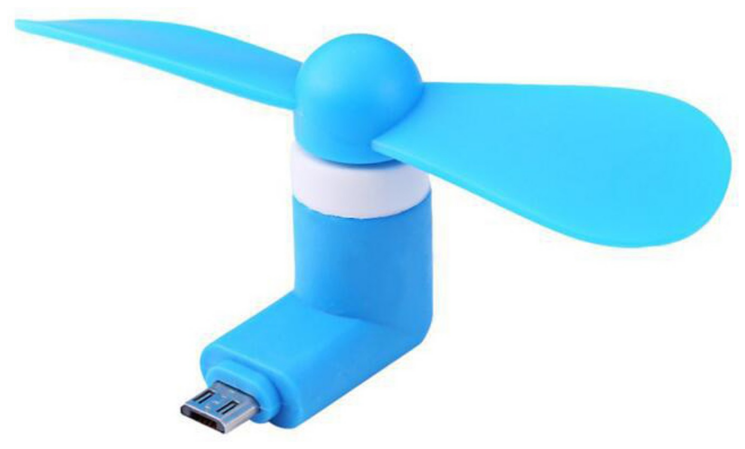

In [228]:
id = df_img.loc[53, 'image']
path_img = img_dir+f"{id}"
DisplotData.display_external_images([path_img])

In [229]:
sift = cv2.xfeatures2d.SIFT_create()

In [230]:
image = cv2.imread(path_img, 0) # convert in gray
image is None

False

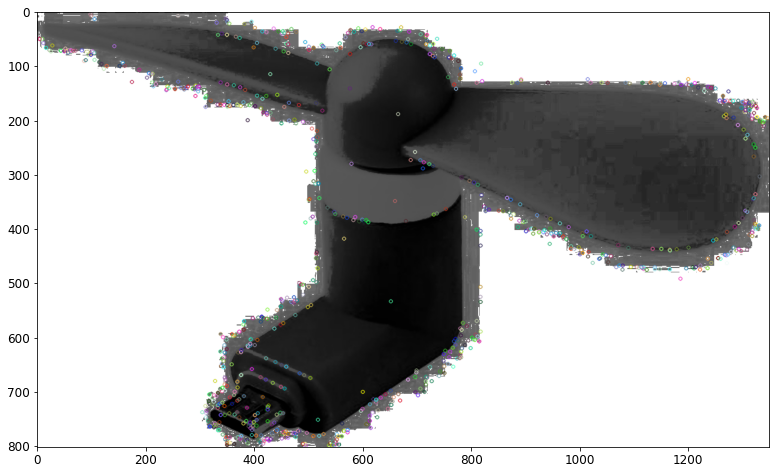

Descripteurs :  (969, 128)

[[  7.   6.   1. ...  67.   1.   1.]
 [ 14.  10.   0. ...  50.   1.   0.]
 [ 71.  31.  11. ...   1.   0.   0.]
 ...
 [ 54.  36.   0. ...   0.   3.  75.]
 [ 93.   0.   0. ...   0.   0.   1.]
 [138.  85.  10. ...   0.   0.   0.]]


In [231]:
image = cv2.equalizeHist(image)   # equalize image histogram
kp, des = sift.detectAndCompute(image, None)
img = cv2.drawKeypoints(image,kp,image)
plt.imshow(img)
plt.show()
print("Descripteurs : ", des.shape)
print()
print(des)

# Pré-traitement des images via SIFT

## Créations des descripteurs de chaque image

In [406]:
import time

In [407]:
help(cv2.xfeatures2d.SIFT_create)

Help on built-in function SIFT_create:

SIFT_create(...)
    SIFT_create([, nfeatures[, nOctaveLayers[, contrastThreshold[, edgeThreshold[, sigma]]]]]) -> retval
    .   Use cv.SIFT_create() instead



In [408]:
nb_features = 500

In [409]:
sift_keypoints = []
# sift = cv2.xfeatures2d.SIFT_create(500)
# sift = cv2.xfeatures2d.SIFT_create(nb_features)
sift = cv2.SIFT_create(nb_features)

In [410]:
df_img['categs_1st'].unique()

array(['Home Furnishing', 'Baby Care', 'Watches',
       'Home Decor & Festive Needs', 'Kitchen & Dining',
       'Beauty and Personal Care', 'Computers'], dtype=object)

In [411]:
TEST_UNITAIRE = False # A 2 classes

In [412]:
if TEST_UNITAIRE:
    df_img2 = df_img.loc[(df_img['categs_1st']=='Watches') | (df_img['categs_1st']=='Beauty and Personal Care')]
else:
    df_img2 = df_img.copy()

In [413]:
temps1 = time.time()
for image_num in df_img2.index:
    id = df_img2.loc[image_num, 'image']
    path_img = img_dir+f"{id}"
    if image_num%100 == 0 : print(image_num)
    image = cv2.imread(path_img,0) # convert in gray
    # image = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
    # Redimensionnement des images
    image = cv2.resize(image, (224, 224), interpolation = cv2.INTER_AREA)
    res = cv2.equalizeHist(image)   # equalize image histogram
    kp, des = sift.detectAndCompute(res, None)
    sift_keypoints.append(des)
duration1 = time.time()-temps1

0
100
200
300
400
500
600
700
800
900
1000


In [414]:
df_img2.shape

(1050, 18)

In [415]:
sift_keypoints_by_img = np.asarray(sift_keypoints)
sift_keypoints_all    = np.concatenate(sift_keypoints_by_img, axis=0)

print()
print("Nombre de descripteurs : ", sift_keypoints_all.shape)

print("Temps de traitement SIFT descriptor : ", "%15.2f" % duration1, "secondes")


Nombre de descripteurs :  (319625, 128)
Temps de traitement SIFT descriptor :            94.08 secondes


C:\Users\a072108\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:1: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  """Entry point for launching an IPython kernel.


## Création des clusters de descripteurs

In [416]:
from sklearn import cluster, metrics

# Determination number of clusters
temps1 = time.time()

k = int(round(np.sqrt(len(sift_keypoints_all)),0))
print("Nombre de clusters estimés : ", k)
print("Création de",k, "clusters de descripteurs ...")

# Clustering
kmeans = cluster.MiniBatchKMeans(n_clusters=k, init_size=3*k, random_state=0)
kmeans.fit(sift_keypoints_all)

duration1 = time.time()-temps1
print("temps de traitement kmeans : ", "%15.2f" % duration1, "secondes")

Nombre de clusters estimés :  565
Création de 565 clusters de descripteurs ...
temps de traitement kmeans :            18.36 secondes


## Création des features des images

In [417]:
# Creation of histograms (features)
temps1 = time.time()

def build_histogram(kmeans, des, image_num):
    res = kmeans.predict(des)
    hist = np.zeros(len(kmeans.cluster_centers_))
    nb_des=len(des)
    if nb_des==0 : print("problème histogramme image  : ", image_num)
    for i in res:
        hist[i] += 1.0/nb_des
    return hist


# Creation of a matrix of histograms
hist_vectors = []

for i, image_desc in enumerate(sift_keypoints_by_img) :
    if i%100 == 0 : print(i)  
    hist = build_histogram(kmeans, image_desc, i) #calculates the histogram
    hist_vectors.append(hist) #histogram is the feature vector

im_features = np.asarray(hist_vectors)

duration1 = time.time()-temps1
print("temps de création histogrammes : ", "%15.2f" % duration1, "secondes")


0
100
200
300
400
500
600
700
800
900
1000
temps de création histogrammes :            10.63 secondes


## Réductions de dimension

### Réduction de dimension PCA

In [418]:
from sklearn import manifold, decomposition

print("Dimensions dataset avant réduction PCA : ", im_features.shape)
pca = decomposition.PCA(n_components=0.99)
feat_pca= pca.fit_transform(im_features)
print("Dimensions dataset après réduction PCA : ", feat_pca.shape)

Dimensions dataset avant réduction PCA :  (1050, 565)
Dimensions dataset après réduction PCA :  (1050, 457)


### Réduction de dimension T-SNE

In [419]:
from sklearn import manifold, decomposition

tsne = manifold.TSNE(n_components=2, perplexity=30, 
                     n_iter=2000, init='random', random_state=18011975) # init='pca', sinon
X_tsne = tsne.fit_transform(feat_pca)

df_tsne = pd.DataFrame(X_tsne[:,0:2], columns=['tsne1', 'tsne2'])
df_tsne['class'] = df_img2['categs_1st_num']
print(df_tsne.shape)


c:\users\public\wpython\v_3.7.6\soft\python-3.7.6.amd64\lib\site-packages\sklearn\manifold\_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


(1050, 3)


## Analyse visuelle : affichage T-SNE selon catégories d'images

In [420]:
list_labels = np.unique(df_img2['categs_1st_num'])
n_clusters = len(list_labels)
n_clusters

7

## Analyse mesures : similarité entre catégories et clusters

###  Création de clusters à partir du T-SNE

In [421]:
from sklearn import cluster, metrics

y_cat_num2 = df_img2['categs_1st_num'].values
n_cat2 = len(np.unique(y_cat_num2))
cls = cluster.KMeans(n_clusters=n_cat2, random_state=18011975)
cls.fit(X_tsne)

df_tsne["cluster"] = cls.labels_
print(df_tsne.shape)


(1050, 4)


###  Affichage des images selon clusters et calcul ARI de similarité catégories images / clusters

In [422]:
l_cat2 = list(set(df_img2['categs_1st']))
ARI, X_tsne, labels = ARI_fct(feat_pca, y_cat_num2, n_cat2, perplexity=30, n_iter=3000)

ARI :  0.0354 time :  34.0


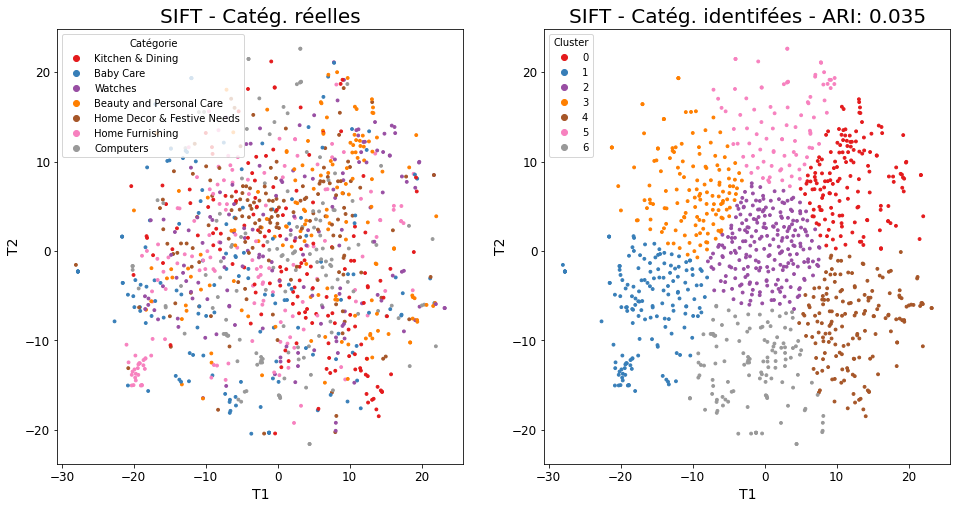

ARI : 0.0354


In [423]:
plt.rcParams['figure.figsize'] = [16, 8]
plt.rcParams['axes.titlesize'] = 20
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12

feature_extractor = 'SIFT'
TSNE_visu_fct(X_tsne, l_cat, y_cat_num2, labels, ARI, title_prefix=feature_extractor)

Le résultat est sérieusement mauvais. Après rebouclage avec le mentor, ce n'est pas anormal. 

## Analyse par classe

In [424]:
conf_mat = metrics.confusion_matrix(labels, cls.labels_)
print(conf_mat)
print()
print(metrics.classification_report(labels, cls.labels_))

[[  0 106   5   2  15   2  22]
 [ 11   1   3 129  10   3   0]
 [  6   7 128   1  17   3  63]
 [ 38   1  62  11  13   8   7]
 [ 17   6  12   3   8 111   7]
 [  3  38  12   0  13   1  21]
 [ 30   2  10  11  50  17   4]]

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       152
           1       0.01      0.01      0.01       157
           2       0.55      0.57      0.56       225
           3       0.07      0.08      0.07       140
           4       0.06      0.05      0.06       164
           5       0.01      0.01      0.01        88
           6       0.03      0.03      0.03       124

    accuracy                           0.15      1050
   macro avg       0.10      0.11      0.11      1050
weighted avg       0.14      0.15      0.14      1050



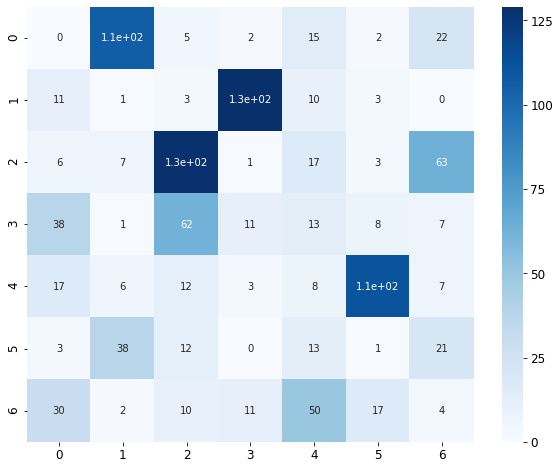

In [425]:
df_cm = pd.DataFrame(conf_mat, index = [label for label in list_labels],
                  columns = [str(i) for i in list_labels])
plt.figure(figsize = (10,8))
sns.heatmap(df_cm, annot=True, cmap="Blues")

Les résultats sont plutôt très mauvais.

# Images - Approche CNN + Transfer Learning

In [251]:
from keras.models import Sequential
# from keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.utils import load_img, img_to_array

In [252]:
def read_and_prep_images(img_paths, img_height, img_width, preprocess_input):
    imgs = [load_img(img_path, target_size=(img_height, img_width)) for img_path in img_paths]
    img_array = np.array([img_to_array(img) for img in imgs])
#     img_array = [image.reshape((1, image.shape[0], image.shape[1], image.shape[2])) for image in img_array]
    return preprocess_input(img_array)

## Tests sur une image

### Oxford's VGG-16

In [253]:
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input as preprocess_input_VGG16
from keras.applications.vgg16 import decode_predictions as decode_predictions_VGG16

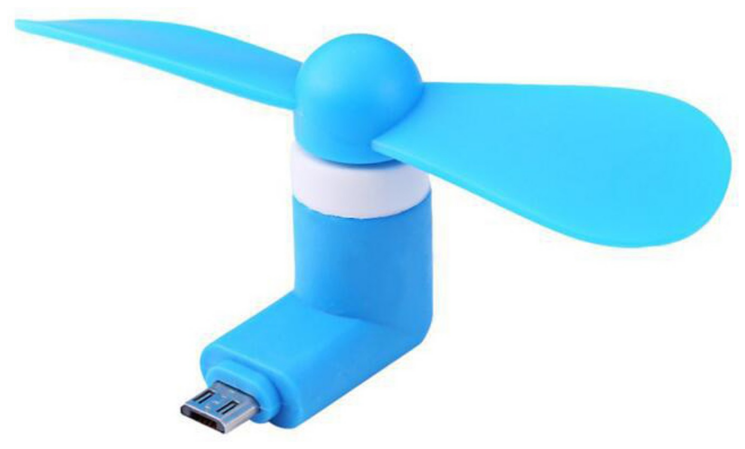

In [254]:
id = df_img.loc[53, 'image']
path_img1 = img_dir+f"{id}"
DisplotData.display_external_images([path_img1])

In [255]:
img1 = load_img(path_img1, target_size=(224, 224))  # Charger l'image
img1 = img_to_array(img1)  # Convertir en tableau numpy
img1 = img1.reshape((1, img1.shape[0], img1.shape[1], img1.shape[2]))  # Créer la collection d'images (un seul échantillon)
img1_16 = preprocess_input_VGG16(img1)  # Prétraiter l'image comme le veut VGG-16

In [256]:
path_img1

'./Dataset+projet+pretraitement+textes+images/Flipkart/Images/6329ddb46087cb8c09ced95471dd9643.jpg'

In [257]:
model_16 = VGG16() # Création du modèle VGG-16 implementé par Keras
y = model_16.predict(img1_16)  # Prédir la classe de l'image (parmi les 1000 classes d'ImageNet)

# Afficher les 3 classes les plus probables
print('Top 3 :', decode_predictions_VGG16(y, top=3)[0])

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
1/1 [==============================] - 0s 405ms/step
Top 3 : [('n03255030', 'dumbbell', 0.19429123), ('n04579432', 'whistle', 0.16359465), ('n03483316', 'hand_blower', 0.11570346)]


- `'dumbbell'` : haltère
- `'whistle'` : sifflet
- `'hand_blower'` : sèche-cheveux ?

<img src="dumbbell.png" />

Autre image :

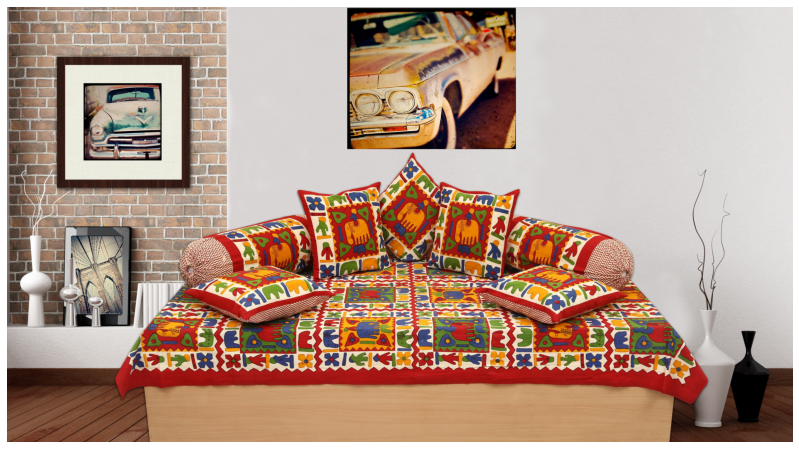

In [258]:
id = df_img.loc[78, 'image']
path_img2 = img_dir+f"{id}"
DisplotData.display_external_images([path_img2])

In [259]:
img2 = load_img(path_img2, target_size=(224, 224))  # Charger l'image
img2 = img_to_array(img2)  # Convertir en tableau numpy
img2 = img2.reshape((1, img2.shape[0], img2.shape[1], img2.shape[2]))
img2_16 = preprocess_input_VGG16(img2)  # Prétraiter l'image comme le veut VGG-16

In [260]:
y = model_16.predict(img2_16)  # Prédir la classe de l'image (parmi les 1000 classes d'ImageNet)

# Afficher les 3 classes les plus probables
print('Top 3 :', decode_predictions_VGG16(y, top=3)[0])

1/1 [==============================] - 0s 155ms/step
Top 3 : [('n04344873', 'studio_couch', 0.19602783), ('n03026506', 'Christmas_stocking', 0.15539588), ('n04429376', 'throne', 0.09412975)]


- `'studio_couch'` : canapé-studio 👍
- `'Christmas_stocking'` : collant de Noël 😆
- `'throne'` : c'est un jeu ?

### Google's InceptionV3

In [261]:
from keras.applications.inception_v3 import InceptionV3
from keras.applications.inception_v3 import preprocess_input as preprocess_input_InV3
from keras.applications.inception_v3 import decode_predictions as decode_predictions_InV3

In [262]:
img_size = 299
img1_3 = read_and_prep_images([path_img1], img_size, img_size, preprocess_input_InV3)
img2_3 = read_and_prep_images([path_img2], img_size, img_size, preprocess_input_InV3)

In [263]:
model_3 = InceptionV3()

In [264]:
y = model_3.predict(img1_3)  # Prédir la classe de l'image (parmi les 1000 classes d'ImageNet)

# Afficher les 3 classes les plus probables
print('Top 3 :', decode_predictions_InV3(y, top=3)[0])

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
1/1 [==============================] - 1s 1s/step
Top 3 : [('n02951585', 'can_opener', 0.20720781), ('n03255030', 'dumbbell', 0.0628163), ('n04127249', 'safety_pin', 0.030750765)]


- `can_opener` : ouvre-boîte (assez d'accord 😂)
- `dumbbell` : haltère (c'est fou ça)
- `safety_pin` : épingle à nourrice

In [265]:
y = model_3.predict(img2_3)  # Prédir la classe de l'image (parmi les 1000 classes d'ImageNet)

# Afficher les 3 classes les plus probables
print('Top 3 :', decode_predictions_InV3(y, top=3)[0])

1/1 [==============================] - 0s 103ms/step
Top 3 : [('n04033995', 'quilt', 0.6881944), ('n04344873', 'studio_couch', 0.079663716), ('n03938244', 'pillow', 0.017419597)]


- `quilt` : édredon, bien !
- `studio_couch` : aussi ! 
- `pillow` : mais oui !

### Microsoft's ResNet50

In [266]:
from keras.applications.resnet import ResNet50
from keras.applications.resnet import preprocess_input as preprocess_input_RN50
from keras.applications.resnet import decode_predictions as decode_predictions_RN50

In [267]:
img_size = 224
img1_50 = read_and_prep_images([path_img1], img_size, img_size, preprocess_input_RN50)
img2_50 = read_and_prep_images([path_img2], img_size, img_size, preprocess_input_RN50)

In [268]:
model_50 = ResNet50()

In [269]:
y = model_50.predict(img1_50)  # Prédir la classe de l'image (parmi les 1000 classes d'ImageNet)

# Afficher les 3 classes les plus probables
print('Top 3 :', decode_predictions_RN50(y, top=3)[0])

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
1/1 [==============================] - 1s 1s/step
Top 3 : [('n03532672', 'hook', 0.19143365), ('n03271574', 'electric_fan', 0.18516363), ('n03255030', 'dumbbell', 0.110617295)]


- `hook` : bizarre
- `electric_fan` : bravo !
- `dumbbell` : et ben.

<img src="hook-blue.jpg" />

In [270]:
y = model_50.predict(img2_50)  # Prédir la classe de l'image (parmi les 1000 classes d'ImageNet)

# Afficher les 3 classes les plus probables
print('Top 3 :', decode_predictions_RN50(y, top=3)[0])

1/1 [==============================] - 0s 144ms/step
Top 3 : [('n03938244', 'pillow', 0.28902853), ('n02699494', 'altar', 0.13209063), ('n04429376', 'throne', 0.09286143)]


- `pillow` : bien
- `altar` : autel, mouais
- `throne` : encore ?!

## Extraction des features

In [271]:
from keras.layers import Dense
from keras import Model

### Oxford's VGG-16

In [272]:
model = VGG16()

# remove the output layer
# model_VGG16 = Model(inputs=model.inputs, outputs=model.layers[-2].output) # Laisse 2 couches de FC !
# model_VGG16 = VGG16(weights="imagenet", include_top=False, input_shape=(224, 224, 3)) # Trop de dim de sortie
model_VGG16 = VGG16(weights="imagenet", include_top=False, input_shape=(224, 224, 3), pooling='avg')



In [273]:
model_VGG16.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_9 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

On préprocesse les images pour qu'elles correspondent aux dimensions attendues :

In [274]:
from os import listdir
import os

In [276]:
img_dir = '../data/images/'
img_paths = [os.path.join(img_dir,file) for file in df_img['image'].values]
y_cat_num = df_img['categs_1st_num'].values

On fixe la taille des images en entrée de VGG-16 à 224x224 :

In [278]:
img_size = 224
imgs = read_and_prep_images(img_paths, img_size, img_size, preprocess_input_VGG16)

c:\users\public\wpython\v_3.7.6\soft\python-3.7.6.amd64\lib\site-packages\PIL\Image.py:2731: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  DecompressionBombWarning,


On envoie nos images en entrée du modèle :

In [279]:
features_VGG16 = model_VGG16.predict(imgs)

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


33/33 [==============================] - 129s 4s/step


In [280]:
n_cat = len(np.unique(y_cat_num))
ARI, X_tsne, labels = ARI_fct(features_VGG16, y_cat_num, n_cat, perplexity=20, n_iter=3000)

ARI :  0.4299 time :  19.0


perplexity=20 donne de meilleurs résultats.

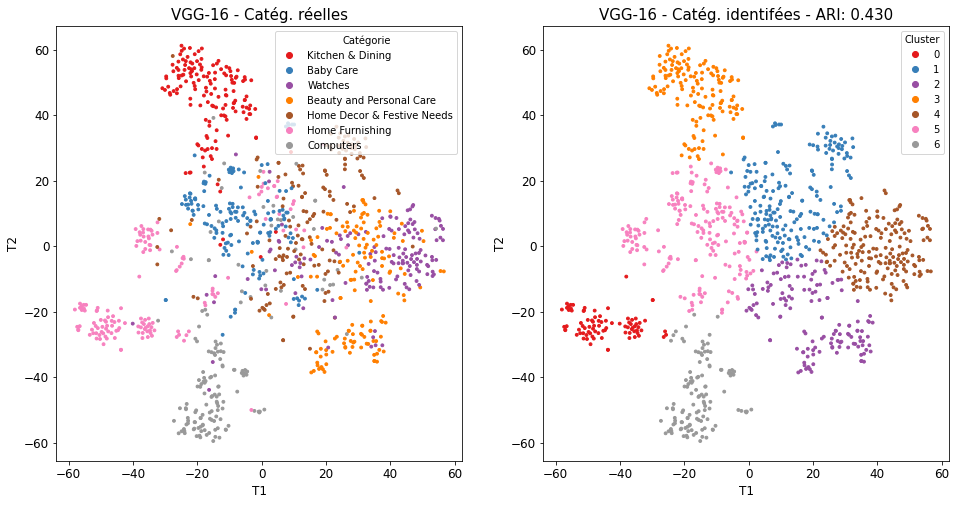

ARI : 0.4299


In [281]:
plt.rcParams['figure.figsize'] = [16, 8]
plt.rcParams['axes.titlesize'] = 15
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
feature_extractor = 'VGG-16'
TSNE_visu_fct(X_tsne, l_cat, y_cat_num, labels, ARI, title_prefix=feature_extractor)

In [282]:
feat_extractor = 'VGG-16'

In [283]:
# Création des planches d'images
lc = 'label_'+feat_extractor
image_col = 'image'
df_tk[lc] = labels
create_output_images(df_tk, lc, image_col, feat_extractor, verbose=1)

Création des images correspondant aux clusters...
Cluster 0 : 84 produits
Cluster 1 : 197 produits
Cluster 2 : 141 produits
Cluster 3 : 143 produits
Cluster 4 : 180 produits
Cluster 5 : 188 produits


c:\users\public\wpython\v_3.7.6\soft\python-3.7.6.amd64\lib\site-packages\PIL\Image.py:2731: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  DecompressionBombWarning,


Cluster 6 : 117 produits


### Google's InceptionV3

In [284]:
# load model
model = InceptionV3()
model_InV3 = Model(inputs=model.inputs, outputs=model.layers[-2].output)

# summarize the model
model_InV3.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_10 (InputLayer)          [(None, 299, 299, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_94 (Conv2D)             (None, 149, 149, 32  864         ['input_10[0][0]']               
                                )                                                                 
                                                                                                  
 batch_normalization_94 (BatchN  (None, 149, 149, 32  96         ['conv2d_94[0][0]']              
 ormalization)                  )                                                           

 batch_normalization_99 (BatchN  (None, 35, 35, 64)  192         ['conv2d_99[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 batch_normalization_101 (Batch  (None, 35, 35, 64)  192         ['conv2d_101[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 batch_normalization_104 (Batch  (None, 35, 35, 96)  288         ['conv2d_104[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 batch_normalization_105 (Batch  (None, 35, 35, 32)  96          ['conv2d_105[0][0]']             
 Normaliza

                                                                                                  
 batch_normalization_116 (Batch  (None, 35, 35, 64)  192         ['conv2d_116[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_116 (Activation)    (None, 35, 35, 64)   0           ['batch_normalization_116[0][0]']
                                                                                                  
 conv2d_114 (Conv2D)            (None, 35, 35, 48)   13824       ['mixed1[0][0]']                 
                                                                                                  
 conv2d_117 (Conv2D)            (None, 35, 35, 96)   55296       ['activation_116[0][0]']         
                                                                                                  
 batch_nor

                                                                                                  
 max_pooling2d_6 (MaxPooling2D)  (None, 17, 17, 288)  0          ['mixed2[0][0]']                 
                                                                                                  
 mixed3 (Concatenate)           (None, 17, 17, 768)  0           ['activation_120[0][0]',         
                                                                  'activation_123[0][0]',         
                                                                  'max_pooling2d_6[0][0]']        
                                                                                                  
 conv2d_128 (Conv2D)            (None, 17, 17, 128)  98304       ['mixed3[0][0]']                 
                                                                                                  
 batch_normalization_128 (Batch  (None, 17, 17, 128)  384        ['conv2d_128[0][0]']             
 Normaliza

                                                                  'activation_133[0][0]']         
                                                                                                  
 conv2d_138 (Conv2D)            (None, 17, 17, 160)  122880      ['mixed4[0][0]']                 
                                                                                                  
 batch_normalization_138 (Batch  (None, 17, 17, 160)  480        ['conv2d_138[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_138 (Activation)    (None, 17, 17, 160)  0           ['batch_normalization_138[0][0]']
                                                                                                  
 conv2d_139 (Conv2D)            (None, 17, 17, 160)  179200      ['activation_138[0][0]']         
          

 Normalization)                                                                                   
                                                                                                  
 activation_148 (Activation)    (None, 17, 17, 160)  0           ['batch_normalization_148[0][0]']
                                                                                                  
 conv2d_149 (Conv2D)            (None, 17, 17, 160)  179200      ['activation_148[0][0]']         
                                                                                                  
 batch_normalization_149 (Batch  (None, 17, 17, 160)  480        ['conv2d_149[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_149 (Activation)    (None, 17, 17, 160)  0           ['batch_normalization_149[0][0]']
          

                                                                                                  
 batch_normalization_159 (Batch  (None, 17, 17, 192)  576        ['conv2d_159[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_159 (Activation)    (None, 17, 17, 192)  0           ['batch_normalization_159[0][0]']
                                                                                                  
 conv2d_155 (Conv2D)            (None, 17, 17, 192)  147456      ['mixed6[0][0]']                 
                                                                                                  
 conv2d_160 (Conv2D)            (None, 17, 17, 192)  258048      ['activation_159[0][0]']         
                                                                                                  
 batch_nor

                                                                                                  
 conv2d_164 (Conv2D)            (None, 17, 17, 192)  147456      ['mixed7[0][0]']                 
                                                                                                  
 conv2d_168 (Conv2D)            (None, 17, 17, 192)  258048      ['activation_167[0][0]']         
                                                                                                  
 batch_normalization_164 (Batch  (None, 17, 17, 192)  576        ['conv2d_164[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 batch_normalization_168 (Batch  (None, 17, 17, 192)  576        ['conv2d_168[0][0]']             
 Normalization)                                                                                   
          

 batch_normalization_170 (Batch  (None, 8, 8, 320)   960         ['conv2d_170[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_172 (Activation)    (None, 8, 8, 384)    0           ['batch_normalization_172[0][0]']
                                                                                                  
 activation_173 (Activation)    (None, 8, 8, 384)    0           ['batch_normalization_173[0][0]']
                                                                                                  
 activation_176 (Activation)    (None, 8, 8, 384)    0           ['batch_normalization_176[0][0]']
                                                                                                  
 activation_177 (Activation)    (None, 8, 8, 384)    0           ['batch_normalization_177[0][0]']
          

                                                                                                  
 activation_185 (Activation)    (None, 8, 8, 384)    0           ['batch_normalization_185[0][0]']
                                                                                                  
 activation_186 (Activation)    (None, 8, 8, 384)    0           ['batch_normalization_186[0][0]']
                                                                                                  
 batch_normalization_187 (Batch  (None, 8, 8, 192)   576         ['conv2d_187[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_179 (Activation)    (None, 8, 8, 320)    0           ['batch_normalization_179[0][0]']
                                                                                                  
 mixed9_1 

Mazette.

On fixe la taille des images en entrée de InceptionV3 à 299x299 :

In [285]:
img_size = 299
imgs = read_and_prep_images(img_paths, img_size, img_size, preprocess_input_InV3)

On envoie nos images en entrée du modèle :

In [286]:
features_InV3 = model_InV3.predict(imgs)

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
33/33 [==============================] - 71s 2s/step


In [287]:
n_cat = len(np.unique(y_cat_num))
ARI, X_tsne, labels = ARI_fct(features_InV3, y_cat_num, n_cat, perplexity=25, n_iter=2000)

ARI :  0.5608 time :  14.0


perplexity=25, n_iter=2000 donnent de meilleurs résultats.

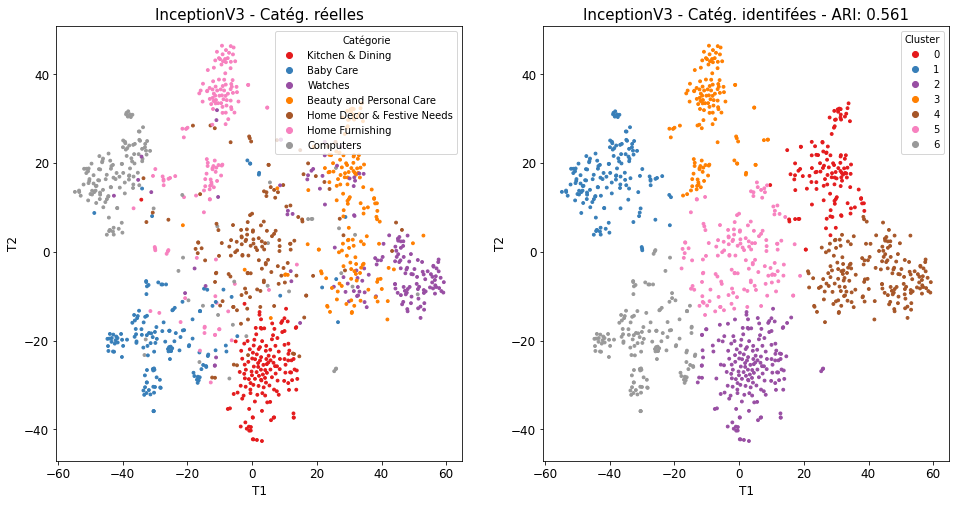

ARI : 0.5608


In [288]:
plt.rcParams['figure.figsize'] = [16, 8]
plt.rcParams['axes.titlesize'] = 15
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
feature_extractor = 'InceptionV3'
TSNE_visu_fct(X_tsne, l_cat, y_cat_num, labels, ARI, title_prefix=feature_extractor)

In [289]:
feature_extractor = 'InceptionV3'

In [290]:
# Création des planches d'images
lc = 'label_'+feature_extractor
image_col = 'image'
df_tk[lc] = labels
create_output_images(df_tk, lc, image_col, feat_extractor, verbose=1)

Création des images correspondant aux clusters...
Cluster 0 : 122 produits
Cluster 1 : 148 produits


c:\users\public\wpython\v_3.7.6\soft\python-3.7.6.amd64\lib\site-packages\PIL\Image.py:2731: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  DecompressionBombWarning,


Cluster 2 : 180 produits
Cluster 3 : 128 produits
Cluster 4 : 179 produits
Cluster 5 : 147 produits
Cluster 6 : 146 produits


### Microsoft's ResNet50

In [291]:
# load model
model = ResNet50()
model_RN50 = Model(inputs=model.inputs, outputs=model.layers[-2].output)

# summarize the model
model_RN50.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_11 (InputLayer)          [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_11[0][0]']               
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                            

                                                                                                  
 conv2_block3_1_relu (Activatio  (None, 56, 56, 64)  0           ['conv2_block3_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv2_block3_2_conv (Conv2D)   (None, 56, 56, 64)   36928       ['conv2_block3_1_relu[0][0]']    
                                                                                                  
 conv2_block3_2_bn (BatchNormal  (None, 56, 56, 64)  256         ['conv2_block3_2_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv2_block3_2_relu (Activatio  (None, 56, 56, 64)  0           ['conv2_block3_2_bn[0][0]']      
 n)       

                                                                                                  
 conv3_block3_1_relu (Activatio  (None, 28, 28, 128)  0          ['conv3_block3_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv3_block3_2_conv (Conv2D)   (None, 28, 28, 128)  147584      ['conv3_block3_1_relu[0][0]']    
                                                                                                  
 conv3_block3_2_bn (BatchNormal  (None, 28, 28, 128)  512        ['conv3_block3_2_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv3_block3_2_relu (Activatio  (None, 28, 28, 128)  0          ['conv3_block3_2_bn[0][0]']      
 n)       

                                                                                                  
 conv4_block2_1_bn (BatchNormal  (None, 14, 14, 256)  1024       ['conv4_block2_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block2_1_relu (Activatio  (None, 14, 14, 256)  0          ['conv4_block2_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_block2_2_conv (Conv2D)   (None, 14, 14, 256)  590080      ['conv4_block2_1_relu[0][0]']    
                                                                                                  
 conv4_block2_2_bn (BatchNormal  (None, 14, 14, 256)  1024       ['conv4_block2_2_conv[0][0]']    
 ization) 

 conv4_block5_1_conv (Conv2D)   (None, 14, 14, 256)  262400      ['conv4_block4_out[0][0]']       
                                                                                                  
 conv4_block5_1_bn (BatchNormal  (None, 14, 14, 256)  1024       ['conv4_block5_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block5_1_relu (Activatio  (None, 14, 14, 256)  0          ['conv4_block5_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_block5_2_conv (Conv2D)   (None, 14, 14, 256)  590080      ['conv4_block5_1_relu[0][0]']    
                                                                                                  
 conv4_blo

                                                                  'conv5_block1_3_bn[0][0]']      
                                                                                                  
 conv5_block1_out (Activation)  (None, 7, 7, 2048)   0           ['conv5_block1_add[0][0]']       
                                                                                                  
 conv5_block2_1_conv (Conv2D)   (None, 7, 7, 512)    1049088     ['conv5_block1_out[0][0]']       
                                                                                                  
 conv5_block2_1_bn (BatchNormal  (None, 7, 7, 512)   2048        ['conv5_block2_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv5_block2_1_relu (Activatio  (None, 7, 7, 512)   0           ['conv5_block2_1_bn[0][0]']      
 n)       

On fixe la taille des images en entrée de ResNet50 à 224x224 :

In [292]:
img_size = 224
imgs = read_and_prep_images(img_paths, img_size, img_size, preprocess_input_RN50)

On envoie nos images en entrée du modèle :

In [293]:
features_RN50 = model_RN50.predict(imgs)

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
33/33 [==============================] - 67s 2s/step


In [294]:
n_cat = len(np.unique(y_cat_num))
ARI, X_tsne, labels = ARI_fct(features_RN50, y_cat_num, n_cat, perplexity=25, n_iter=2000)

ARI :  0.5372 time :  10.0


perplexity=25, n_iter=2000 donnent de meilleurs résultats.

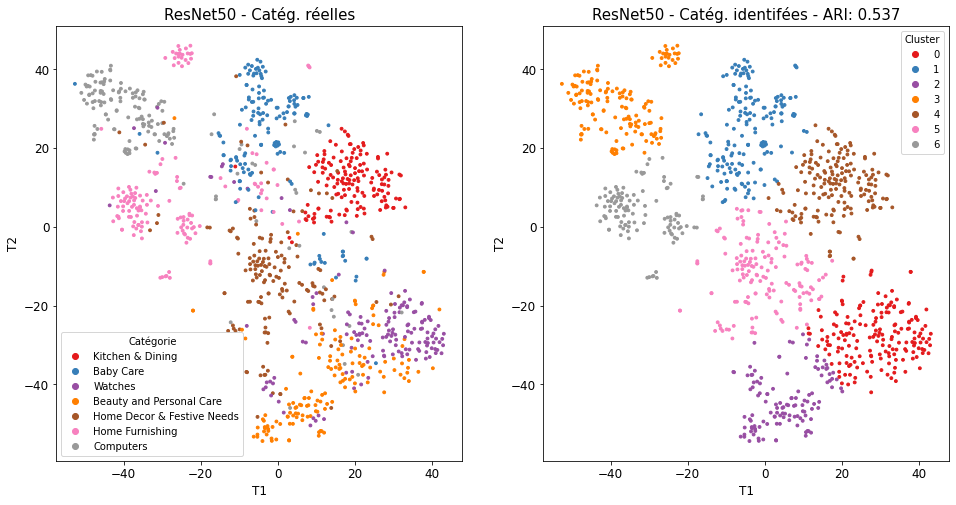

ARI : 0.5372


In [295]:
plt.rcParams['figure.figsize'] = [16, 8]
plt.rcParams['axes.titlesize'] = 15
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
feature_extractor = 'ResNet50'
TSNE_visu_fct(X_tsne, l_cat, y_cat_num, labels, ARI, title_prefix=feature_extractor)

In [296]:
feature_extractor = 'ResNet50'

In [297]:
# Création des planches d'images
lc = 'label_'+feature_extractor
image_col = 'image'
df_tk[lc] = labels
create_output_images(df_tk, lc, image_col, feat_extractor, verbose=1)

Création des images correspondant aux clusters...
Cluster 0 : 179 produits
Cluster 1 : 169 produits


c:\users\public\wpython\v_3.7.6\soft\python-3.7.6.amd64\lib\site-packages\PIL\Image.py:2731: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  DecompressionBombWarning,


Cluster 2 : 120 produits
Cluster 3 : 150 produits
Cluster 4 : 172 produits
Cluster 5 : 149 produits
Cluster 6 : 111 produits


In [299]:
%store features_VGG16
%store features_InV3
%store features_RN50

Stored 'features_VGG16' (ndarray)
Stored 'features_InV3' (ndarray)
Stored 'features_RN50' (ndarray)


## Transfer Learning

In [298]:
REBUILD_MODELS = False

On remplace maintenant les couches Fully Connected pour classifier notre jeu de données de manière supervisée.

In [300]:
epochs = 100 # 500
batch_size = 32

### Oxford's VGG-16

In [301]:
img_size = 224
imgs = read_and_prep_images(img_paths, img_size, img_size, preprocess_input_VGG16)

In [303]:
X_enc = imgs
y_enc = df_img['categs_1st_num']

In [304]:
# Split train/test
X_train, X_test, y_train, y_test = train_test_split(X_enc, y_enc, test_size=0.2, random_state=18011975)

In [305]:
y_train_enc = tf.keras.utils.to_categorical(y_train)
y_test_enc = tf.keras.utils.to_categorical(y_test)

In [306]:
from keras import optimizers
from tensorflow.keras.callbacks import EarlyStopping

#### Création du modèle

In [ ]:
# Instanciation du modèle public 
# model_VGG16 = VGG16(weights="imagenet", include_top=False, input_shape=(224, 224, 3), pooling='avg')
# model_VGG16 = VGG16(weights="imagenet", include_top=False, input_shape=(224, 224, 3))
# model_VGG16 = VGG16(weights="imagenet", include_top=False, input_shape=(224, 224, 3), classes=n_class)
# model_VGG16 = VGG16(weights="imagenet", input_shape=(224, 224, 3))
model = VGG16(weights="imagenet", input_shape=(224, 224, 3))
model_VGG16 = Model(inputs=model.inputs, outputs=model.layers[-2].output)
model_VGG16.summary()

# Récupération la sortie de ce réseau
x = model_VGG16.output

predictions = Dense(n_class, activation='softmax')(x)

# Ajout de la nouvelle couche
my_model_VGG16 = Model(inputs=model_VGG16.input, outputs=predictions)
my_model_VGG16.summary()

# Fine tuning : on n'entraîne que la dernière couche :
for layer in my_model_VGG16.layers[:-1]:
    layer.trainable = False
my_model_VGG16.layers[-1].trainable = True

# Compilation du modèle 
my_model_VGG16.compile(loss="categorical_crossentropy", 
                       optimizer=optimizers.SGD(learning_rate=0.0001, momentum=0.9),
                       metrics=["accuracy"])
early_stopping = EarlyStopping(monitor='val_accuracy',
                               patience=8,
                               min_delta=0.001,
                               mode='max')

# Entraîner sur les données d'entraînement
model_info_VGG16 = my_model_VGG16.fit(X_train, y_train_enc,
                                      epochs=epochs,
                                      batch_size=batch_size,
                                      validation_split=0.2,
                                      callbacks=[early_stopping],
                                      verbose=2)


#### Evaluation du modèle

In [ ]:
_, train_acc = my_model_VGG16.evaluate(X_train, y_train_enc, verbose=0)
_, test_acc = my_model_VGG16.evaluate(X_test, y_test_enc, verbose=0)
print(f"Train : {train_acc:.4f}, Test : {test_acc:.4f}")

#### Sauvegarde du modèle 

In [ ]:
timestamp = datetime.datetime.now().strftime('%Y%m%d_%H%M%S')
with open(f'my_model_VGG16_{train_acc:.2f}_{test_acc:.2f}_{timestamp}.pkl', 'wb') as output:
    pickle.dump(my_model_VGG16, output, pickle.HIGHEST_PROTOCOL)

In [ ]:
%store my_model_VGG16

### Google's InceptionV3

In [312]:
img_size = 299
imgs_InV3 = read_and_prep_images(img_paths, img_size, img_size, preprocess_input_InV3)

c:\users\public\wpython\v_3.7.6\soft\python-3.7.6.amd64\lib\site-packages\PIL\Image.py:2731: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  DecompressionBombWarning,


In [313]:
X_enc = imgs_InV3
y_enc = df_img['categs_1st_num']

In [314]:
# Split train/test
X_train, X_test, y_train, y_test = train_test_split(X_enc, y_enc, test_size=0.2, random_state=18011975)

In [315]:
y_train_enc = tf.keras.utils.to_categorical(y_train)
y_test_enc = tf.keras.utils.to_categorical(y_test)

#### Création du modèle

In [ ]:
# Instanciation du modèle public 
model = InceptionV3()
model_InV3 = Model(inputs=model.inputs, outputs=model.layers[-2].output)

# Récupération la sortie de ce réseau
x = model_InV3.output
predictions = Dense(n_class, activation='softmax')(x)

# Ajout de la nouvelle couche
my_model_InV3 = Model(inputs=model_InV3.input, outputs=predictions)

# Fine tuning : on n'entraîne que la dernière couche :
for layer in my_model_InV3.layers[:-1]:
    layer.trainable = False
my_model_InV3.layers[-1].trainable = True

my_model_InV3.summary()

# Compilation du modèle 
my_model_InV3.compile(loss="categorical_crossentropy", 
                      optimizer=optimizers.SGD(learning_rate=0.0001, momentum=0.9),
                      metrics=["accuracy"])
early_stopping = EarlyStopping(monitor='val_accuracy',
                               patience=2,
                               min_delta=0.001,
                               mode='max')

# Entraîner sur les données d'entraînement
model_info_InV3 = my_model_InV3.fit(X_train, y_train_enc,
                                    epochs=epochs,
                                    batch_size=batch_size,
                                    validation_split=0.2,
                                    callbacks=[early_stopping],
                                    verbose=2)

#### Evaluation du modèle

In [ ]:
_, train_acc = my_model_InV3.evaluate(X_train, y_train_enc, verbose=0)
_, test_acc = my_model_InV3.evaluate(X_test, y_test_enc, verbose=0)
print(f"Train : {train_acc:.4f}, Test : {test_acc:.4f}")

#### Sauvegarde du modèle 

In [ ]:
timestamp = datetime.datetime.now().strftime('%Y%m%d_%H%M%S')
with open(f'my_model_InV3_{train_acc:.2f}_{test_acc:.2f}_{timestamp}.pkl', 'wb') as output:
    pickle.dump(my_model_InV3, output, pickle.HIGHEST_PROTOCOL)

In [ ]:
%store my_model_InV3

### Microsoft's ResNet50

In [ ]:
img_size = 224
imgs_RN50 = read_and_prep_images(img_paths, img_size, img_size, preprocess_input_RN50)

In [ ]:
X_enc = imgs_RN50
y_enc = df_img['categs_1st_num']

In [ ]:
# Split train/test
X_train, X_test, y_train, y_test = train_test_split(X_enc, y_enc, test_size=0.2, random_state=18011975)

In [ ]:
y_train_enc = tf.keras.utils.to_categorical(y_train)
y_test_enc = tf.keras.utils.to_categorical(y_test)

#### Création du modèle

In [ ]:
# Instanciation du modèle public 
model = ResNet50()
model_RN50 = Model(inputs=model.inputs, outputs=model.layers[-2].output)

# Récupération la sortie de ce réseau
x = model_RN50.output
predictions = Dense(n_class, activation='softmax')(x)

# Ajout de la nouvelle couche
my_model_RN50 = Model(inputs=model_RN50.input, outputs=predictions)

# Fine tuning : on n'entraîne que la dernière couche :
for layer in my_model_RN50.layers[:-1]:
    layer.trainable = False
my_model_RN50.layers[-1].trainable = True

# Compilation du modèle 
my_model_RN50.compile(loss="categorical_crossentropy", 
                      optimizer=optimizers.SGD(learning_rate=0.0001, momentum=0.9),
                      metrics=["accuracy"])
    early_stopping = EarlyStopping(monitor='val_accuracy',
                                   patience=2,
                                   min_delta=0.001,
                                   mode='max')

# Entraîner sur les données d'entraînement
model_info_RN50 = my_model_RN50.fit(X_train, y_train_enc,
                                    epochs=epochs,
                                    batch_size=batch_size,
                                    validation_split=0.2,
#                                     callbacks=[early_stopping],
                                    verbose=2)

In [ ]:
my_model_RN50.summary()

#### Evaluation du modèle

In [ ]:
_, train_acc = my_model_RN50.evaluate(X_train, y_train_enc, verbose=0)
_, test_acc = my_model_RN50.evaluate(X_test, y_test_enc, verbose=0)
print(f"Train : {train_acc:.4f}, Test : {test_acc:.4f}")

#### Sauvegarde du modèle 

In [ ]:
timestamp = datetime.datetime.now().strftime('%Y%m%d_%H%M%S')
with open(f'my_model_RN50_{train_acc:.2f}_{test_acc:.2f}_{timestamp}.pkl', 'wb') as output:
    pickle.dump(my_model_RN50, output, pickle.HIGHEST_PROTOCOL)

In [ ]:
%store my_model_RN50

# Vision Transformers (ViT)

In [318]:
model_name = "google/vit-base-patch16-224-in21k"
prep = transformers.AutoFeatureExtractor.from_pretrained(model_name)
vit = transformers.TFAutoModel.from_pretrained(model_name)

All model checkpoint layers were used when initializing TFViTModel.

All the layers of TFViTModel were initialized from the model checkpoint at google/vit-base-patch16-224-in21k.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFViTModel for predictions without further training.


In [319]:
X_enc = imgs
y_enc = df_img['categs_1st_num']

In [320]:
# Split train/test
X_train, X_test, y_train, y_test = train_test_split(X_enc, y_enc, test_size=0.2, random_state=18011975)

In [321]:
# Preprocess 
X_train_vit = np.array([prep(img)["pixel_values"][0] for img in X_train])
X_test_vit = np.array([prep(img)["pixel_values"][0] for img in X_test])

print(X_train_vit[0].shape)

(3, 224, 224)


In [322]:
y_train_enc = tf.keras.utils.to_categorical(y_train)
y_test_enc = tf.keras.utils.to_categorical(y_test)

In [323]:
from tensorflow.keras import models, layers

In [ ]:
# Model
x_in = layers.Input(name="x_in", shape=(3,224,224))
vit_out = vit(x_in)[0][:,0,:]
y_out = layers.Dense(name="y_out", units=n_class, 
                     activation="softmax")(vit_out)

my_model_ViT = models.Model(inputs=x_in, outputs=y_out, name="ViT")
my_model_ViT.compile(loss="sparse_categorical_crossentropy", 
                     optimizer="adam", metrics=["accuracy"])
my_model_ViT.summary()

model_info_ViT = my_model_ViT.fit(X_train_vit, y_train,
                                  epochs=epochs,
                                  batch_size=batch_size,
                                  validation_split=0.2,
                                  # callbacks=[early_stopping],
                                  verbose=2)


#### Evaluation du modèle

In [ ]:
_, train_acc = my_model_ViT.evaluate(X_train_vit, y_train, verbose=0)
_, test_acc = my_model_ViT.evaluate(X_test_vit, y_test, verbose=0)
print(f"Train : {train_acc:.4f}, Test : {test_acc:.4f}")

J'ai dû faire une erreur de copier-coller, les résultats ne sont pas concluants.

Autre tentative :

In [ ]:
features_ViT = vit.predict(imgs)

In [ ]:
n_cat = len(np.unique(y_cat_num))
ARI, X_tsne, labels = ARI_fct(features_ViT, y_cat_num, n_cat, perplexity=20, n_iter=3000)

#### Sauvegarde du modèle 

In [ ]:
timestamp = datetime.datetime.now().strftime('%Y%m%d_%H%M%S')
with open(f'my_model_ViT_{train_acc:.2f}_{test_acc:.2f}_{timestamp}.pkl', 'wb') as output:
    pickle.dump(my_model_ViT, output, pickle.HIGHEST_PROTOCOL)

#### Depuis Huggingface

In [ ]:
from transformers import ViTFeatureExtractor, TFViTModel
from datasets import load_dataset

In [ ]:
imgs = [Image.open(im) for im in img_paths]

In [ ]:
feature_extractor = ViTFeatureExtractor.from_pretrained("google/vit-base-patch16-224-in21k")
model = TFViTModel.from_pretrained("google/vit-base-patch16-224-in21k")
# inputs = feature_extractor(imgs, return_tensors="tf")
inputs = feature_extractor(imgs, return_tensors='np')

In [ ]:
features_ViT = inputs['pixel_values']

In [ ]:
features_ViT.shape

In [ ]:
features_ViT = features_ViT.reshape(1050, features_ViT.shape[1]*features_ViT.shape[2]*features_ViT.shape[3])

In [ ]:
n_cat = len(np.unique(y_cat_num))
ARI, X_tsne, labels = ARI_fct(features_ViT, y_cat_num, n_cat, perplexity=25, n_iter=2000)

In [ ]:
plt.rcParams['figure.figsize'] = [16, 8]
plt.rcParams['axes.titlesize'] = 15
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
feature_extractor = 'ViT'
TSNE_visu_fct(X_tsne, l_cat, y_cat_num, labels, ARI, title_prefix=feature_extractor)

<img src="BandeauDonneesTextuellesEtVisuelles.png" />

# Textes+images - All together

## Récupération du meilleur embedding de la partie texte

In [325]:
%store -r best_embeddings

## Réunion des matrices complètes des features textes et images

In [326]:
# Réunion des matrices

In [327]:
best_embeddings.min(), best_embeddings.max()

(0.0, 1.0)

In [328]:
features_InV3.min(), features_InV3.max()

(0.0, 8.651998)

In [329]:
best_embeddings.shape

(1050, 3851)

In [330]:
features_InV3.shape

(1050, 2048)

In [331]:
X = np.hstack((best_embeddings, features_InV3))

In [332]:
X.min(), X.max()

(0.0, 8.651997566223145)

In [333]:
X_sc = MinMaxScaler().fit_transform(X)

In [334]:
n_cat = len(np.unique(y_cat_num))
# for perplexity in [10, 15, 20, 25, 30, 40, 50]:
#     print(f"perplexity = {perplexity}:")
#     ARI, X_tsne, labels = ARI_fct(X, y_cat_num, n_cat, perplexity=perplexity, n_iter=3000)
ARI, X_tsne, labels = ARI_fct(X_sc, y_cat_num, n_cat, perplexity=30, n_iter=3000)

ARI :  0.591 time :  10.0


perplexity=30 donne de meilleurs résultats.

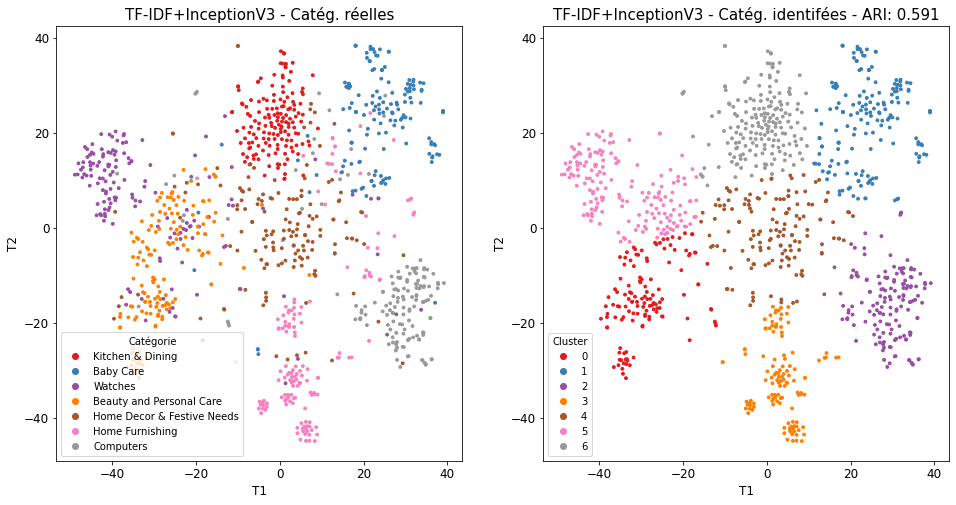

ARI : 0.5910


In [335]:
plt.rcParams['figure.figsize'] = [16, 8]
plt.rcParams['axes.titlesize'] = 15
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
# y_cat = df_img['categs_1st'].values
feature_extractor = 'TF-IDF+InceptionV3'
TSNE_visu_fct(X_tsne, l_cat, y_cat_num, labels, ARI, title_prefix=feature_extractor)

Mais cette concaténation peut favoriser la partie texte, car elle possède 2 fois plus de dimensions. Les distances euclidiennes auront plus de contribution dans l'espace des textes. Voyons ce que donne de concaténer les 2x2 dimensions des t-SNE.  

## Clustering de l'union des 2 t-SNE

ARI :  0.5109 time :  9.0
ARI :  0.5645 time :  15.0
ARI :  0.4662 time :  11.0


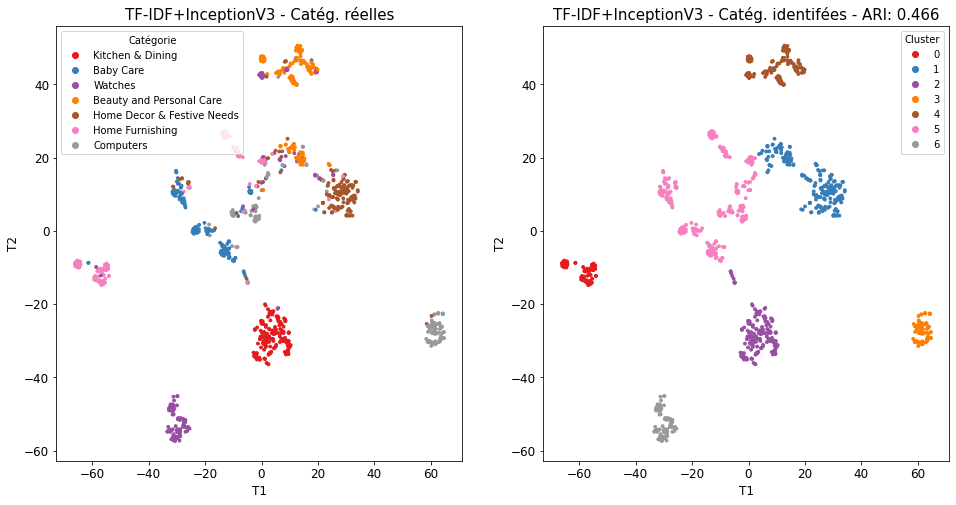

ARI : 0.4662


In [336]:
n_cat = len(np.unique(y_cat_num))
ARI, X_tsne_txt, labels = ARI_fct(best_embeddings, y_cat_num, n_cat, perplexity=30, n_iter=3000)
ARI, X_tsne_img, labels = ARI_fct(features_InV3, y_cat_num, n_cat, perplexity=30, n_iter=3000)
X = np.hstack((X_tsne_txt, X_tsne_img))
ARI, X_tsne_all, labels = ARI_fct(X, y_cat_num, n_cat, perplexity=30, n_iter=3000)

plt.rcParams['figure.figsize'] = [16, 8]
plt.rcParams['axes.titlesize'] = 15
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
# y_cat = df_img['categs_1st'].values
feature_extractor = 'TF-IDF+InceptionV3'
TSNE_visu_fct(X_tsne_all, l_cat, y_cat_num, labels, ARI, title_prefix=feature_extractor)

In [337]:
best_mix = 'TF-IDF+InceptionV3'

In [338]:
# Création des planches d'images
lc = 'label_'+best_mix
image_col = 'image'
df_tk[lc] = labels
create_output_images(df_tk, lc, image_col, best_mix, verbose=1)

Création des images correspondant aux clusters...
Cluster 0 : 78 produits
Cluster 1 : 208 produits
Cluster 2 : 166 produits
Cluster 3 : 79 produits
Cluster 4 : 138 produits
Cluster 5 : 295 produits


c:\users\public\wpython\v_3.7.6\soft\python-3.7.6.amd64\lib\site-packages\PIL\Image.py:2731: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  DecompressionBombWarning,


Cluster 6 : 86 produits


Le mix est moins performant que le TF-IDF seul. C'est dommage.

## Equilibrage des features

In [339]:
best_embeddings.shape, features_InV3.shape 

((1050, 3851), (1050, 2048))

On réduit la dimension des features textuelles pour l'équilibrer avec les features visuelles, avec une PCA. Mais on doit spécifier une dimension au plus égales au nombre de samples :

In [340]:
n_samples = best_embeddings.shape[0]

In [383]:
pca = decomposition.PCA(n_components=n_samples) # features_InV3.shape[1]
# best_embeddings_reduc = pca.fit_transform(best_embeddings)
best_embeddings_sc = MinMaxScaler().fit_transform(best_embeddings)
best_embeddings_reduc = pca.fit_transform(best_embeddings_sc)

pca = decomposition.PCA(n_components=n_samples) # features_InV3.shape[1]
# features_InV3_reduc = pca.fit_transform(features_InV3)
features_InV3_sc = MinMaxScaler().fit_transform(features_InV3)
features_InV3_reduc = pca.fit_transform(features_InV3_sc)

ARI :  0.5689 time :  30.0


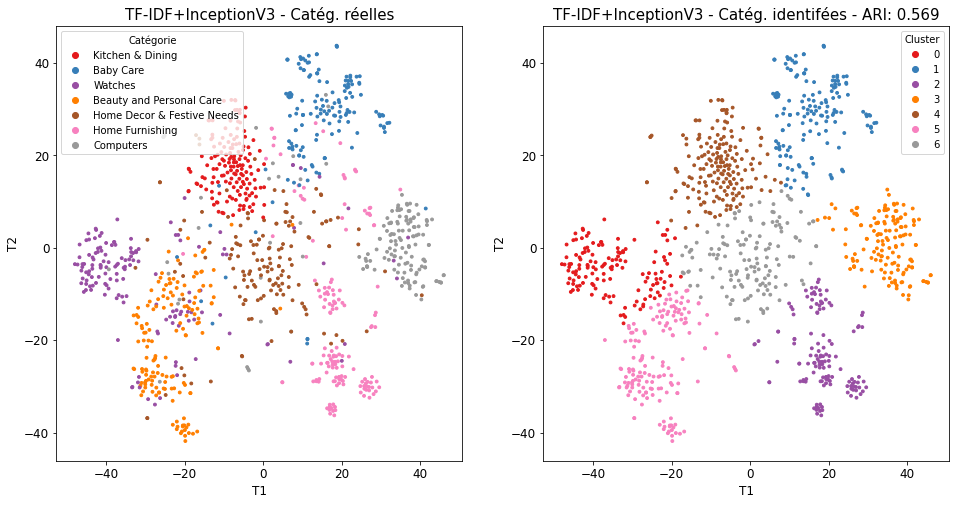

ARI : 0.5689


In [384]:
n_cat = len(np.unique(y_cat_num))
X = np.hstack((best_embeddings_reduc, features_InV3_reduc))
ARI, X_tsne_all, labels = ARI_fct(X, y_cat_num, n_cat, perplexity=30, n_iter=3000)
# X_sc = scMinMaxScaler()aler.fit_transform(X)
# ARI, X_tsne_all, labels = ARI_fct(X_sc, y_cat_num, n_cat, perplexity=30, n_iter=3000)

plt.rcParams['figure.figsize'] = [16, 8]
plt.rcParams['axes.titlesize'] = 15
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
# y_cat = df_img['categs_1st'].values
feature_extractor = 'TF-IDF+InceptionV3'
TSNE_visu_fct(X_tsne_all, l_cat, y_cat_num, labels, ARI, title_prefix=feature_extractor)

Résultats moins bons que la meilleure classification non supervisée par le texte (0.63), ou sans équilibrage des 2 matrices (0.58).

## Classification supervisée

On vérifie si une classification supervisée donne de meilleurs résultats que le clustering, dont le score ARI est peut-être dépendant de catégories un peu trop larges.

In [386]:
y_enc = df_tk['categs_1st_num']
s = 0.
for embeddings, name in [
                         [df_em_1gram, 'df_em_1gram'],
                         [df_tfidf_1gram, 'df_tfidf_1gram'],
                         [embeddings_word2vec, 'embeddings_word2vec'],
                         [embeddings_glove, 'embeddings_glove'],
                         [features_bert, 'features_bert'],
                         [features_bert_hub, 'features_bert_hub'],
                         [features_USE, 'features_USE'],
                         ]:
    print(bcolors.BOLD+name+'\n'+'-'*len(name)+bcolors.ENDC)
    X = np.hstack((embeddings, features_InV3))
    X_sc = MinMaxScaler().fit_transform(X)

    # Split train/test
    X_train, X_test, y_train, y_test = train_test_split(X_sc, y_enc, test_size=0.2, random_state=18011975)  # 18011975 , stratify=y_enc

    time1 = time.time()
    mdl = GridSearchCV(
#                        XGBClassifier(), param_grid_xgbc,
                       RandomForestClassifier(), param_grid_rfc,
                       cv=5,
                       scoring='accuracy'
                       )
    mdl.fit(X_train, y_train)
    main_score_val = mdl.cv_results_['mean_test_score'].max()
    print(f"main_score_val = {main_score_val:.4f}")
    print(f"best_params_ = {mdl.best_params_}")
    
    y_test_pred = mdl.best_estimator_.predict(X_test)
    time2 = time.time() - time1
    s_old = s
    s = metrics.accuracy_score(y_test, y_test_pred)
    
    y_train_pred = mdl.best_estimator_.predict(X_train)
    s1 = metrics.accuracy_score(y_train, y_train_pred)
    print(f"Accuracy sur train set = {s1:.4f}")
    print(f"Accuracy sur test set  = {s:.4f}, elapsed = {time2:.1f}")


df_em_1gram
-----------
main_score_val = 0.8512
best_params_ = {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 200}
Accuracy sur train set = 1.0000
Accuracy sur test set  = 0.8714, elapsed = 32.7
df_tfidf_1gram
--------------
main_score_val = 0.8512
best_params_ = {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 200}
Accuracy sur train set = 1.0000
Accuracy sur test set  = 0.8524, elapsed = 32.6
embeddings_word2vec
-------------------
main_score_val = 0.9048
best_params_ = {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 200}
Accuracy sur train set = 1.0000
Accuracy sur test set  = 0.9333, elapsed = 39.1
embeddings_glove
----------------
main_score_val = 0.8940
best_params_ = {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 200}
Accuracy sur train set = 1.0000
Accuracy sur test set  = 0.8952, elapsed = 44.1
features_bert
-------------
main_score_val = 0.8786
best_params_ = {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 200}
Accu

## Méthode hybride

Les catégories (réelles) ont un sens pour le clustering textuel (même pour le TF-IDF, qui partage des mots du thème "déco" même quand les objets sont très distincts, comme un Boudha et un tapis).
Ces catégories ont moins de sens pour les images : le Boudha et le tapis ne partageront quasiment pas de features visuelles. En non-supervisé, ces 2 sous-catégories seront séparées par les algorithmes traitant images.

**Idée :** On va essayer d'exploiter les avantages des algorithmes visuels, pour les **partager** avec les algorithmes textuels :
- on réalise identification de l'objet sur l'image (par un CNN complet)
- on projette le (ou les) nom d'objet dans l'espace de vocabulaire de l'algo textuel (si tant est qu'il en ait besoin).
L'algo textuel sera possiblement aidé par l'identification, dans les cas où la description ne désigne pas assez bien l'objet.

On pourra faire le test de se passer de la description complète ! Là, on améliorer l'expérience utilisateur (vendeur) !

On choisit l'embeddings USE pour la partie texte et le réseau `InceptionV3` pour la partie images.

In [343]:
model_InV3 = InceptionV3()

In [344]:
img_size = 299
imgs = read_and_prep_images(img_paths, img_size, img_size, preprocess_input_InV3)

c:\users\public\wpython\v_3.7.6\soft\python-3.7.6.amd64\lib\site-packages\PIL\Image.py:2731: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  DecompressionBombWarning,


In [345]:
y = model_InV3.predict(imgs)

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
33/33 [==============================] - 76s 2s/step


In [346]:
y.shape

(1050, 1000)

In [347]:
print('Top 3 :', decode_predictions_InV3(y, top=1)[0])

Top 3 : [('n03998194', 'prayer_rug', 0.19909893)]


In [348]:
preds = decode_predictions_InV3(y, top=1)
len(preds)

1050

In [349]:
preds3 = decode_predictions_InV3(y, top=3)
preds3

[[('n03998194', 'prayer_rug', 0.19909893),
  ('n04532106', 'vestment', 0.14344785),
  ('n04209239', 'shower_curtain', 0.091246456)],
 [('n02808304', 'bath_towel', 0.928696),
  ('n04525038', 'velvet', 0.015622629),
  ('n04599235', 'wool', 0.0028662265)],
 [('n02808304', 'bath_towel', 0.8890721),
  ('n04599235', 'wool', 0.014774076),
  ('n02730930', 'apron', 0.010923943)],
 [('n04344873', 'studio_couch', 0.99031866),
  ('n04033995', 'quilt', 0.00039669694),
  ('n03388549', 'four-poster', 0.00039535243)],
 [('n04033995', 'quilt', 0.46158046),
  ('n03998194', 'prayer_rug', 0.043969586),
  ('n04344873', 'studio_couch', 0.016498502)],
 [('n02708093', 'analog_clock', 0.53116363),
  ('n03197337', 'digital_watch', 0.2589665),
  ('n03706229', 'magnetic_compass', 0.07394357)],
 [('n02708093', 'analog_clock', 0.5341194),
  ('n04328186', 'stopwatch', 0.16957363),
  ('n03197337', 'digital_watch', 0.097577535)],
 [('n02708093', 'analog_clock', 0.79784274),
  ('n03197337', 'digital_watch', 0.05931292)

In [350]:
obj_name = [ a[0][1] for a in preds ]
obj_name

['prayer_rug',
 'bath_towel',
 'bath_towel',
 'studio_couch',
 'quilt',
 'analog_clock',
 'analog_clock',
 'analog_clock',
 'digital_watch',
 'stopwatch',
 'sunglasses',
 'analog_clock',
 'stopwatch',
 'analog_clock',
 'digital_clock',
 'analog_clock',
 'digital_clock',
 'digital_watch',
 'stopwatch',
 'digital_clock',
 'stopwatch',
 'analog_clock',
 'analog_clock',
 'digital_watch',
 'stopwatch',
 'digital_watch',
 'analog_clock',
 'digital_watch',
 'digital_watch',
 'analog_clock',
 'magnetic_compass',
 'stopwatch',
 'stopwatch',
 'studio_couch',
 'quilt',
 'doormat',
 'vase',
 'thimble',
 'airship',
 'pillow',
 'pajama',
 'pillow',
 'jersey',
 'sunscreen',
 'coffee_mug',
 'coffee_mug',
 'coffee_mug',
 'soap_dispenser',
 'coffee_mug',
 'lotion',
 'coffee_mug',
 'sandal',
 'frying_pan',
 'can_opener',
 'can_opener',
 'can_opener',
 'neck_brace',
 'lipstick',
 'lipstick',
 'sunscreen',
 'lipstick',
 'lipstick',
 'perfume',
 'hamper',
 'coffee_mug',
 'coffee_mug',
 'bath_towel',
 'chest

Remplacement des `_` par un espace ` ` :

In [351]:
obj_name = [ a.replace('_', ' ') for a in obj_name ]

In [352]:
obj_name3 = [ ' '.join([a[0][1], a[1][1], a[2][1]]) for a in preds3 ]
obj_name3 = [ a.replace('_', ' ') for a in obj_name3 ]
obj_name3

['prayer rug vestment shower curtain',
 'bath towel velvet wool',
 'bath towel wool apron',
 'studio couch quilt four-poster',
 'quilt prayer rug studio couch',
 'analog clock digital watch magnetic compass',
 'analog clock stopwatch digital watch',
 'analog clock digital watch stopwatch',
 'digital watch stopwatch digital clock',
 'stopwatch digital watch analog clock',
 'sunglasses sunglass analog clock',
 'analog clock stopwatch digital watch',
 'stopwatch barometer magnetic compass',
 'analog clock stopwatch wall clock',
 'digital clock digital watch scoreboard',
 'analog clock wall clock digital watch',
 'digital clock digital watch traffic light',
 'digital watch digital clock paintbrush',
 'stopwatch analog clock digital watch',
 'digital clock digital watch microwave',
 'stopwatch digital watch odometer',
 'analog clock wall clock digital clock',
 'analog clock wall clock stopwatch',
 'digital watch stopwatch barometer',
 'stopwatch analog clock digital watch',
 'digital watch 

In [353]:
seuil = 0.33
obj_name_t = []
for a in preds3:
    objs = ''
    for ind in [0, 1, 2]:
        if a[ind][2]>seuil:
            objs = objs + ' ' + a[ind][1]
    obj_name_t.append(objs)
obj_name_t = [ a.replace('_', ' ') for a in obj_name_t ]
obj_name_t

['',
 ' bath towel',
 ' bath towel',
 ' studio couch',
 ' quilt',
 ' analog clock',
 ' analog clock',
 ' analog clock',
 ' digital watch',
 ' stopwatch',
 ' sunglasses sunglass',
 ' analog clock',
 ' stopwatch',
 ' analog clock',
 ' digital clock',
 ' analog clock',
 ' digital clock digital watch',
 ' digital watch',
 ' stopwatch analog clock',
 ' digital clock',
 ' stopwatch digital watch',
 ' analog clock',
 ' analog clock',
 ' digital watch',
 ' stopwatch',
 ' digital watch',
 ' analog clock',
 ' digital watch',
 ' digital watch',
 ' analog clock',
 ' magnetic compass',
 ' stopwatch',
 ' stopwatch',
 ' studio couch',
 ' quilt',
 ' doormat',
 '',
 '',
 ' airship',
 ' pillow',
 ' pajama',
 ' pillow',
 ' jersey',
 ' sunscreen',
 ' coffee mug',
 ' coffee mug',
 ' coffee mug',
 '',
 ' coffee mug',
 ' lotion',
 ' coffee mug',
 ' sandal',
 ' frying pan',
 '',
 '',
 '',
 ' neck brace',
 ' lipstick',
 ' lipstick',
 '',
 ' lipstick',
 ' lipstick',
 ' perfume',
 ' hamper',
 ' coffee mug',
 ' c

In [354]:
df_all = df_tk_res.copy()

In [355]:
df_all['identified_object'] = obj_name
df_all['identified_object_3'] = obj_name3
df_all['identified_object_trusted'] = obj_name_t

In [356]:
df_all['name_and_identification'] = data_00['product_name'] + ' ' + df_all['identified_object']
df_all['name_and_desc_and_identif'] = df_all['name_AND_description'] + ' ' + df_all['identified_object']

df_all['name_and_identification_3'] = data_00['product_name'] + ' ' + df_all['identified_object_3']
df_all['name_and_desc_and_identif_3'] = df_all['name_AND_description'] + ' ' + df_all['identified_object_3']

df_all['name_and_identification_trusted'] = data_00['product_name'] + ' ' + df_all['identified_object_trusted']
df_all['name_and_desc_and_identif_trusted'] = df_all['name_AND_description'] + ' ' + df_all['identified_object_trusted']

In [357]:
df_all.head()

,categs_1st,categs_2nd,product_name,name_AND_description,image,sentence_bow,sentence_bow_lem,sentence_bow_stem,sentence_dl,categs_1st_num,...,label_TF-IDF+InceptionV3,identified_object,identified_object_3,identified_object_trusted,name_and_identification,name_and_desc_and_identif,name_and_identification_3,name_and_desc_and_identif_3,name_and_identification_trusted,name_and_desc_and_identif_trusted
0,Home Furnishing,Home Furnishing >> Curtains & Accessories,Elegance Polyester Multicolor Abstract Eyelet ...,Elegance Polyester Multicolor Abstract Eyelet ...,55b85ea15a1536d46b7190ad6fff8ce7.jpg,elegance polyester multicolor abstract eyelet ...,elegance polyester multicolor abstract eyelet ...,eleg polyest multicolor abstract eyelet door c...,elegance polyester multicolor abstract eyelet ...,3,...,4,prayer rug,prayer rug vestment shower curtain,,Elegance Polyester Multicolor Abstract Eyelet ...,Elegance Polyester Multicolor Abstract Eyelet ...,Elegance Polyester Multicolor Abstract Eyelet ...,Elegance Polyester Multicolor Abstract Eyelet ...,Elegance Polyester Multicolor Abstract Eyelet ...,Elegance Polyester Multicolor Abstract Eyelet ...
1,Baby Care,Baby Care >> Baby Bath & Skin,Sathiyas Cotton Bath Towel,Sathiyas Cotton Bath Towel Specifications of S...,7b72c92c2f6c40268628ec5f14c6d590.jpg,sathiyas cotton bath towel specifications of s...,sathiyas cotton bath towel sathiyas cotton bat...,sathiya cotton bath towel specif sathiya cotto...,sathiyas cotton bath towel specifications of s...,2,...,1,bath towel,bath towel velvet wool,bath towel,Sathiyas Cotton Bath Towel bath towel,Sathiyas Cotton Bath Towel Specifications of S...,Sathiyas Cotton Bath Towel bath towel velvet wool,Sathiyas Cotton Bath Towel Specifications of S...,Sathiyas Cotton Bath Towel bath towel,Sathiyas Cotton Bath Towel Specifications of S...
2,Baby Care,Baby Care >> Baby Bath & Skin,Eurospa Cotton Terry Face Towel Set,Eurospa Cotton Terry Face Towel Set Key Featur...,64d5d4a258243731dc7bbb1eef49ad74.jpg,eurospa cotton terry face towel set key featur...,eurospa cotton terry face towel set eurospa co...,eurospa cotton terri face towel set featur eur...,eurospa cotton terry face towel set key featur...,2,...,1,bath towel,bath towel wool apron,bath towel,Eurospa Cotton Terry Face Towel Set bath towel,Eurospa Cotton Terry Face Towel Set Key Featur...,Eurospa Cotton Terry Face Towel Set bath towel...,Eurospa Cotton Terry Face Towel Set Key Featur...,Eurospa Cotton Terry Face Towel Set bath towel,Eurospa Cotton Terry Face Towel Set Key Featur...
3,Home Furnishing,Home Furnishing >> Bed Linen,SANTOSH ROYAL FASHION Cotton Printed King size...,SANTOSH ROYAL FASHION Cotton Printed King size...,d4684dcdc759dd9cdf41504698d737d8.jpg,santosh royal fashion cotton printed king size...,santosh royal fashion cotton printed king size...,santosh royal fashion cotton print king size d...,santosh royal fashion cotton printed king size...,3,...,4,studio couch,studio couch quilt four-poster,studio couch,SANTOSH ROYAL FASHION Cotton Printed King size...,SANTOSH ROYAL FASHION Cotton Printed King size...,SANTOSH ROYAL FASHION Cotton Printed King size...,SANTOSH ROYAL FASHION Cotton Printed King size...,SANTOSH ROYAL FASHION Cotton Printed King size...,SANTOSH ROYAL FASHION Cotton Printed King size...
4,Home Furnishing,Home Furnishing >> Bed Linen,Jaipur Print Cotton Floral King sized Double B...,Jaipur Print Cotton Floral King sized Double B...,6325b6870c54cd47be6ebfbffa620ec7.jpg,jaipur print cotton floral king sized double b...,jaipur print cotton floral king sized double b...,jaipur print cotton floral king size doubl bed...,jaipur print cotton floral king sized double b...,3,...,4,quilt,quilt prayer rug studio couch,quilt,Jaipur Print Cotton Floral King sized Double B...,Jaipur Print Cotton Floral King sized Double B...,Jaipur Print Cotton Floral King sized Double B...,Jaipur Print Cotton Floral King sized Double B...,Jaipur Print Cotton Floral King sized Double B...,Jaipur Print Cotto

In [358]:
transf_cols2 = {'name_identif_bow': transform_bow_fct,
                'name_identif_bow_lem': transform_bow_lem_fct,
                'name_identif_bow_stem': transform_bow_stem_fct,
                'name_identif_dl': transform_dl_fct}
transf_cols3 = {'name_desc_identif_bow': transform_bow_fct,
                'name_desc_identif_bow_lem': transform_bow_lem_fct,
                'name_desc_identif_bow_stem': transform_bow_stem_fct,
                'name_desc_identif_dl': transform_dl_fct}
transf_cols4 = {'name_identif_3_bow': transform_bow_fct,
                'name_identif_3_bow_lem': transform_bow_lem_fct,
                'name_identif_3_bow_stem': transform_bow_stem_fct,
                'name_identif_3_dl': transform_dl_fct}
transf_cols5 = {'name_desc_identif_3_bow': transform_bow_fct,
                'name_desc_identif_3_bow_lem': transform_bow_lem_fct,
                'name_desc_identif_3_bow_stem': transform_bow_stem_fct,
                'name_desc_identif_3_dl': transform_dl_fct}
transf_cols6 = {'name_identif_trusted_bow': transform_bow_fct,
                'name_identif_trusted_bow_lem': transform_bow_lem_fct,
                'name_identif_trusted_bow_stem': transform_bow_stem_fct,
                'name_identif_trusted_dl': transform_dl_fct}
transf_cols7 = {'name_desc_identif_trusted_bow': transform_bow_fct,
                'name_desc_identif_trusted_bow_lem': transform_bow_lem_fct,
                'name_desc_identif_trusted_bow_stem': transform_bow_stem_fct,
                'name_desc_identif_trusted_dl': transform_dl_fct}

In [359]:
df_all = create_transformed_columns(df_all, transf_cols2, 'name_and_identification')
df_all = create_transformed_columns(df_all, transf_cols3, 'name_and_desc_and_identif')
df_all = create_transformed_columns(df_all, transf_cols4, 'name_and_identification_3')
df_all = create_transformed_columns(df_all, transf_cols5, 'name_and_desc_and_identif_3')
df_all = create_transformed_columns(df_all, transf_cols6, 'name_and_identification_trusted')
df_all = create_transformed_columns(df_all, transf_cols7, 'name_and_desc_and_identif_trusted')
df_all.head()

,categs_1st,categs_2nd,product_name,name_AND_description,image,sentence_bow,sentence_bow_lem,sentence_bow_stem,sentence_dl,categs_1st_num,...,name_desc_identif_3_bow_stem,name_desc_identif_3_dl,name_identif_trusted_bow,name_identif_trusted_bow_lem,name_identif_trusted_bow_stem,name_identif_trusted_dl,name_desc_identif_trusted_bow,name_desc_identif_trusted_bow_lem,name_desc_identif_trusted_bow_stem,name_desc_identif_trusted_dl
0,Home Furnishing,Home Furnishing >> Curtains & Accessories,Elegance Polyester Multicolor Abstract Eyelet ...,Elegance Polyester Multicolor Abstract Eyelet ...,55b85ea15a1536d46b7190ad6fff8ce7.jpg,elegance polyester multicolor abstract eyelet ...,elegance polyester multicolor abstract eyelet ...,eleg polyest multicolor abstract eyelet door c...,elegance polyester multicolor abstract eyelet ...,3,...,eleg polyest multicolor abstract eyelet door c...,elegance polyester multicolor abstract eyelet ...,elegance polyester multicolor abstract eyelet ...,elegance polyester multicolor abstract eyelet ...,eleg polyest multicolor abstract eyelet door c...,elegance polyester multicolor abstract eyelet ...,elegance polyester multicolor abstract eyelet ...,elegance polyester multicolor abstract eyelet ...,eleg polyest multicolor abstract eyelet door c...,elegance polyester multicolor abstract eyelet ...
1,Baby Care,Baby Care >> Baby Bath & Skin,Sathiyas Cotton Bath Towel,Sathiyas Cotton Bath Towel Specifications of S...,7b72c92c2f6c40268628ec5f14c6d590.jpg,sathiyas cotton bath towel specifications of s...,sathiyas cotton bath towel sathiyas cotton bat...,sathiya cotton bath towel specif sathiya cotto...,sathiyas cotton bath towel specifications of s...,2,...,sathiya cotton bath towel specif sathiya cotto...,sathiyas cotton bath towel specifications of s...,sathiyas cotton bath towel bath towel,sathiyas cotton bath towel bath towel,sathiya cotton bath towel bath towel,sathiyas cotton bath towel bath towel,sathiyas cotton bath towel specifications of s...,sathiyas cotton bath towel sathiyas cotton bat...,sathiya cotton bath towel specif sathiya cotto...,sathiyas cotton bath towel specifications of s...
2,Baby Care,Baby Care >> Baby Bath & Skin,Eurospa Cotton Terry Face Towel Set,Eurospa Cotton Terry Face Towel Set Key Featur...,64d5d4a258243731dc7bbb1eef49ad74.jpg,eurospa cotton terry face towel set key featur...,eurospa cotton terry face towel set eurospa co...,eurospa cotton terri face towel set featur eur...,eurospa cotton terry face towel set key featur...,2,...,eurospa cotton terri face towel set featur eur...,eurospa cotton terry face towel set key featur...,eurospa cotton terry face towel set bath towel,eurospa cotton terry face towel set bath towel,eurospa cotton terri face towel set bath towel,eurospa cotton terry face towel set bath towel,eurospa cotton terry face towel set key featur...,eurospa cotton terry face towel set eurospa co...,eurospa cotton terri face towel set featur eur...,eurospa cotton terry face towel set key featur...
3,Home Furnishing,Home Furnishing >> Bed Linen,SANTOSH ROYAL FASHION Cotton Printed King size...,SANTOSH ROYAL FASHION Cotton Printed King size...,d4684dcdc759dd9cdf41504698d737d8.jpg,santosh royal fashion cotton printed king size...,santosh royal fashion cotton printed king size...,santosh royal fashion cotton print king size d...,santosh royal fashion cotton printed king size...,3,...,santosh royal fashion cotton print king size d...,santosh royal fashion cotton printed king size...,santosh royal fashion cotton printed king size...,santosh royal fashion cotton printed king size...,santosh royal fashion cotton print king size d...,santosh royal fashion cotton printed king size...,santosh royal fashion cotton printed king size...,santosh royal fashion cotton printed king size...,santosh royal fashion cotton print king size d...,santosh royal fashion cotton printed king size...
4,Home Furnishing,Home Furnishing >> Bed Linen,Jaipur Print Cotton Floral King sized Double B...,Jaipur P

### TF-IDF

#### Nom + identification visuelle à 1 prédiction

ARI :  0.6258 time :  9.0


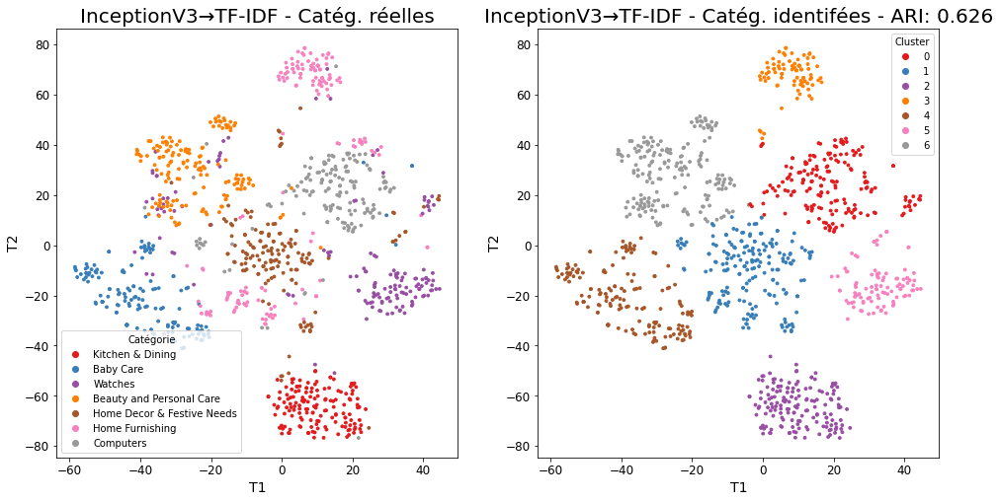

ARI : 0.6258


In [360]:
corpus_col = 'name_identif_bow_stem'

df_corpus = df_all[corpus_col].tolist()
df_tfidf_1gram, tfidf_1gram = main_tf_idf(df_corpus, 1)

plt.rcParams['figure.figsize'] = [10, 10]
plt.rcParams['axes.titlesize'] = 15
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12

ARI, X_tsne, labels = ARI_fct(df_tfidf_1gram, y_cat_num, n_cat)

plt.rcParams['figure.figsize'] = [16, 8]
plt.rcParams['axes.titlesize'] = 20
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
feature_extractor = 'InceptionV3→TF-IDF'
TSNE_visu_fct(X_tsne, l_cat, y_cat_num, labels, ARI, title_prefix=feature_extractor)

C'est compétitif avec nom + description (0.63) !

#### Nom + identification visuelle à 3 prédictions

ARI :  0.6518 time :  9.0


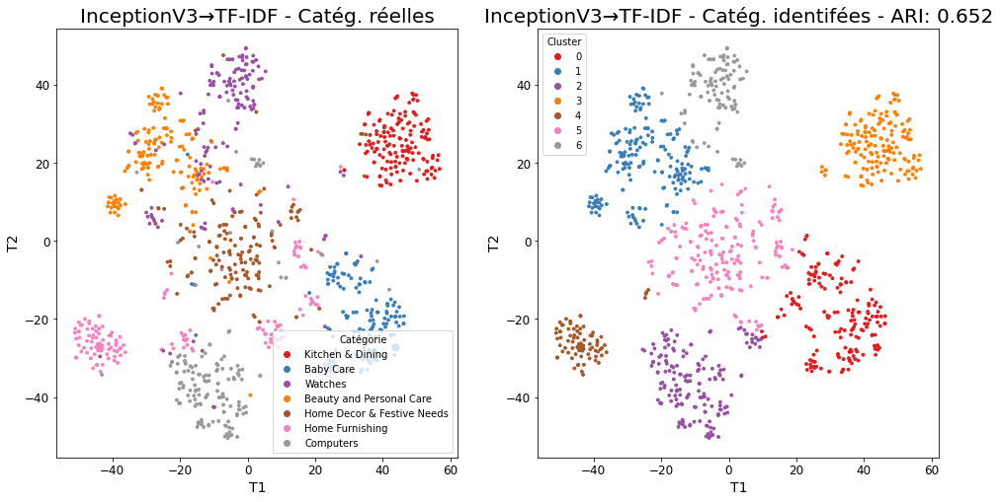

ARI : 0.6518


In [361]:
corpus_col = 'name_identif_3_bow_stem'

df_corpus = df_all[corpus_col].tolist()
df_tfidf_1gram, tfidf_1gram = main_tf_idf(df_corpus, 1)

plt.rcParams['figure.figsize'] = [10, 10]
plt.rcParams['axes.titlesize'] = 15
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12

ARI, X_tsne, labels = ARI_fct(df_tfidf_1gram, y_cat_num, n_cat)

plt.rcParams['figure.figsize'] = [16, 8]
plt.rcParams['axes.titlesize'] = 20
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
feature_extractor = 'InceptionV3→TF-IDF'
TSNE_visu_fct(X_tsne, l_cat, y_cat_num, labels, ARI, title_prefix=feature_extractor)

C'est **légèrement mieux** que nom + description (0.63) ! Voilà une "expérience vendeur" intéressante : pas besoin d'entrer une description pour la classification de son produit. Maintenant, il voudra sûrement en entrer une pour ses clients 😆  

#### Nom + identification visuelle fiable

ARI :  0.6187 time :  10.0


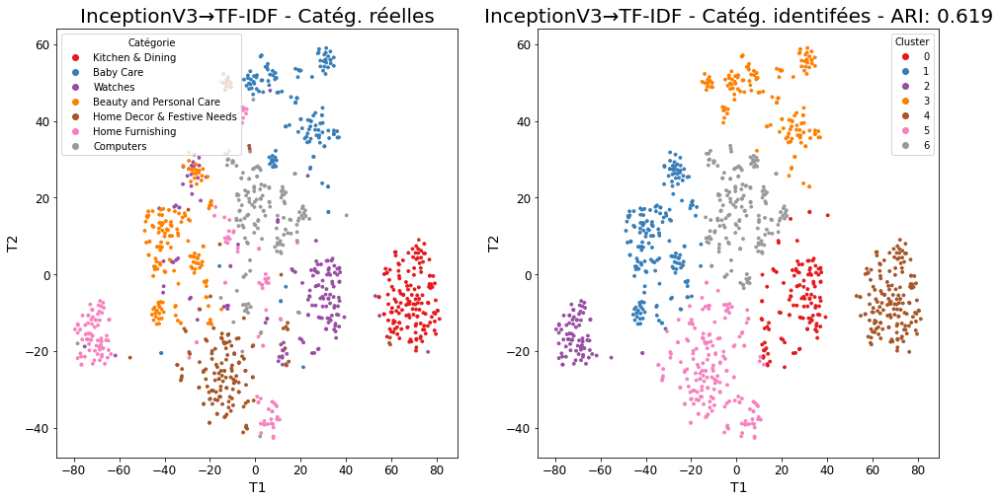

ARI : 0.6187


In [362]:
corpus_col = 'name_identif_trusted_bow_stem'

df_corpus = df_all[corpus_col].tolist()
df_tfidf_1gram, tfidf_1gram = main_tf_idf(df_corpus, 1)

plt.rcParams['figure.figsize'] = [10, 10]
plt.rcParams['axes.titlesize'] = 15
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12

ARI, X_tsne, labels = ARI_fct(df_tfidf_1gram, y_cat_num, n_cat)

plt.rcParams['figure.figsize'] = [16, 8]
plt.rcParams['axes.titlesize'] = 20
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
feature_extractor = 'InceptionV3→TF-IDF'
TSNE_visu_fct(X_tsne, l_cat, y_cat_num, labels, ARI, title_prefix=feature_extractor)

Ah, ne garder que les prédictions fiables (>0.33) dégrade légèrement le score des 3 meilleures prédictions :/

#### Nom + description + identification visuelle à 1 prédiction

ARI :  0.6251 time :  12.0


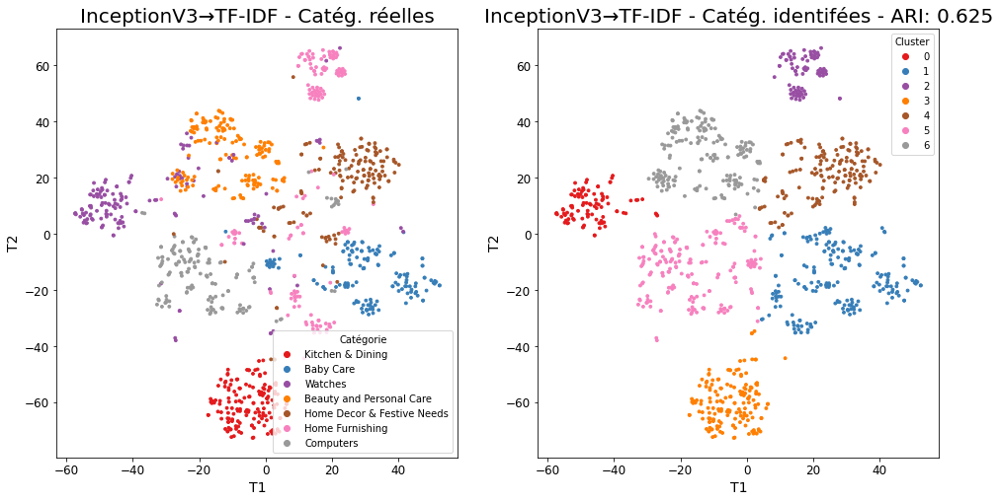

ARI : 0.6251


In [363]:
corpus_col = 'name_desc_identif_bow_stem'

df_corpus = df_all[corpus_col].tolist()
df_tfidf_1gram, tfidf_1gram = main_tf_idf(df_corpus, 1)

plt.rcParams['figure.figsize'] = [10, 10]
plt.rcParams['axes.titlesize'] = 15
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12

ARI, X_tsne, labels = ARI_fct(df_tfidf_1gram, y_cat_num, n_cat)

plt.rcParams['figure.figsize'] = [16, 8]
plt.rcParams['axes.titlesize'] = 20
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
feature_extractor = 'InceptionV3→TF-IDF'
TSNE_visu_fct(X_tsne, l_cat, y_cat_num, labels, ARI, title_prefix=feature_extractor)

Avec une seule identification, on a légèrement dégradé par rapport au nom+description seul, sans identification (0.63).

#### Nom + description + identification visuelle à 3 prédictions

ARI :  0.6534 time :  18.0


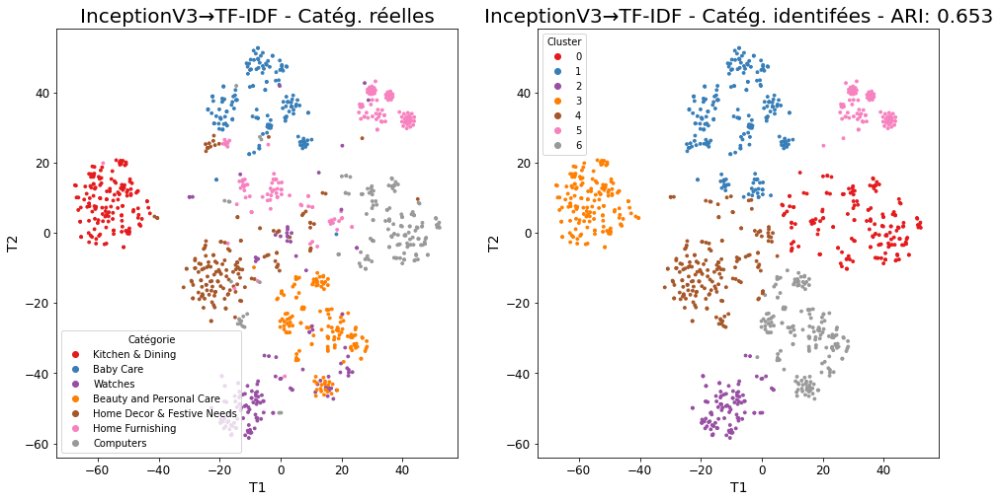

ARI : 0.6534


In [364]:
corpus_col = 'name_desc_identif_3_bow_stem'

df_corpus = df_all[corpus_col].tolist()
df_tfidf_1gram, tfidf_1gram = main_tf_idf(df_corpus, 1)

plt.rcParams['figure.figsize'] = [10, 10]
plt.rcParams['axes.titlesize'] = 15
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12

ARI, X_tsne, labels = ARI_fct(df_tfidf_1gram, y_cat_num, n_cat)

plt.rcParams['figure.figsize'] = [16, 8]
plt.rcParams['axes.titlesize'] = 20
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
feature_extractor = 'InceptionV3→TF-IDF'
TSNE_visu_fct(X_tsne, l_cat, y_cat_num, labels, ARI, title_prefix=feature_extractor)

Avec les 3 premières identifications, on a **amélioré** (0.68 | 0.63) !

#### Nom + description + identification visuelle fiable

ARI :  0.5514 time :  11.0


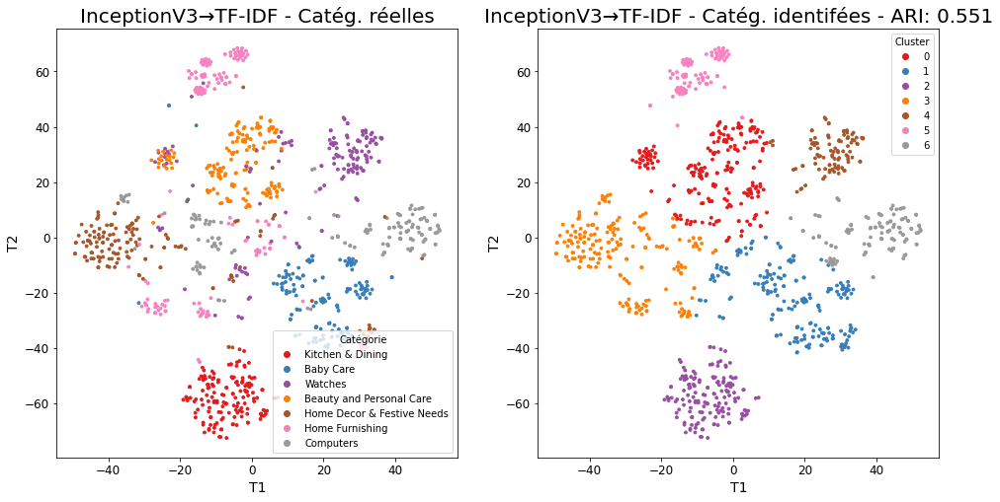

ARI : 0.5514


In [365]:
corpus_col = 'name_desc_identif_trusted_bow_stem'

df_corpus = df_all[corpus_col].tolist()
df_tfidf_1gram, tfidf_1gram = main_tf_idf(df_corpus, 1)

plt.rcParams['figure.figsize'] = [10, 10]
plt.rcParams['axes.titlesize'] = 15
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12

ARI, X_tsne, labels = ARI_fct(df_tfidf_1gram, y_cat_num, n_cat)

plt.rcParams['figure.figsize'] = [16, 8]
plt.rcParams['axes.titlesize'] = 20
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
feature_extractor = 'InceptionV3→TF-IDF'
TSNE_visu_fct(X_tsne, l_cat, y_cat_num, labels, ARI, title_prefix=feature_extractor)

**Avec les identifications jugées fiables seulement, ajoutées au nom+description, on obtient le meilleur score.**

### Word2vec

#### Nom seul

Build & train Word2Vec model ...
Fit Tokenizer ...
Create Embedding matrix ...
Making Embedding model ...
Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_14 (InputLayer)       [(None, 50)]              0         
                                                                 
 embedding_2 (Embedding)     (None, 50, 50)            101950    
                                                                 
 global_average_pooling1d_2   (None, 50)               0         
 (GlobalAveragePooling1D)                                        
                                                                 
Total params: 101,950
Trainable params: 101,950
Non-trainable params: 0
_________________________________________________________________
Predicting embeddings...
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VER

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
33/33 [==============================] - 0s 2ms/step
ARI :  0.4609 time :  9.0


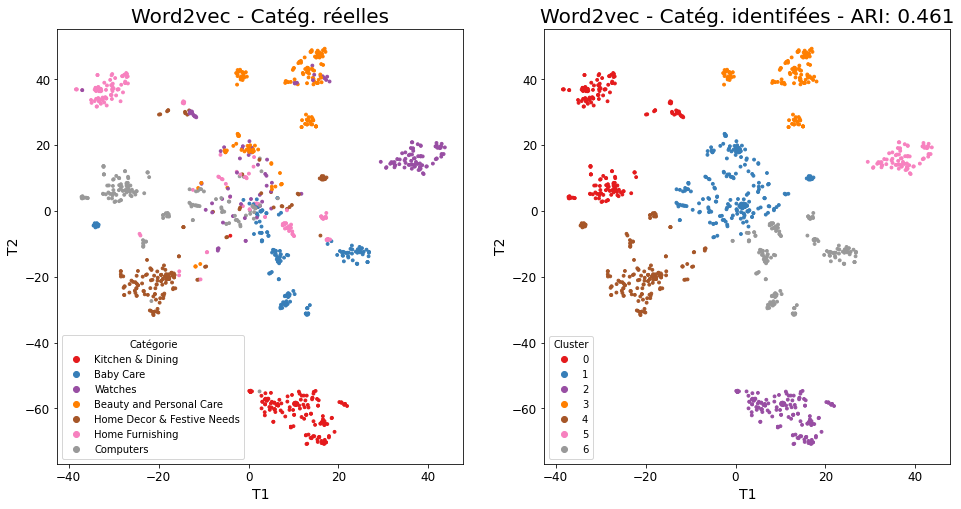

ARI : 0.4609


In [366]:
sentences = df_tk['product_name'].to_list()
sentences = [gensim.utils.simple_preprocess(text) for text in sentences]
verbose = 1
embeddings_word2vec = main_word2vec(sentences, w2v_size, w2v_window, w2v_min_count, w2v_epochs, maxlen, verbose=verbose)
ARI, X_tsne, labels = ARI_fct(embeddings_word2vec, y_cat_num, n_cat)
plt.rcParams['figure.figsize'] = [16, 8]
plt.rcParams['axes.titlesize'] = 20
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
feature_extractor = 'Word2vec'
TSNE_visu_fct(X_tsne, l_cat, y_cat_num, labels, ARI, title_prefix=feature_extractor)

#### Identifications seules

In [367]:
w2v_size=300
w2v_window=5
w2v_min_count=1
w2v_epochs=100
maxlen = 24 # adapt to length of sentences

In [ ]:
for corpus_col in ['identified_object', 
                   'identified_object_3',
                   'identified_object_trusted']:
    txt = f"Colonne pour le corpus = {corpus_col}"
    print("\n"+bcolors.HEADER+bcolors.BOLD+txt+bcolors.ENDC)
    sentences = df_all[corpus_col].to_list()
    sentences = [gensim.utils.simple_preprocess(text) for text in sentences]

    verbose = 1
    embeddings_word2vec = main_word2vec(sentences, w2v_size, w2v_window, w2v_min_count, w2v_epochs, maxlen, verbose=verbose)

    ARI, X_tsne, labels = ARI_fct(embeddings_word2vec, y_cat_num, n_cat)

    plt.rcParams['figure.figsize'] = [16, 8]
    plt.rcParams['axes.titlesize'] = 20
    plt.rcParams['axes.labelsize'] = 14
    plt.rcParams['xtick.labelsize'] = 12
    plt.rcParams['ytick.labelsize'] = 12
    feature_extractor = 'InceptionV3→Word2Vec'
    TSNE_visu_fct(X_tsne, l_cat, y_cat_num, labels, ARI, title_prefix=feature_extractor)

#### Ajout des prédictions sur image

In [ ]:
for corpus_col in ['name_identif_bow_lem', 'name_identif_bow_stem',
                   'name_desc_identif_bow_lem', 'name_desc_identif_bow_stem',
                   'name_identif_3_bow_lem', 'name_identif_3_bow_stem',
                   'name_desc_identif_3_bow_lem', 'name_desc_identif_3_bow_stem',
                   'name_identif_trusted_bow_lem', 'name_identif_trusted_bow_stem',
                   'name_desc_identif_trusted_bow_lem', 'name_desc_identif_trusted_bow_stem']:
    txt = f"Colonne pour le corpus = {corpus_col}"
    print("\n"+bcolors.HEADER+bcolors.BOLD+txt+bcolors.ENDC)
    sentences = df_all[corpus_col].to_list()
    sentences = [gensim.utils.simple_preprocess(text) for text in sentences]

    verbose = 1
    embeddings_word2vec = main_word2vec(sentences, w2v_size, w2v_window, w2v_min_count, w2v_epochs, maxlen, verbose=verbose)

    ARI, X_tsne, labels = ARI_fct(embeddings_word2vec, y_cat_num, n_cat)

    plt.rcParams['figure.figsize'] = [16, 8]
    plt.rcParams['axes.titlesize'] = 15
    plt.rcParams['axes.labelsize'] = 12
    plt.rcParams['xtick.labelsize'] = 12
    plt.rcParams['ytick.labelsize'] = 12
    feature_extractor = 'InceptionV3→Word2Vec'
    TSNE_visu_fct(X_tsne, l_cat, y_cat_num, labels, ARI, title_prefix=feature_extractor)

Ajouter la description dégrade à chaque fois les performances de Word2vec (~0.35) !
Garder 1 ou 3 ou les prédictions fiables le rendent compétitifs (~0.60).

### USE

In [370]:
batch_size = 10

In [371]:
df_all.columns

Index(['categs_1st', 'categs_2nd', 'product_name', 'name_AND_description',
       'image', 'sentence_bow', 'sentence_bow_lem', 'sentence_bow_stem',
       'sentence_dl', 'categs_1st_num', 'label_TF-IDF-1', 'label_word2vec',
       'name_bow', 'name_bow_lem', 'name_bow_stem', 'name_dl', 'label_GloVe',
       'label_TF-IDF', 'label_VGG-16', 'label_InceptionV3', 'label_ResNet50',
       'label_TF-IDF+InceptionV3', 'identified_object', 'identified_object_3',
       'identified_object_trusted', 'name_and_identification',
       'name_and_desc_and_identif', 'name_and_identification_3',
       'name_and_desc_and_identif_3', 'name_and_identification_trusted',
       'name_and_desc_and_identif_trusted', 'name_identif_bow',
       'name_identif_bow_lem', 'name_identif_bow_stem', 'name_identif_dl',
       'name_desc_identif_bow', 'name_desc_identif_bow_lem',
       'name_desc_identif_bow_stem', 'name_desc_identif_dl',
       'name_identif_3_bow', 'name_identif_3_bow_lem',
       'name_identif_3_b

In [ ]:
for corpus_col in ['name_identif_dl',
                   'name_desc_identif_dl',
                   'name_identif_3_dl',
                   'name_desc_identif_3_dl',
                   'name_identif_trusted_dl',
                   'name_desc_identif_trusted_dl']:
    txt = f"Colonne pour le corpus = {corpus_col}"
    print("\n"+bcolors.HEADER+bcolors.BOLD+txt+bcolors.ENDC)
    sentences = df_all[corpus_col].to_list()
    features_USE = feature_USE_fct(sentences, batch_size)
    ARI, X_tsne, labels = ARI_fct(features_USE, y_cat_num, n_cat)
    feature_extractor = 'InceptionV3→USE'
    TSNE_visu_fct(X_tsne, l_cat, y_cat_num, labels, ARI, title_prefix=feature_extractor)

Mieux que sans l'identification mais avec la description ! 

#### Nom, descripion et identification 

In [373]:
batch_size = 10
sentences = df_all['name_desc_identif_dl'].to_list()

In [374]:
features_USE = feature_USE_fct(sentences, batch_size)

In [375]:
ARI, X_tsne, labels = ARI_fct(features_USE, y_cat_num, n_cat)

ARI :  0.5273 time :  9.0


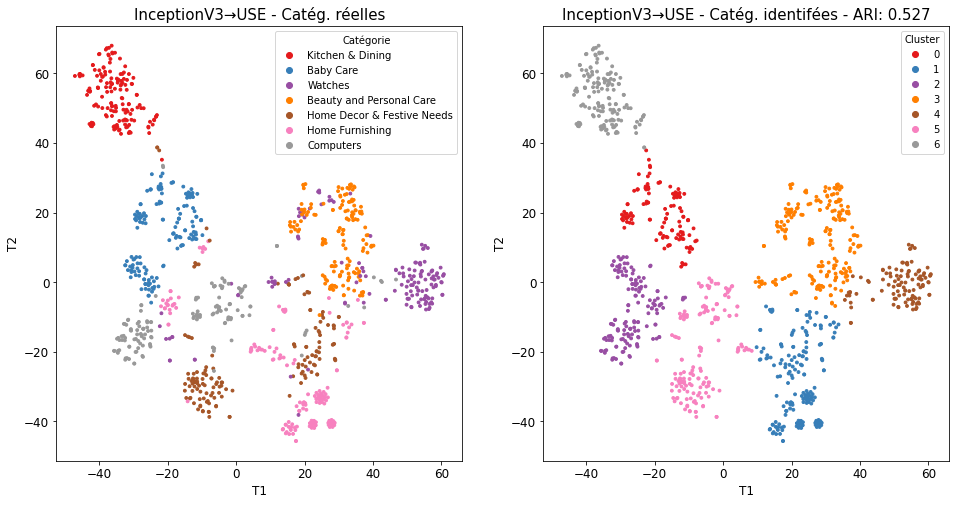

ARI : 0.5273


In [377]:
feature_extractor = 'InceptionV3→USE'
TSNE_visu_fct(X_tsne, l_cat, y_cat_num, labels, ARI, title_prefix=feature_extractor)

La combinaison texte+image ne donne décidément pas de meilleurs résultats que le texte seul.